In [7]:
import pandas as pd
import numpy as np
import xgboost as xgb
import lightgbm as lgb
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler, RobustScaler, OrdinalEncoder
from sklearn.naive_bayes import GaussianNB, BernoulliNB
from visualization_features import plot_feature_importance, evaluate_model, get_feature_importance, get_feature_names, get_feature_names_nb
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency, ttest_ind, mannwhitneyu
from sklearn.impute import KNNImputer
from sklearn.metrics import recall_score
from scipy import stats
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.compose import ColumnTransformer
from joblib import dump
from sklearn.inspection import permutation_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import KFold
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import KNNImputer, IterativeImputer
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import gaussian_kde
from scipy.stats import randint, uniform, loguniform

In [45]:
df = pd.read_excel('preprocessed_data_base_models.xlsx')

Тут уже предобработанные данные. Весь процесс eda в файле eda_analysis_base_models.ipynb

In [3]:
df.shape

(492064, 30)

In [112]:
df.head()

,Уровень,Заказчик,ИНН заказчика,Стоимость(руб.) Заказчик,Реестровый номер публикации,Сфера деятельности,Регион поставки,Город поставки,Дата публикации,Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ,...,"Обеспечение контракта, %",РНП сейчас,РНП ранее,Выручка,Персонал,Target,Допущен,Субъект поставщика,Город поставщика,Сводный риск
0,1,"АНО ""ДФИКММ ЧО""",7451432207,1.464126e+07,0321718002DP,"[ОКПД2 27.20] Батареи и аккумуляторы, [ОКВЭД2 ...",Челябинская область,Челябинск,2018-12-14 12:35:50,2018-12-19 13:00:00,...,0.05,0,0,3.639350e+08,1.0,1,1,Челябинская область,Челябинск,Низкий риск
1,2,"АНО ""ДФИКММ ЧО""",7451432207,8.533394e+05,0321718003DP,[ОКПД2 28.25] Оборудование промышленное холоди...,Челябинская область,Челябинск,2018-12-14 12:39:28,2018-12-19 13:00:00,...,0.05,0,0,1.269900e+07,14.0,0,0,Челябинская область,Челябинск,Высокий риск
2,2,"АНО ""ДФИКММ ЧО""",7451432207,8.533394e+05,0321718003DP,[ОКПД2 28.25] Оборудование промышленное холоди...,Челябинская область,Челябинск,2018-12-14 12:39:28,2018-12-19 13:00:00,...,0.05,0,0,4.652704e+09,104.0,1,1,Москва город,Москва,Низкий риск
3,2,"ООО ""ЗНСМ""",7710305634,8.533394e+05,1000111,[ОКПД2 41.20] Здания и работы по возведению зд...,Архангельская область,Архангельская область,2018-04-06 12:16:40,2018-04-23 12:00:00,...,0.05,0,0,9.009080e+08,8.5,1,1,Коми республика,Усинск,Низкий риск
4,2,"ООО ""ЗНСМ""",7710305634,8.533394e+05,1000111,[ОКПД2 41.20] Здания и работы по возведению зд...,Архангельская область,Архангельская область,2018-04-06 12:16:40,2018-04-23 12:00:00,...,0.05,0,0,1.520000e+06,8.5,0,0,Адыгея республика,Яблоновский,Высокий риск


In [113]:
df.dtypes

Уровень                                                                                                                         int64
Заказчик                                                                                                                       object
ИНН заказчика                                                                                                                   int64
Стоимость(руб.) Заказчик                                                                                                      float64
Реестровый номер публикации                                                                                                    object
Сфера деятельности                                                                                                             object
Регион поставки                                                                                                                object
Город поставки                                                

In [114]:
df.isnull().sum()

Уровень                                                                                                                0
Заказчик                                                                                                               0
ИНН заказчика                                                                                                          0
Стоимость(руб.) Заказчик                                                                                               0
Реестровый номер публикации                                                                                            0
Сфера деятельности                                                                                                     0
Регион поставки                                                                                                        0
Город поставки                                                                                                         0
Дата публикации                 

In [115]:
df.columns

Index(['Уровень', 'Заказчик', 'ИНН заказчика', 'Стоимость(руб.) Заказчик',
       'Реестровый номер публикации', 'Сфера деятельности', 'Регион поставки',
       'Город поставки', 'Дата публикации',
       'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ',
       'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ',
       'Дата окончания проведения торгов', 'Поставщик', 'ИНН поставщика',
       'Снижение на торгах,%', 'Форма публикации', 'Тип торгов',
       'Обеспечение заявки (руб.)', 'Обеспечение заявки, %',
       'Обеспечение контракта (руб.)', 'Обеспечение контракта, %',
       'РНП сейчас', 'РНП ранее', 'Выручка', 'Персонал', 'Target', 'Допущен',
       'Субъект поставщика', 'Город поставщика', 'Сводный риск'],
      dtype='object')

In [46]:
df['Год'] = df['Дата публикации'].dt.year
df['Месяц'] = df['Дата публикации'].dt.month

train_data = df[df['Год'].isin(range(2015, 2020))]

# НОВЫЕ ПРИЗНАКИ

df['Процент побед'] = train_data.groupby(['ИНН поставщика'])['Target'].transform(lambda x: (x==1).sum() / len(x))

df['Кол-во участий по региону'] = train_data.groupby(['ИНН поставщика', 'Регион поставки'])['Target'].transform('count')
df['Кол-во побед по региону'] = train_data.groupby(['ИНН поставщика', 'Регион поставки'])['Target'].transform(lambda x: (x==1).sum())
df['Процент побед по региону'] = df['Кол-во побед по региону'] / df['Кол-во участий по региону']

df['Кол-во участий по заказчику'] = train_data.groupby(['ИНН поставщика', 'Заказчик'])['Target'].transform('count')
df['Кол-во побед по заказчику'] = train_data.groupby(['ИНН поставщика', 'Заказчик'])['Target'].transform(lambda x: (x==1).sum())
df['Процент побед по заказчику'] = df['Кол-во побед по заказчику'] / df['Кол-во участий по заказчику']

df['Кол-во участий по сфере'] = train_data.groupby(['ИНН поставщика', 'Сфера деятельности'])['Target'].transform('count')
df['Кол-во побед по сфере'] = train_data.groupby(['ИНН поставщика', 'Сфера деятельности'])['Target'].transform(lambda x: (x==1).sum())
df['Процент побед по сфере'] = df['Кол-во побед по сфере'] / df['Кол-во участий по сфере']

df['Общее кол-во участий'] = train_data.groupby('ИНН поставщика')['Target'].transform('count')
df['Общее кол-во побед'] = train_data.groupby('ИНН поставщика')['Target'].transform(lambda x: (x==1).sum())

df['Среднее снижение цены'] = train_data.groupby('ИНН поставщика')['Снижение на торгах,%'].transform('mean')

df['Последняя дата публикации'] = df.groupby("ИНН поставщика")["Дата публикации"].transform("max")
df['Последняя дата публикации'] = pd.to_datetime(df['Последняя дата публикации'], format='%Y-%m-%d', errors='coerce')

df['Кол-во конкурентов в тендере'] = train_data.groupby('Реестровый номер публикации')['ИНН поставщика'].transform('count') - 1

df['Среднее кол-во конкурентов в регионе'] = df.groupby('Регион поставки')['Кол-во конкурентов в тендере'].transform('mean')
df['Среднее кол-во конкурентов в сфере'] = df.groupby('Сфера деятельности')['Кол-во конкурентов в тендере'].transform('mean')
df['Среднее кол-во конкурентов у заказчика'] = df.groupby('ИНН заказчика')['Кол-во конкурентов в тендере'].transform('mean')

df['Длительность тендера (дни)'] = (train_data['Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ'] - train_data['Дата публикации']).dt.days

df['Кол-во уникальных поставщиков в регионе'] = train_data.groupby('Регион поставки')['ИНН поставщика'].transform('nunique')
df['Кол-во уникальных поставщиков в сфере'] = train_data.groupby('Сфера деятельности')['ИНН поставщика'].transform('nunique')

In [47]:
print(train_data.shape)
print(df.shape)

(382234, 32)
(492064, 53)


In [47]:
new_features = ['Процент побед', 'Кол-во участий по региону', 'Кол-во побед по региону',
    'Процент побед по региону', 'Кол-во участий по заказчику', 'Кол-во побед по заказчику',
    'Процент побед по заказчику', 'Кол-во участий по сфере', 'Кол-во побед по сфере',
    'Процент побед по сфере', 'Общее кол-во участий', 'Общее кол-во побед',
    'Среднее снижение цены', 'Последняя дата публикации', 'Кол-во конкурентов в тендере',
    'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
    'Среднее кол-во конкурентов у заказчика', 'Длительность тендера (дни)',
    'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере'
    ]

for col in new_features:
    print(f"Столбец: {col}")
    print(f"Тип данных: {df[col].dtype}")
    print(f"Количество уникальных значений: {df[col].nunique()}")
    print(f"Количество пропущенных значений: {df[col].isna().sum()}")
    if df[col].nunique() <= 10:
        print(f"Уникальные значения: {df[col].unique()}")
    print("-" * 20)

Столбец: Процент побед
Тип данных: float64
Количество уникальных значений: 930
Количество пропущенных значений: 109830
--------------------
Столбец: Кол-во участий по региону
Тип данных: float64
Количество уникальных значений: 157
Количество пропущенных значений: 109830
--------------------
Столбец: Кол-во побед по региону
Тип данных: float64
Количество уникальных значений: 98
Количество пропущенных значений: 109830
--------------------
Столбец: Процент побед по региону
Тип данных: float64
Количество уникальных значений: 631
Количество пропущенных значений: 109830
--------------------
Столбец: Кол-во участий по заказчику
Тип данных: float64
Количество уникальных значений: 117
Количество пропущенных значений: 109830
--------------------
Столбец: Кол-во побед по заказчику
Тип данных: float64
Количество уникальных значений: 85
Количество пропущенных значений: 109830
--------------------
Столбец: Процент побед по заказчику
Тип данных: float64
Количество уникальных значений: 357
Количество 

In [48]:
numeric_cols = [
    'Кол-во участий по региону',
    'Кол-во участий по заказчику',
    'Кол-во участий по сфере',
    'Общее кол-во участий',
    'Кол-во уникальных поставщиков в регионе',
    'Кол-во уникальных поставщиков в сфере',
    'Процент побед',
    'Кол-во побед по региону',
    'Процент побед по региону',
    'Кол-во побед по заказчику',
    'Процент побед по заказчику',
    'Кол-во побед по сфере', 
    'Процент побед по сфере', 
    'Среднее снижение цены',
    'Общее кол-во побед', 
    'Длительность тендера (дни)',
    'Среднее кол-во конкурентов в регионе',
    'Среднее кол-во конкурентов в сфере',
    'Среднее кол-во конкурентов у заказчика',
    'Кол-во конкурентов в тендере']

In [120]:
df.columns

Index(['Уровень', 'Заказчик', 'ИНН заказчика', 'Стоимость(руб.) Заказчик',
       'Реестровый номер публикации', 'Сфера деятельности', 'Регион поставки',
       'Город поставки', 'Дата публикации',
       'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ',
       'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ',
       'Дата окончания проведения торгов', 'Поставщик', 'ИНН поставщика',
       'Снижение на торгах,%', 'Форма публикации', 'Тип торгов',
       'Обеспечение заявки (руб.)', 'Обеспечение заявки, %',
       'Обеспечение контракта (руб.)', 'Обеспечение контракта, %',
       'РНП сейчас', 'РНП ранее', 'Выручка', 'Персонал', 'Target', 'Допущен',
       'Субъект поставщика', 'Город поставщика', 'Сводный риск', 'Год',
       'Месяц', 'Процент побед', 'Кол-во участий по региону',
       'Кол-во побед по региону', 'Процент побед по региону',
       'Кол-во участий по заказчику', 'Кол

In [49]:
def fill_median(data, target_column, group_columns=['Сфера деятельности', 'Регион поставки']):
    result = data[target_column].copy()
    temp_data = pd.concat([df[group_columns], result], axis=1)
        
    # медиана по всем столбцам из group_columns
    group_medians = temp_data.groupby(group_columns)[target_column].transform('median')
    result = result.fillna(group_medians)
        
    # медиана по каждой группе отдельно
    for group in group_columns:
        mask = result.isna()
        if mask.any():
            group_medians = temp_data.groupby(group)[target_column].transform('median')
            result = result.fillna(group_medians)
    
    # медиана по всем столбцам
    overall_median = result.median()
    if pd.isna(overall_median):
        overall_median = 0
    
    result = result.fillna(overall_median)
    
    return result

def format_number(x):
    if pd.isna(x):
        return "NA"
    if isinstance(x, (int, float)):
        return f"{x:,.2f}".replace(",", " ")
    return str(x)

In [51]:
def compare_imputation_methods_simple(column_name):
    complete_data = df[[column_name]].dropna()
    print(f"\nАнализ столбца: {column_name}")
    complete_data = complete_data.sample(n=50000, random_state=42)
    
    imputers = {
        'KNN': KNNImputer(n_neighbors=10, weights='distance'),
        'GroupMedian': lambda x: fill_median(x, x.columns[0]).values.reshape(-1, 1),
        'Iterative': IterativeImputer(
            estimator=RandomForestRegressor(
                n_estimators=50,
                max_depth=5,
                random_state=42
            ),
            initial_strategy='median',
            max_iter=5,
            random_state=42
        )
    }
    
    for missing_pct in [0.15, 0.30]:
        print(f"\nТестирование с {missing_pct*100}% пропусков")
        print(f"{'='*50}")
        
        n_splits = 3
        kf = KFold(n_splits=n_splits, shuffle=True, random_state=42)
        
        metrics_cv = {name: {'MSE': [], 'MAE': [], 'MAPE': []} for name in imputers.keys()}
        distribution_all = {name: [] for name in imputers.keys()}
        
        for train_idx, test_idx in kf.split(complete_data):
            train_data = complete_data.iloc[train_idx]
            test_data = complete_data.iloc[test_idx]
            
            df_eval = complete_data.copy()
            np.random.seed(42)
            eval_mask = np.random.rand(len(test_idx)) < missing_pct
            test_mask = np.zeros(len(complete_data), dtype=bool)
            test_mask[test_idx[eval_mask]] = True
            df_eval.loc[test_mask, column_name] = np.nan
            
            original_values = complete_data[column_name].values
            
            for name, imputer in imputers.items():
                if name == 'GroupMedian':
                    filled_values = imputer(df_eval)
                else:
                    train_data_with_missing = df_eval.iloc[train_idx]
                    imputer.fit(train_data_with_missing)
                    filled_values = imputer.transform(df_eval)
                
                true_vals = original_values[test_mask]
                pred_vals = filled_values[test_mask]
                
                metrics_cv[name]['MSE'].append(mean_squared_error(true_vals, pred_vals))
                metrics_cv[name]['MAE'].append(mean_absolute_error(true_vals, pred_vals))
                
                non_zero_mask = true_vals != 0
                if non_zero_mask.any():
                    mape = np.mean(np.abs((true_vals[non_zero_mask] - pred_vals[non_zero_mask]) / 
                                        true_vals[non_zero_mask])) * 100
                    metrics_cv[name]['MAPE'].append(mape)
                
                distribution_all[name].append(pd.Series(filled_values.flatten()).describe())
        
        distribution_comparison = {'Оригинал': complete_data[column_name].describe().apply(format_number)}
        metrics_comparison = {}
        
        for name in imputers.keys():
            avg_distribution = pd.concat(distribution_all[name]).groupby(level=0).mean()
            distribution_comparison[f'Заполнено_{name}'] = avg_distribution.apply(format_number)
            
            metrics = {
                'MSE': np.mean(metrics_cv[name]['MSE']),
                'MAE': np.mean(metrics_cv[name]['MAE']),
                'MAPE': np.mean(metrics_cv[name]['MAPE']) if metrics_cv[name]['MAPE'] else None
            }
            
            metrics_comparison[name] = {
                k: f"{v:.2f}%" if k == 'MAPE' and v is not None else format_number(v)
                for k, v in metrics.items()
            }
        
        print("\nСравнение распределений:")
        print(pd.DataFrame(distribution_comparison))
        
        print("\nМетрики ошибок:")
        print(pd.DataFrame(metrics_comparison).T)

for col in numeric_cols:
    results = compare_imputation_methods_simple(col)


Анализ столбца: Кол-во участий по региону

Тестирование с 15.0% пропусков

Сравнение распределений:
        Оригинал Заполнено_KNN Заполнено_GroupMedian Заполнено_Iterative
25%         1.00          1.00                  1.00                1.00
50%         4.00          4.00                  4.00                4.00
75%        12.00         16.00                 12.00               11.00
count  50 000.00     50 000.00             50 000.00           50 000.00
max     1 199.00      1 199.00              1 199.00            1 199.00
mean       19.83         19.85                 19.46               19.05
min         1.00          1.00                  1.00                1.00
std        78.40         76.30                 76.71               76.38

Метрики ошибок:
                  MSE    MAE     MAPE
KNN          6 433.73  25.12  757.62%
GroupMedian  6 706.68  16.82  468.51%
Iterative    6 670.74  17.75  128.09%

Тестирование с 30.0% пропусков

Сравнение распределений:
        Оригина

В каждом случае будем смотреть, где распределение сохранилось лучше всего

Также стоит обратить внимание на ошибки:

Будем смотреть на МАЕ для всех количественных признаков.У них большой разброс значений, MSE будет слишком чувствителен к выбросам, а MAPE может давать искаженные результаты из-за небольших значений (где они есть), МАЕ будет оптимально, можем и на MAPE смотреть

Для процентных будем больше  внимание обращать на MSE, так как MSE сильнее штрафует большие ошибки, что важно для процентов

Длительность тендера - большинство значений - в маленьком диапазоне (7-12), большие выбросы, лучше МАЕ

Все, что связано со временем и количество конкурентов - MAE, важна абсолютная точность. Ошибка в 1 конкурента одинаково важна независимо от общего числа

1. Кол-во участий по региону - GroupMedian, лучше сохранило распределение
2. Кол-во участий по заказчику - аналогично
3. Кол-во участий по сфере - аналогично
4. Общее кол-во участий - по распределению ближе GroupMedian
5. Кол-во уникальных поставщиков в регионе - GroupMedian
6. Кол-во уникальных поставщиков в сфере - GroupMedian
7. Процент побед - совсем немного лучше Iterative
8. Кол-во побед по региону - GroupMedian 
9. Процент побед по региону - совсем немного лучше Iterative
10. Кол-во побед по заказчику - GroupMedian
11. Процент побед по заказчику - совсем немного лучше Iterative
12. Кол-во побед по сфере - GroupMedian
13. Процент побед по сфере - Iterative
14. Среднее снижение цены - GroupMedian
15. Общее кол-во побед - GroupMedian, лучше сохранило распределение
16. Длительность тендера (дни) - GroupMedian, лучше сохранило распределение
17. Среднее кол-во конкурентов в регионе - GroupMedian
18. Среднее кол-во конкурентов в сфере - GroupMedian
19. Среднее кол-во конкурентов у заказчика - GroupMedian
20. Кол-во конкурентов в тендере - GroupMedian

In [50]:
imputation_methods = {
    'Iterative': [
        'Процент побед',
        'Процент побед по региону',
        'Процент побед по заказчику',
        'Процент побед по сфере'
    ],
    'GroupMedian': [
        'Кол-во участий по региону',
        'Кол-во участий по заказчику',
        'Кол-во участий по сфере',
        'Общее кол-во участий',
        'Кол-во уникальных поставщики в регионе',
        'Кол-во уникальных поставщики в сфере',
        'Кол-во побед по региону',
        'Кол-во побед по заказчику',
        'Кол-во побед по сфере',
        'Среднее снижение цены',
        'Общее кол-во побед',
        'Длительность тендера (дни)',
        'Среднее кол-во конкурентов в регионе',
        'Среднее кол-во конкурентов в сфере',
        'Среднее кол-во конкурентов у заказчика',
        'Кол-во конкурентов в тендере'
    ]
}

df_imputed = df.copy()

iterative_imputer = IterativeImputer(
    estimator=RandomForestRegressor(
        n_estimators=100,
        max_depth=10,
        random_state=42
    ),
    initial_strategy='median',
    max_iter=30,
    random_state=42
)

iterative_columns = imputation_methods['Iterative']
if iterative_columns:
    df_imputed[iterative_columns] = iterative_imputer.fit_transform(df[iterative_columns])

group_median_columns = [col for col in numeric_cols if col not in iterative_columns]
for column in group_median_columns:
    df_imputed[column] = fill_median(df, column)

c:\Users\host\AppData\Local\Programs\Python\Python313\Lib\site-packages\sklearn\impute\_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [8]:
group_median_columns = [col for col in numeric_cols if col not in iterative_columns]
for column in group_median_columns:
    df_imputed[column] = fill_median(df, column)

In [7]:
for column in numeric_cols:
    print("До импутации:")
    print(df[column].describe().round(2))
    print("\nПосле импутации:")
    print(df_imputed[column].describe().round(2))
    print("-" * 80)

До импутации:
count    382234.00
mean         19.44
std          76.90
min           1.00
25%           1.00
50%           4.00
75%          12.00
max        1199.00
Name: Кол-во участий по региону, dtype: float64

После импутации:
count    492064.00
mean         16.68
std          68.69
min           1.00
25%           2.00
50%           3.00
75%          10.00
max        1199.00
Name: Кол-во участий по региону, dtype: float64
--------------------------------------------------------------------------------
До импутации:
count    382234.00
mean          8.98
std          38.13
min           1.00
25%           1.00
50%           2.00
75%           4.00
max         657.00
Name: Кол-во участий по заказчику, dtype: float64

После импутации:
count    492064.00
mean          7.96
std          34.59
min           1.00
25%           1.00
50%           2.00
75%           3.00
max         657.00
Name: Кол-во участий по заказчику, dtype: float64
---------------------------------------------------

In [9]:
df[numeric_cols] = df_imputed[numeric_cols]

In [15]:
df = pd.read_excel('data_after_imputer.xlsx')

In [16]:
print(df.isnull().sum())

Уровень                                                                                                                0
Заказчик                                                                                                               0
ИНН заказчика                                                                                                          0
Стоимость(руб.) Заказчик                                                                                               0
Реестровый номер публикации                                                                                            0
Сфера деятельности                                                                                                     0
Регион поставки                                                                                                        0
Город поставки                                                                                                         0
Дата публикации                 

In [17]:
print("Количество пропусков в 'РНП сейчас':", df['РНП сейчас'].isnull().sum())
print("Уникальные значения 'РНП сейчас':", df['РНП сейчас'].unique())

Количество пропусков в 'РНП сейчас': 0
Уникальные значения 'РНП сейчас': [0]


In [10]:
df = df.drop('РНП сейчас', axis=1)

In [19]:
df['Стоимость(руб.) Заказчик'].describe().apply(format_number)

count            492 064.00
mean           8 487 393.40
std          346 379 584.23
min                    0.01
25%              305 646.07
50%              853 339.39
75%            2 121 620.00
max      214 829 922 014.64
Name: Стоимость(руб.) Заказчик, dtype: object

In [20]:
df['Выручка'].describe().apply(format_number)

count              492 064.00
mean         4 008 835 822.97
std         35 133 574 019.89
min                  1 000.00
25%             91 456 000.00
50%            155 756 000.00
75%            263 432 000.00
max      3 791 566 977 999.99
Name: Выручка, dtype: object

Как уже обсужадлось - логарифмируем выручку и стоимость

In [11]:
df['Выручка_log'] = np.log1p(df['Выручка'])
df['Стоимость_log'] = np.log1p(df['Стоимость(руб.) Заказчик'])

In [60]:
df.dtypes

Уровень                                                                                                                         int64
Заказчик                                                                                                                       object
ИНН заказчика                                                                                                                   int64
Стоимость(руб.) Заказчик                                                                                                      float64
Реестровый номер публикации                                                                                                    object
Сфера деятельности                                                                                                             object
Регион поставки                                                                                                                object
Город поставки                                                

In [22]:
df['Уровень'].unique()

array([1, 2])

In [12]:
cols = ['Уровень', 'Снижение на торгах,%', 'РНП ранее', 'Допущен', 'Год', 'Месяц', 
       'Обеспечение заявки (руб.)', 'Обеспечение заявки, %', 'Обеспечение контракта (руб.)',
       'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log', 'Персонал',
       'Процент побед', 'Кол-во участий по региону', 'Кол-во побед по региону',
       'Процент побед по региону', 'Кол-во участий по заказчику',
       'Кол-во побед по заказчику', 'Процент побед по заказчику',
       'Кол-во участий по сфере', 'Кол-во побед по сфере',
       'Процент побед по сфере', 'Общее кол-во участий', 'Общее кол-во побед',
       'Среднее снижение цены', 'Кол-во конкурентов в тендере',
       'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
       'Среднее кол-во конкурентов у заказчика', 'Длительность тендера (дни)',
       'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере']

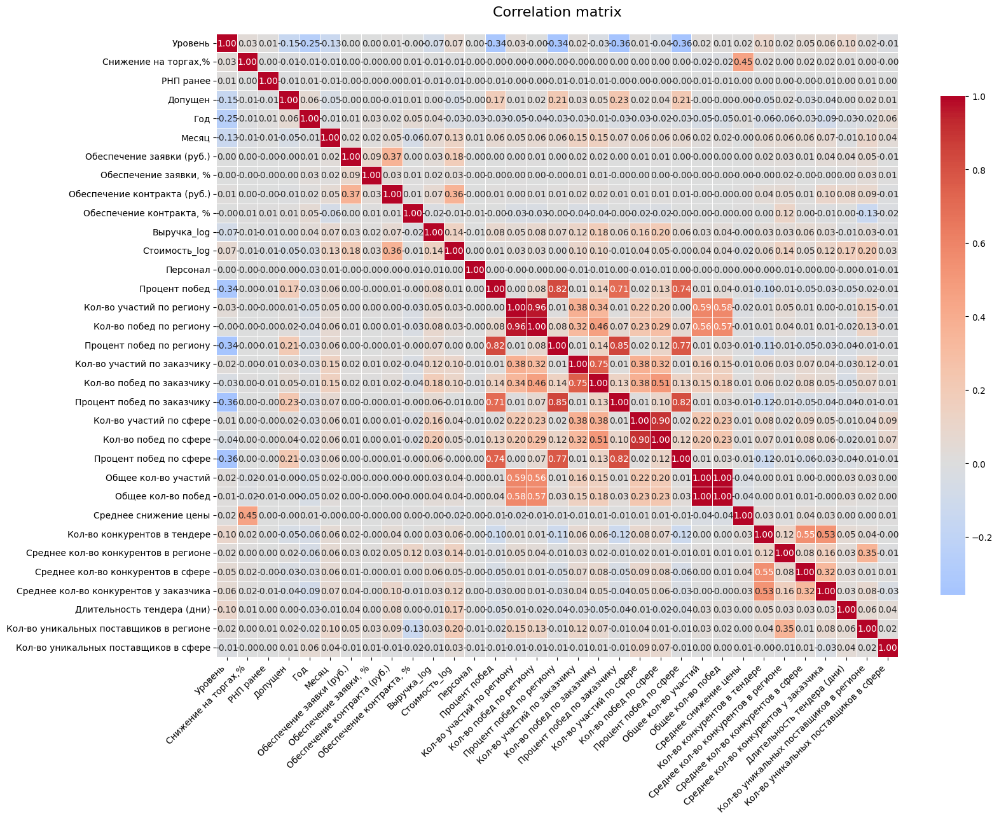

In [24]:
corr_matrix = df[cols].corr()

plt.figure(figsize=(17, 13))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)
plt.title("Correlation matrix", pad=20, fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

Количество побед и участий по региону сильно коррелируют, уберем количество участий по региону, то же самое с сферой. С заказчиком не настолько сильная корреляция - оставим

Очень высокая корреляция между общее количество побед и общее количество участий, последнее уберем

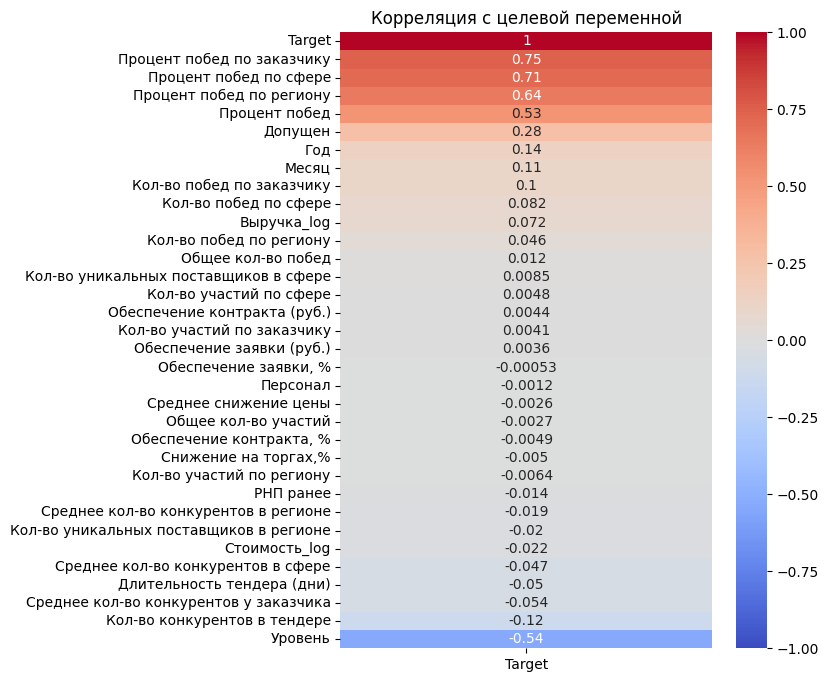

In [25]:
corr_with_target = df[cols + ['Target']].corr()[['Target']].sort_values('Target', ascending=False)

plt.figure(figsize=(6,8))
sns.heatmap(corr_with_target, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Корреляция с целевой переменной')
plt.show()

In [13]:
df = df.drop(columns=['Кол-во участий по региону', 'Кол-во участий по сфере', 'Общее кол-во участий'])

In [27]:
cols = ['Уровень', 'Снижение на торгах,%', 'РНП ранее', 'Допущен', 'Год', 'Месяц', 
       'Обеспечение заявки (руб.)', 'Обеспечение заявки, %', 'Обеспечение контракта (руб.)',
       'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log', 'Персонал',
       'Процент побед', 'Кол-во побед по региону',
       'Процент побед по региону', 'Кол-во участий по заказчику',
       'Кол-во побед по заказчику', 'Процент побед по заказчику',
       'Кол-во побед по сфере', 'Процент побед по сфере', 'Общее кол-во побед',
       'Среднее снижение цены', 'Кол-во конкурентов в тендере',
       'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
       'Среднее кол-во конкурентов у заказчика', 'Длительность тендера (дни)',
       'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере']

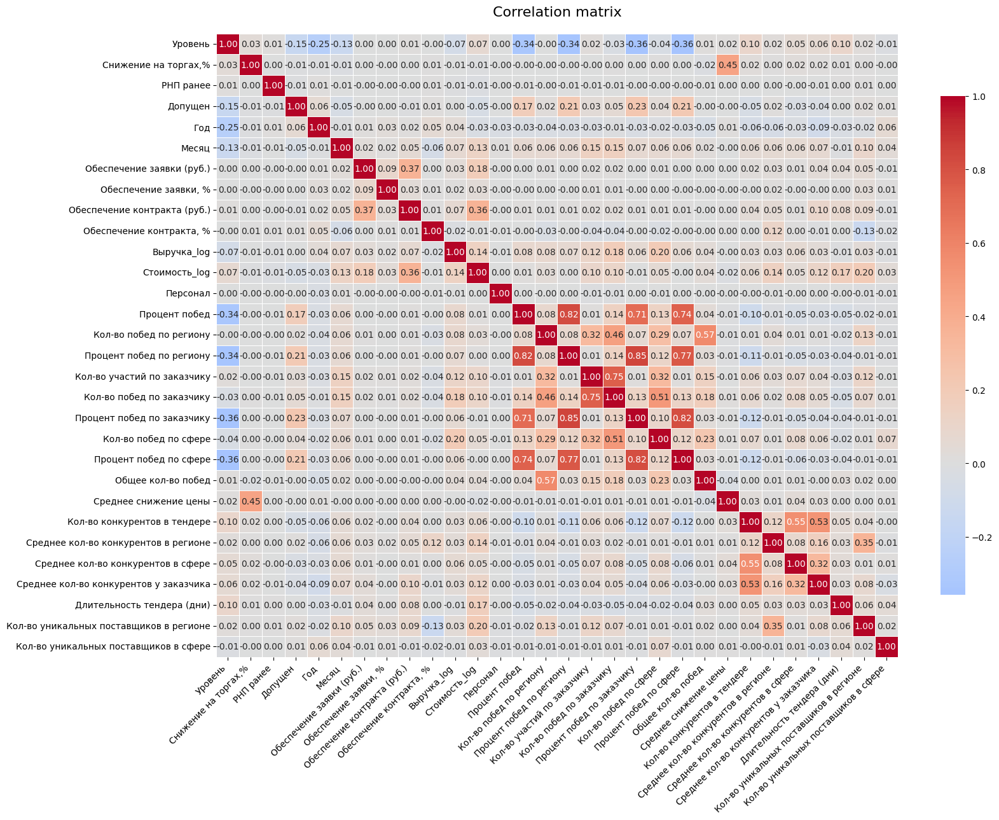

In [28]:
corr_matrix = df[cols].corr()

plt.figure(figsize=(17, 13))
sns.heatmap(
    corr_matrix,
    annot=True,
    fmt=".2f",
    cmap='coolwarm',
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": 0.8}
)
plt.title("Correlation matrix", pad=20, fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

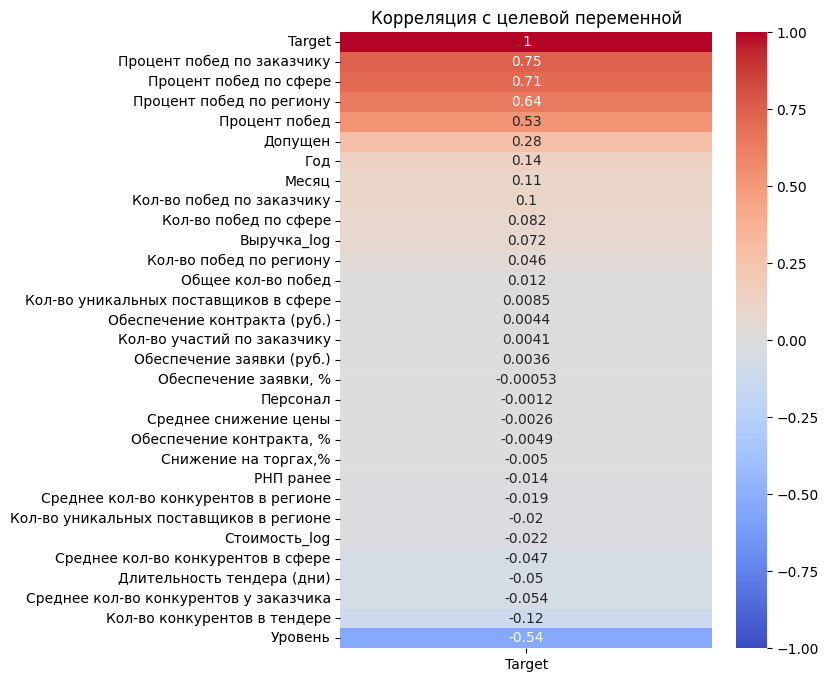

In [29]:
corr_with_target = df[cols + ['Target']].corr()[['Target']].sort_values('Target', ascending=False)

plt.figure(figsize=(6,8))
sns.heatmap(corr_with_target, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Корреляция с целевой переменной')
plt.show()

Можно заметить, что корреляция между процентом побед по сфере/региону/заказчику слабо коррелирует с соответствующим количеством побед. Это говорит о разнородности участвующих компаний и их различных стратегиях (кто-то участвует во многих тендерах, а кто-то только в выигрышных)

Между количеством побед по региону, сфере и заказчику наблюдается высокая корреляция, но они могут понадобиться дальше, поэтому пока оставим. Аналоично для процентов побед


In [14]:
date_columns = [
    'Дата публикации',
    'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ',
    'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ',
    'Дата окончания проведения торгов',
    'Последняя дата публикации'
]

In [15]:
def clean_dates_df(df, date_columns, min_year=2015, max_year = 2025):
    df_clean = df.copy()
    
    problematic_rows = pd.Series(False, index=df_clean.index)
    
    for col in date_columns:
        dates = pd.to_datetime(df_clean[col], errors='coerce')
        invalid_dates = (dates.dt.year < min_year) | (dates.dt.year > max_year) | (dates.isnull())
        
        if invalid_dates.any():
            print(f"\nНайдены некорректные даты в колонке {col}:")
            print(f"Количество: {invalid_dates.sum()}")
            print("\nПримеры некорректных дат:")
            print(df_clean[col][invalid_dates].head())
            
            problematic_rows = problematic_rows | invalid_dates
    
    df_clean = df_clean[~problematic_rows]
    
    print("\nИтоговая статистика:")
    print(f"Удалено строк: {problematic_rows.sum()}")
    print(f"Осталось строк: {len(df_clean)}")
    
    for col in date_columns:
        dates = pd.to_datetime(df_clean[col])
        min_date = dates.min()
        max_date = dates.max()
        print(f"\n{col}:")
        print(f"Минимальная дата: {min_date}")
        print(f"Максимальная дата: {max_date}")
    
    return df_clean

df_cleaned = clean_dates_df(df, date_columns)


Найдены некорректные даты в колонке Дата окончания проведения торгов:
Количество: 7

Примеры некорректных дат:
62395     0219-02-06 00:00:00
107601    0219-02-27 00:00:00
113296    2222-02-28 17:00:03
137749    2002-03-13 00:00:00
137750    2002-03-13 00:00:00
Name: Дата окончания проведения торгов, dtype: object

Итоговая статистика:
Удалено строк: 7
Осталось строк: 492057

Дата публикации:
Минимальная дата: 2015-03-04 15:44:56
Максимальная дата: 2025-02-28 18:32:23

Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ:
Минимальная дата: 2015-03-04 16:00:00
Максимальная дата: 2025-03-24 12:00:00

Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ:
Минимальная дата: 2015-02-20 12:26:16
Максимальная дата: 2025-02-28 20:00:00

Дата окончания проведения торгов:
Минимальная дата: 2015-03-04 15:44:55
Максимальная дата: 2025-12-24 19:00:00

Последняя дата публикации:
Минимальная дата: 2015-03-04 1


Найденные колонки с датами: ['Дата публикации', 'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ', 'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ', 'Дата окончания проведения торгов', 'Последняя дата публикации']

Анализ распределения для Дата публикации
--------------------------------------------------
Минимальная дата: 2015-03-04 15:44:56
Максимальная дата: 2025-02-28 18:32:23
Количество уникальных дат: 210336


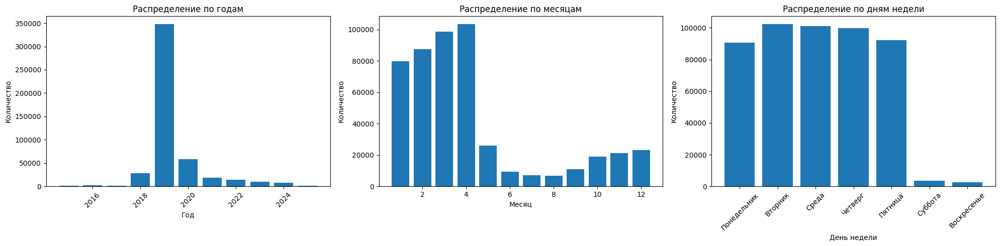


Статистика по компонентам:

Распределение по годам:
Дата публикации
2015      1745
2016      2703
2017      1732
2018     28597
2019    347457
2020     57839
2021     18745
2022     14510
2023      9425
2024      8143
2025      1168
Name: count, dtype: int64

Распределение по месяцам:
Дата публикации
1      79635
2      87426
3      98682
4     103221
5      25891
6       9343
7       6944
8       6886
9      10908
10     18812
11     21171
12     23145
Name: count, dtype: int64

Распределение по дням недели:
Дата публикации
Понедельник     90701
Вторник        102226
Среда          101237
Четверг         99739
Пятница         92237
Суббота          3475
Воскресенье      2449
Name: count, dtype: int64

Анализ распределения для Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ
--------------------------------------------------
Минимальная дата: 2015-03-04 16:00:00
Максимальная дата: 2025-03-24 12:00:00
Количество уникаль

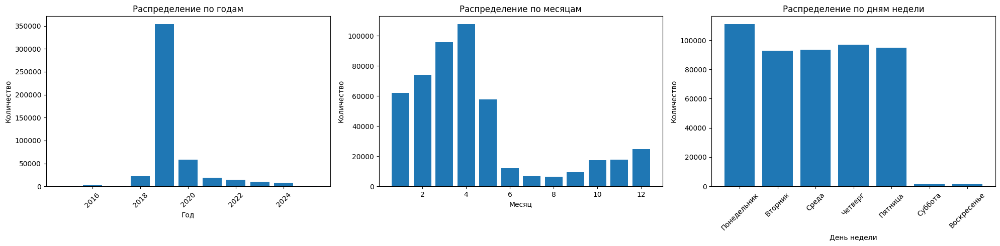


Статистика по компонентам:

Распределение по годам:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ
2015      1729
2016      2675
2017      1750
2018     22523
2019    353501
2020     57894
2021     18331
2022     14756
2023      9534
2024      8145
2025      1226
Name: count, dtype: int64

Распределение по месяцам:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ
1      62196
2      74208
3      95876
4     107592
5      57899
6      12108
7       6681
8       6333
9       9368
10     17246
11     17668
12     24889
Name: count, dtype: int64

Распределение по дням недели:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ
Понедельник    110840
Вторник         92700
Среда           93640
Четверг         96829
Пятница         94812
Суббота          1612
Воскресенье      1631
Name: count, d

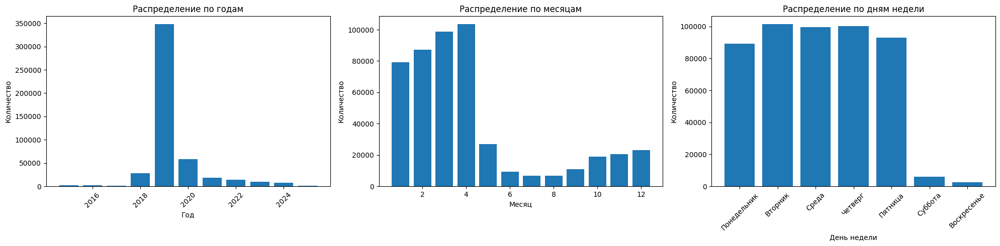


Статистика по компонентам:

Распределение по годам:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ
2015      1808
2016      2653
2017      1732
2018     28434
2019    347551
2020     57894
2021     18750
2022     14513
2023      9419
2024      8146
2025      1164
Name: count, dtype: int64

Распределение по месяцам:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ
1      79038
2      87267
3      98648
4     103387
5      26917
6       9355
7       6796
8       6921
9      10966
10     19110
11     20472
12     23187
Name: count, dtype: int64

Распределение по дням недели:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ
Понедельник     89307
Вторник        101339
Среда           99523
Четверг        100079
Пятница         93102
Суббота          6133
Воскресенье      2581
Name: count, dtype: int64

Анализ распределения для Дата окончания проведения торгов
----------------------------

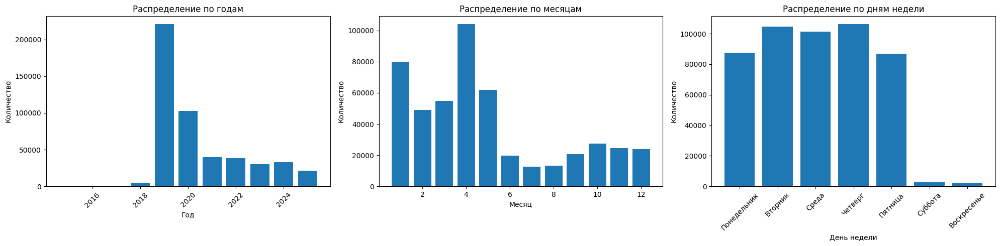


Статистика по компонентам:

Распределение по годам:
Последняя дата публикации
2015       575
2016       935
2017       814
2018      5128
2019    220612
2020    102561
2021     39640
2022     38110
2023     29869
2024     32635
2025     21185
Name: count, dtype: int64

Распределение по месяцам:
Последняя дата публикации
1      79916
2      48942
3      54748
4     103958
5      62048
6      19658
7      12764
8      13165
9      20790
10     27572
11     24616
12     23887
Name: count, dtype: int64

Распределение по дням недели:
Последняя дата публикации
Понедельник     87527
Вторник        104525
Среда          101349
Четверг        106150
Пятница         87010
Суббота          3179
Воскресенье      2324
Name: count, dtype: int64


In [ ]:
def analyze_date_distribution(df, date_column):
    print(f"\nАнализ распределения для {date_column}")
    print("-" * 50)
    
    date_stats = {
        'Минимальная дата': df[date_column].min(),
        'Максимальная дата': df[date_column].max(),
        'Количество уникальных дат': df[date_column].nunique(),
    }
    
    for stat_name, value in date_stats.items():
        print(f"{stat_name}: {value}")
    
    if not pd.api.types.is_datetime64_any_dtype(df[date_column]):
        try:
            dates = pd.to_datetime(df[date_column])
        except:
            print(f"Ошибка преобразования в datetime для колонки {date_column}")
            return
    else:
        dates = df[date_column]
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(20, 5))
    
    year_counts = dates.dt.year.value_counts().sort_index()
    ax1.bar(year_counts.index, year_counts.values)
    ax1.set_title('Распределение по годам')
    ax1.set_xlabel('Год')
    ax1.set_ylabel('Количество')
    ax1.tick_params(axis='x', rotation=45)
    
    month_counts = dates.dt.month.value_counts().sort_index()
    ax2.bar(month_counts.index, month_counts.values)
    ax2.set_title('Распределение по месяцам')
    ax2.set_xlabel('Месяц')
    ax2.set_ylabel('Количество')
    
    days_map = {
        0: 'Понедельник',
        1: 'Вторник',
        2: 'Среда',
        3: 'Четверг',
        4: 'Пятница',
        5: 'Суббота',
        6: 'Воскресенье'
    }
    
    weekday_counts = dates.dt.dayofweek.value_counts().sort_index()
    weekday_counts.index = weekday_counts.index.map(days_map)
    ax3.bar(weekday_counts.index, weekday_counts.values)
    ax3.set_title('Распределение по дням недели')
    ax3.set_xlabel('День недели')
    ax3.set_ylabel('Количество')
    ax3.tick_params(axis='x', rotation=45)
    
    plt.tight_layout()
    plt.show()
    
    print("\nСтатистика по компонентам:")
    print("\nРаспределение по годам:")
    print(year_counts)
    print("\nРаспределение по месяцам:")
    print(month_counts)
    print("\nРаспределение по дням недели:")
    print(weekday_counts)

date_columns = [col for col in df.columns if 'дата' in col.lower() or 'date' in col.lower()]
print("\nНайденные колонки с датами:", date_columns)

for date_column in date_columns:
    analyze_date_distribution(df_cleaned, date_column)

In [16]:
df = df_cleaned

Не видно нигде нормального распределения в датах, поэтому будем использовать непараметрический тест Mann-Whitney для года, для категориальных компонент (месяц, день недели) надо использовать Chi-square тест

In [17]:
df = df.drop(columns=['Выручка'])

In [42]:
cols

['Уровень',
 'Снижение на торгах,%',
 'РНП ранее',
 'Допущен',
 'Год',
 'Месяц',
 'Обеспечение заявки (руб.)',
 'Обеспечение заявки, %',
 'Обеспечение контракта (руб.)',
 'Обеспечение контракта, %',
 'Выручка_log',
 'Стоимость_log',
 'Персонал',
 'Процент побед',
 'Кол-во побед по региону',
 'Процент побед по региону',
 'Кол-во участий по заказчику',
 'Кол-во побед по заказчику',
 'Процент побед по заказчику',
 'Кол-во побед по сфере',
 'Процент побед по сфере',
 'Общее кол-во побед',
 'Среднее снижение цены',
 'Кол-во конкурентов в тендере',
 'Среднее кол-во конкурентов в регионе',
 'Среднее кол-во конкурентов в сфере',
 'Среднее кол-во конкурентов у заказчика',
 'Длительность тендера (дни)',
 'Кол-во уникальных поставщиков в регионе',
 'Кол-во уникальных поставщиков в сфере']

In [18]:
cols = ['Уровень', 'Снижение на торгах,%', 'РНП ранее', 'Допущен',
       'Обеспечение заявки (руб.)', 'Обеспечение заявки, %', 'Обеспечение контракта (руб.)',
       'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log', 'Персонал',
       'Процент побед', 'Кол-во побед по региону',
       'Процент побед по региону', 'Кол-во участий по заказчику',
       'Кол-во побед по заказчику', 'Процент побед по заказчику',
       'Кол-во побед по сфере', 'Процент побед по сфере', 'Общее кол-во побед',
       'Среднее снижение цены', 'Кол-во конкурентов в тендере',
       'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
       'Среднее кол-во конкурентов у заказчика', 'Длительность тендера (дни)',
       'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере']

Теперь даты

In [ ]:
date_columns

In [19]:
df_temporal = pd.DataFrame(index=df.index)

for col in date_columns:
    df_temporal[col] = pd.to_datetime(df[col])
df_temporal['Target'] = df['Target']

df_temporal['Длительность приема заявок'] = (
    df_temporal[date_columns[1]] - df_temporal[date_columns[2]]
).dt.days.abs()

df_temporal['Время до торгов'] = (
    df_temporal[date_columns[3]] - df_temporal[date_columns[0]]
).dt.days.abs()

df_temporal['Время с последней публикации'] = (
    df_temporal[date_columns[0]] - df_temporal[date_columns[4]]
).dt.days.abs()

for col in date_columns:
    df_temporal[f'{col} месяц'] = df_temporal[col].dt.month
    df_temporal[f'{col} день недели'] = df_temporal[col].dt.dayofweek
    df_temporal[f'{col} выходной'] = df_temporal[col].dt.dayofweek.isin([5, 6]).astype(int)
    df_temporal[f'{col} сезон'] = df_temporal[col].dt.month.map({
        12: 'Зима', 1: 'Зима', 2: 'Зима',
        3: 'Весна', 4: 'Весна', 5: 'Весна',
        6: 'Лето', 7: 'Лето', 8: 'Лето',
        9: 'Осень', 10: 'Осень', 11: 'Осень'
    })

print("\nСтатистика по временным интервалам:")
time_intervals = ['Длительность приема заявок', 'Время до торгов', 'Время с последней публикации']
print(df_temporal[time_intervals].describe())


Статистика по временным интервалам:
       Длительность приема заявок  Время до торгов  \
count               492057.000000    492057.000000   
mean                    10.400015        17.664063   
std                      9.697023        16.664753   
min                      0.000000         0.000000   
25%                      7.000000         8.000000   
50%                      9.000000        13.000000   
75%                     13.000000        22.000000   
max                   1483.000000      1080.000000   

       Время с последней публикации  
count                 492057.000000  
mean                     406.261460  
std                      592.695031  
min                        0.000000  
25%                        1.000000  
50%                       86.000000  
75%                      559.000000  
max                     3436.000000  


In [95]:
print("\nКорреляция с целевой переменной:")
for col in time_intervals:
    correlation = df_temporal[col].corr(df_temporal['Target'])
    print(f"{col}: {correlation:.3f}")


Корреляция с целевой переменной:
Длительность приема заявок: -0.085
Время до торгов: -0.089
Время с последней публикации: -0.008


Наибольшая корреляция с целевой переменной у времени до торгов и длительности приема заявок

In [96]:
for col in date_columns:
    season_col = f'{col} сезон'
    success_rate = pd.crosstab(df_temporal[season_col], df_temporal['Target'], normalize='index') * 100
    print(f"\nПроцент успешных тендеров по сезонам для {col}:")
    print(success_rate[1].sort_values(ascending=False))


Процент успешных тендеров по сезонам для Дата публикации:
Дата публикации сезон
Лето     62.149916
Осень    58.762846
Весна    46.983213
Зима     44.669586
Name: 1, dtype: float64

Процент успешных тендеров по сезонам для Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ сезон
Лето     61.292891
Осень    59.380787
Весна    46.339000
Зима     45.562031
Name: 1, dtype: float64

Процент успешных тендеров по сезонам для Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ сезон
Лето     62.322295
Осень    58.928148
Весна    46.936422
Зима     44.681749
Name: 1, dtype: float64

Процент успешных тендеров по сезонам для Дата окончания проведения торгов:
Дата окончания проведения торгов сезон
Осень   

В данных наблюдается сезонность. Лето и осень показывают стабильно высокую успешность, затем весна и в конце зима

In [50]:
for col in date_columns:
    month_success = pd.crosstab(df_temporal[col].dt.month, df_temporal['Target'], normalize='index') * 100
    print(f"\nПроцент успешных тендеров по месяцам для {col}:")
    print(month_success[1].sort_values(ascending=False))


Процент успешных тендеров по месяцам для Дата публикации:
Дата публикации
6     62.956224
10    62.518605
7     62.327189
8     60.877142
9     58.287495
12    56.448477
11    55.670493
5     51.496659
4     46.868309
3     45.919215
2     43.638901
1     42.377628
Name: 1, dtype: float64

Процент успешных тендеров по месяцам для Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ
7     63.613232
10    63.075496
8     62.529607
9     59.852690
6     59.365709
12    56.559123
11    55.524111
5     48.304807
4     46.087926
3     45.433590
1     44.366197
2     42.875817
Name: 1, dtype: float64

Процент успешных тендеров по месяцам для Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ
6     63.

Есть выраженная успешность участия в тендерах которые публикуются в июне и октябре и пониженный процент выигрышей в январе

In [20]:
days = {0: 'Понедельник', 1: 'Вторник', 2: 'Среда', 3: 'Четверг', 
            4: 'Пятница', 5: 'Суббота', 6: 'Воскресенье'}
for col in date_columns:
    df_temporal[f'{col} день недели'] = df_temporal[col].dt.dayofweek.map(days)
    day_success = pd.crosstab(df_temporal[f'{col} день недели'], df_temporal['Target'], normalize='index') * 100
    print(f"\nПроцент успешных тендеров по дням недели для {col}:")
    print(day_success[1].sort_values(ascending=False))


Процент успешных тендеров по дням недели для Дата публикации:
Дата публикации день недели
Суббота        50.474820
Четверг        49.016914
Вторник        48.112460
Пятница        48.078320
Воскресенье    48.019600
Понедельник    47.709457
Среда          47.092466
Name: 1, dtype: float64

Процент успешных тендеров по дням недели для Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ день недели
Суббота        50.868486
Вторник        49.306350
Четверг        47.876153
Среда          47.692686
Понедельник    47.658315
Пятница        47.630549
Воскресенье    47.087676
Name: 1, dtype: float64

Процент успешных тендеров по дням недели для Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ день не

Для временных признаков, которые попадают на субботу, характерен повышенный процент побед. Самый большой разброс по значениям характерен для даты окончания проведения торгов

In [21]:
def get_time_of_day(hour):
    if 5 <= hour < 12:
        return 'Утро'
    elif 12 <= hour < 17:
        return 'День'
    elif 17 <= hour < 22:
        return 'Вечер'
    else:
        return 'Ночь'

for col in date_columns:
    df_temporal[f'{col} время суток'] = df_temporal[col].dt.hour.apply(get_time_of_day)
    time_success = pd.crosstab(df_temporal[f'{col} время суток'], df_temporal['Target'], normalize='index') * 100
    print(f"\nПроцент успешных тендеров по времени суток для {col}:")
    print(time_success[1].sort_values(ascending=False))


Процент успешных тендеров по времени суток для Дата публикации:
Дата публикации время суток
Ночь     53.466933
Утро     49.096376
День     47.210646
Вечер    46.638166
Name: 1, dtype: float64

Процент успешных тендеров по времени суток для Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ:
Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ время суток
День     54.149257
Вечер    47.216426
Ночь     47.182426
Утро     45.588700
Name: 1, dtype: float64

Процент успешных тендеров по времени суток для Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ:
Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ время суток
Ночь     48.900647
Вечер    47.789286
Утро     38.156506
День     37.343180
Name: 1, dtype: float64

Процент успешных тендеров по времени суток для Дата окончания проведения торгов:
Дата 

Для публикации ночь наиболее успешна, для окончания приема - день, для начала подачи заявок - ночь успешна

In [98]:
date_columns

['Дата публикации',
 'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ',
 'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ',
 'Дата окончания проведения торгов',
 'Последняя дата публикации']

In [22]:
for col in date_columns:
    if col == 'Дата окончания проведения торгов':
        df_temporal['Дата окончания проведения торгов октябрь'] = (df_temporal[col].dt.month == 10).astype(int)
        
    if col == 'Дата публикации':
        df_temporal['Публикация январь'] = (df_temporal[col].dt.month == 1).astype(int)

    if col == 'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ':
        df_temporal['Дата начала подачи заявок лето'] = (
        df_temporal['Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ сезон'] == 'лето'
        ).astype(int)

    if col == 'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ':
        df_temporal['Окончание приема суббота'] = (df_temporal[col].dt.dayofweek == 5).astype(int)

important_features = [
    'Длительность приема заявок',
    'Время до торгов',
    'Дата начала подачи заявок лето',
    'Дата окончания проведения торгов октябрь',
    'Публикация январь',
    'Окончание приема суббота'
]

for feature in important_features:
    df[feature] = df_temporal[feature]

In [62]:
date_columns

['Дата публикации',
 'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ',
 'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ',
 'Дата окончания проведения торгов',
 'Последняя дата публикации']

In [24]:
cols = ['Снижение на торгах,%', 'Обеспечение заявки (руб.)', 'Обеспечение заявки, %', 'Обеспечение контракта (руб.)',
       'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log', 'Персонал',
       'Процент побед', 'Кол-во побед по региону', 'Длительность приема заявок', 'Время до торгов',
       'Процент побед по региону', 'Кол-во участий по заказчику',
       'Кол-во побед по заказчику', 'Процент побед по заказчику',
       'Кол-во побед по сфере', 'Процент побед по сфере', 'Общее кол-во побед',
       'Среднее снижение цены', 'Кол-во конкурентов в тендере',
       'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
       'Среднее кол-во конкурентов у заказчика', 'Длительность тендера (дни)',
       'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере']

In [102]:
def check_significance(df, target_col='Target', alpha=0.05):
    results = []
    
    for feature in df.columns:
        if feature == target_col:
            continue
            
        group0 = df[df[target_col] == 0][feature].dropna()
        group1 = df[df[target_col] == 1][feature].dropna()
            
        if feature in cols:
            stat, p = ttest_ind(group0, group1, equal_var=False)
            test_name = 't-test'
                
            results.append({
                'Признак': feature,
                'Тип': 'Numerical',
                'Тест': test_name,
                'statistic': round(stat, 4),
                'p-value': round(p, 5),
                'Значимый': p < alpha
            })
            
        elif feature not in date_columns: # категориальные
            contingency_table = pd.crosstab(df[feature], df[target_col])
            stat, p, _, _ = chi2_contingency(contingency_table)
            test_name = 'Chi-square'
            
            results.append({
                'Признак': feature,
                'Тип': 'Categorical',
                'Тест': test_name,
                'statistic': round(stat, 4),
                'p-value': round(p, 5),
                'Значимый': p < alpha
            })
    
    results_df = pd.DataFrame(results)
    
    print(f"Всего признаков: {len(results_df)}")
    print(f"Значимых признаков: {len(results_df[results_df['Значимый']])} "
          f"({len(results_df[results_df['Значимый']])/len(results_df):.1%})")
    
    return results_df.sort_values(by='p-value')


significance_results = check_significance(df)

significant_features = significance_results[significance_results['Значимый']]
print("\nЗначимые признаки (p < 0.05):")
display(significant_features)

non_significant_features = significance_results[~significance_results['Значимый']]
print("\nНезначимые признаки (p >= 0.05):")
display(non_significant_features)

Всего признаков: 50
Значимых признаков: 43 (86.0%)

Значимые признаки (p < 0.05):


,Признак,Тип,Тест,statistic,p-value,Значимый
0,Уровень,Categorical,Chi-square,141203.5371,0.00000,True
1,Заказчик,Categorical,Chi-square,79229.0663,0.00000,True
2,ИНН заказчика,Categorical,Chi-square,80210.1929,0.00000,True
5,Сфера деятельности,Categorical,Chi-square,45835.8918,0.00000,True
7,Город поставки,Categorical,Chi-square,14843.6317,0.00000,True
6,Регион поставки,Categorical,Chi-square,5195.5855,0.00000,True
9,ИНН поставщика,Categorical,Chi-square,203953.7249,0.00000,True
8,Поставщик,Categorical,Chi-square,177582.2565,0.00000,True
12,Тип торгов,Categorical,Chi-square,141223.4954,0.00000,True
25,Процент побед,Numerical,t-test,-430.9175,0.00000,True



Незначимые признаки (p >= 0.05):


,Признак,Тип,Тест,statistic,p-value,Значимый
34,Среднее снижение цены,Numerical,t-test,1.8703,0.06144,False
18,Персонал,Numerical,t-test,0.8470,0.39700,False
14,"Обеспечение заявки, %",Numerical,t-test,0.3767,0.70640,False
11,Форма публикации,Categorical,Chi-square,0.0000,1.00000,False
3,Стоимость(руб.) Заказчик,Categorical,Chi-square,158711.4028,1.00000,False
4,Реестровый номер публикации,Categorical,Chi-square,199425.2324,1.00000,False
46,Дата начала подачи заявок лето,Categorical,Chi-square,0.0000,1.00000,False


In [25]:
df = df.drop(columns = ['Среднее снижение цены', 'Персонал', 'Обеспечение заявки, %', 'Стоимость(руб.) Заказчик', 'Форма публикации', 'Реестровый номер публикации', 'Дата начала подачи заявок лето'])

In [26]:
len(df.columns.tolist())

49

In [27]:
numerical_features = ['Снижение на торгах,%', 'Обеспечение заявки (руб.)', 'Обеспечение контракта (руб.)',
       'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log',
       'Процент побед', 'Кол-во побед по региону', 'Процент побед по региону', 
       'Кол-во побед по заказчику', 'Кол-во участий по заказчику', 'Процент побед по заказчику',
       'Кол-во побед по сфере', 'Процент побед по сфере', 'Общее кол-во побед',
       'Кол-во конкурентов в тендере', 'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере', 
       'Среднее кол-во конкурентов у заказчика', 'Длительность тендера (дни)', 
       'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере', 
       'Длительность приема заявок', 'Время до торгов'
]

categorical_features = [
    'Уровень', 'Регион поставки', 'Сфера деятельности', 'Допущен',
    'Тип торгов', 'РНП ранее', 'Заказчик', 'Город поставки', 'Поставщик',
    'Субъект поставщика', 'Город поставщика', 'Публикация январь', 
    'Окончание приема суббота', 'Дата окончания проведения торгов октябрь',
    'Год', 'Месяц', 'Сводный риск'
]

time_features = [
       'Дата публикации',
       'Дата окончания приема заявок / Дата планового окончания исполнения контракта / Плановая дата публикации лота по ППГ',
       'Дата начала подачи заявок / Дата начала исполнения контракта / Дата публикации ППГ',
       'Дата окончания проведения торгов', 'Последняя дата публикации'
]


train_data = df[df['Год'].isin(range(2015, 2020))].copy()
val_data = df[df['Год'].isin(range(2020, 2021))].copy()
test_data = df[df['Год'].isin(range(2021, 2026))].copy()

feature_columns = numerical_features + categorical_features + time_features

X_train = train_data[feature_columns]
y_train = train_data['Target']
X_val = val_data[feature_columns]
y_val = val_data['Target']
X_test = test_data[feature_columns]
y_test = test_data['Target']

Определим необходимые признаки для бустинга и деревьев

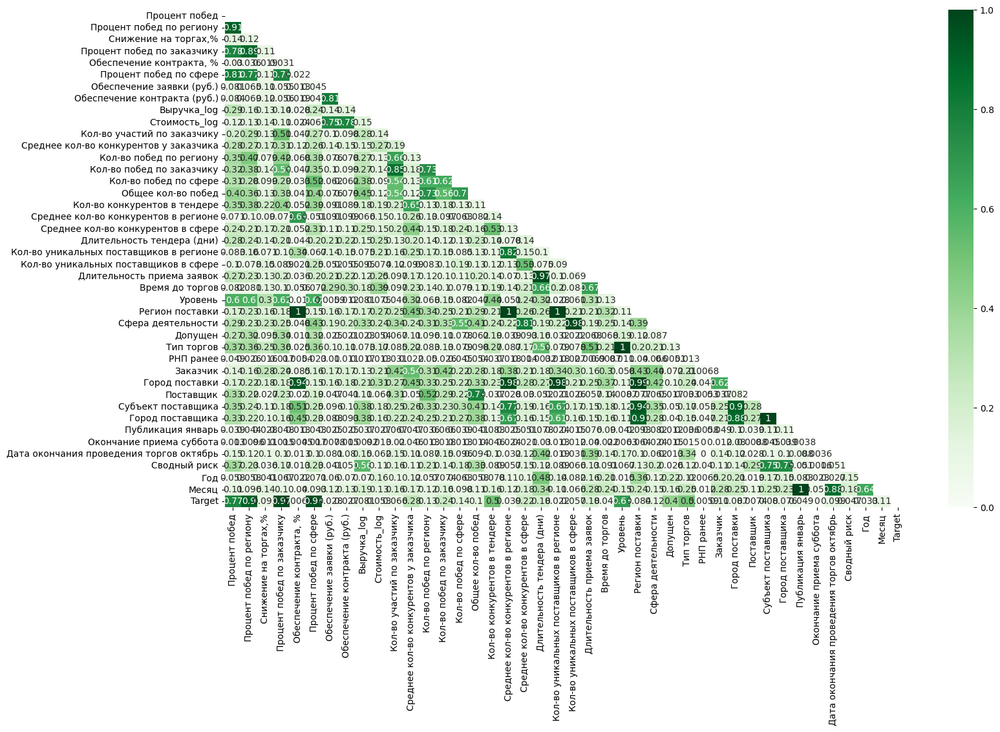

In [ ]:
df_processed = pd.concat([X_train, y_train], axis=1)

plt.figure(figsize=(17, 10))

interval_cols = percent_features + numerical_features

interval_cols = [col for col in interval_cols if col in df_processed.columns]

if 'Target' in df_processed.columns:
    interval_cols += ['Target']

corr_matrix = df_processed.phik_matrix(interval_cols=interval_cols)

sns.heatmap(corr_matrix,
            annot=True,
            cmap='Greens',
            mask=np.triu(np.ones_like(corr_matrix, dtype=bool)))

plt.show()

In [ ]:
corr_table = corr_matrix.unstack().reset_index()
corr_table.columns = ["Признак 1", "Признак 2", "Корреляция"]

significant_corr = corr_table[
    (corr_table["Корреляция"].abs() >= 0.2) & (corr_table["Корреляция"].abs() < 0.9) &
    (corr_table["Признак 1"] != corr_table["Признак 2"]) &  (corr_table["Признак 1"] == "Target")
].sort_values(by="Корреляция", ascending=False)

print(significant_corr)

     Признак 1                               Признак 2  Корреляция
1722    Target                           Процент побед    0.769808
1746    Target                                 Уровень    0.682704
1738    Target            Кол-во конкурентов в тендере    0.504970
1750    Target                              Тип торгов    0.497376
1749    Target                                 Допущен    0.403586
1733    Target  Среднее кол-во конкурентов у заказчика    0.284674
1735    Target               Кол-во побед по заказчику    0.238659
1740    Target      Среднее кол-во конкурентов в сфере    0.217282


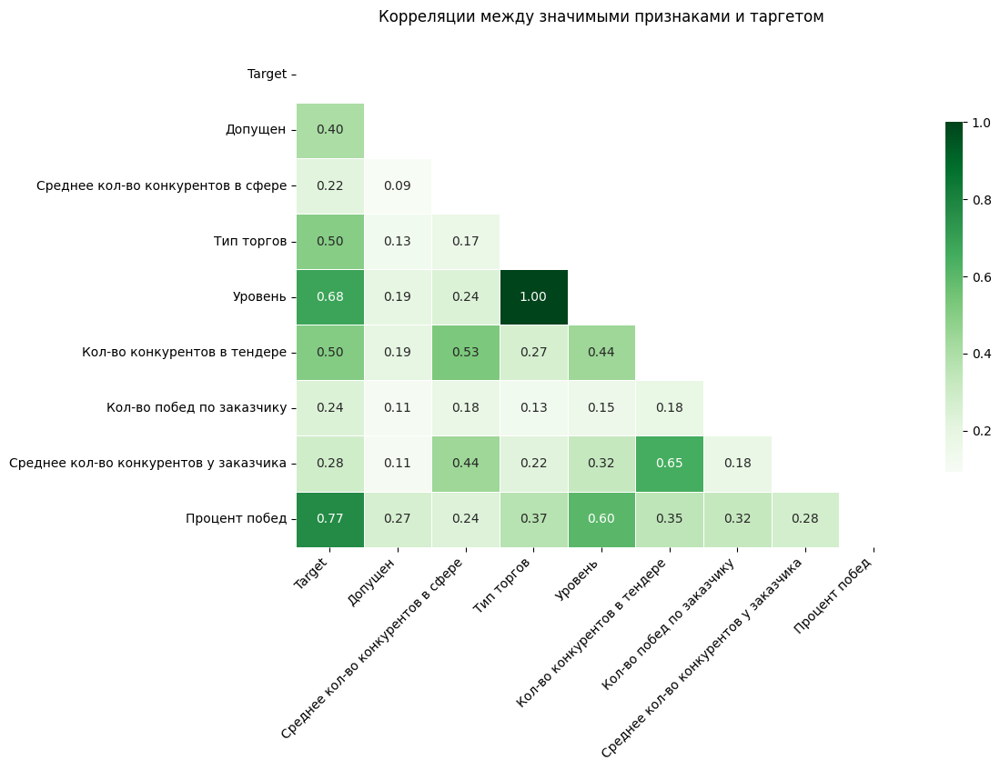

In [ ]:
selected_features = list(
    set(significant_corr["Признак 1"]) |
    set(significant_corr["Признак 2"])
)

filtered_corr_matrix = corr_matrix.loc[selected_features, selected_features]

mask = np.triu(np.ones_like(filtered_corr_matrix, dtype=bool))
filtered_corr_matrix = filtered_corr_matrix.mask(mask)

plt.figure(figsize=(12, 10))
sns.heatmap(
    filtered_corr_matrix,
    annot=True,
    cmap="Greens",
    fmt=".2f",
    linewidths=0.5,
    annot_kws={"size": 10},
    cbar_kws={"shrink": 0.7}
)

plt.xticks(
    rotation=45,
    ha="right",
    fontsize=10
)
plt.yticks(
    rotation=0,
    fontsize=10
)

plt.subplots_adjust(
    left=0.25,
    right=0.95,
    bottom=0.4,
    top=0.95
)

plt.title("Корреляции между значимыми признаками и таргетом", pad=20)
plt.show()

Сначала огарничили допустиму корреляцию между признаком и таргетом от 0.2 до 0.9, затем еще убрали тип торгов, так как у него единичная корреляция с уровнем, а у уровня больше корреляция с таргетом, чем у типа торгов

In [ ]:
# Столбцы для удаления
cols_to_drop = ['Длительность тендера (дни)', 'Длительность приема заявок', 'Город поставщика', 'Субъект поставщика',
                'Кол-во побед по заказчику', 'Среднее кол-во конкурентов в сфере', 'Кол-во побед по региону',
                'Кол-во побед по сфере', 'Сфера деятельности', 'Заказчик', 'Город поставки', 'Город поставки',
                'Публикация январь', 'Сводный риск', 'Год', 'Месяц', 'Снижение на торгах,%', "Обеспечение контракта, %",
                "Обеспечение заявки (руб.)", "Обеспечение контракта (руб.)", 'Выручка_log', 'Стоимость_log',
                'Кол-во участий по заказчику', 'Общее кол-во побед', 'Среднее кол-во конкурентов в регионе',
                'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере', 'Время до торгов',
                'Регион поставки', 'РНП ранее', 'Поставщик', 'Окончание приема суббота',
                'Дата окончания проведения торгов октябрь', 'Процент побед по заказчику', 'Процент побед по сфере',
                'Тип торгов']

# Список новых столбцов после удаления
numerical_features = [
    'Кол-во конкурентов в тендере',
    'Среднее кол-во конкурентов у заказчика',
    'Процент побед',
    'Процент побед по региону',
    'Допущен'
]

ordinal_features = ['Уровень']

Посмотрим, что стновится с распределением при использовании различных scalers. Так как скейлеры по-разному работают с выбросами и распределениями, будем сначала смотреть на распределения по всем данным, затем обработаем выбросы на тренировочных данных и после этого перейдем к обучению моделей на чистых данных


Анализ группы: Процентные признаки

Статистики для Процент побед:
Среднее: 0.48
Медиана: 0.49
Стд. отклонение: 0.31

Статистики после MinMaxScaler:
Среднее: 0.48
Медиана: 0.49
Стд. отклонение: 0.31
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: -0.02
Медиана: 0.00
Стд. отклонение: 0.74
Min: -1.17
Max: 1.23

Статистики после StandardScaler:
Среднее: -0.00
Медиана: 0.03
Стд. отклонение: 1.00
Min: -1.54
Max: 1.69


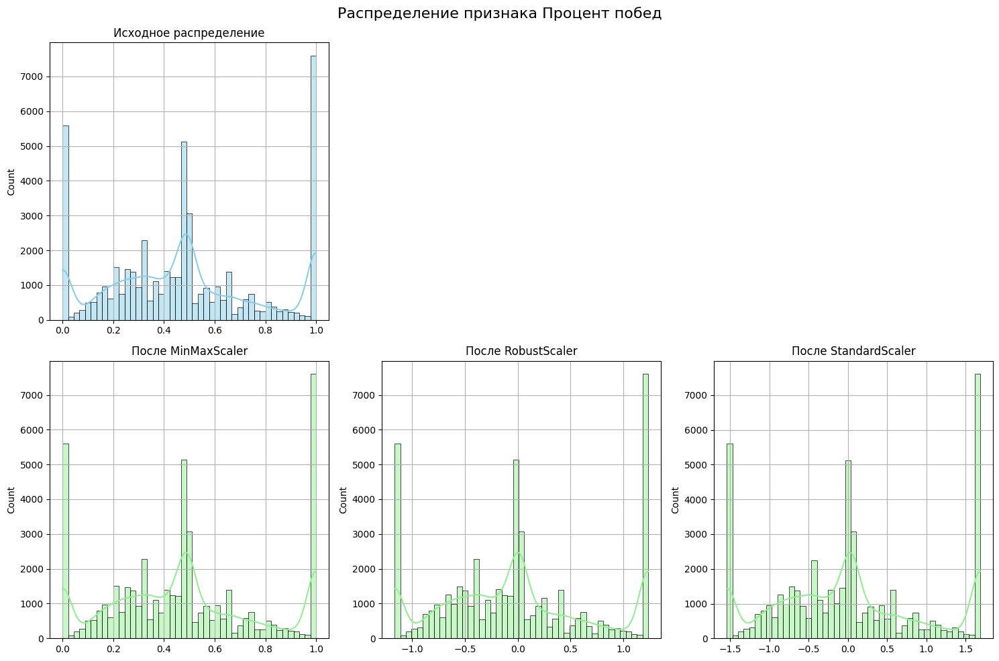


Статистики для Процент побед по региону:
Среднее: 0.48
Медиана: 0.48
Стд. отклонение: 0.36

Статистики после MinMaxScaler:
Среднее: 0.48
Медиана: 0.48
Стд. отклонение: 0.36
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: -0.00
Медиана: 0.00
Стд. отклонение: 0.54
Min: -0.70
Max: 0.77

Статистики после StandardScaler:
Среднее: 0.00
Медиана: 0.00
Стд. отклонение: 1.00
Min: -1.31
Max: 1.44


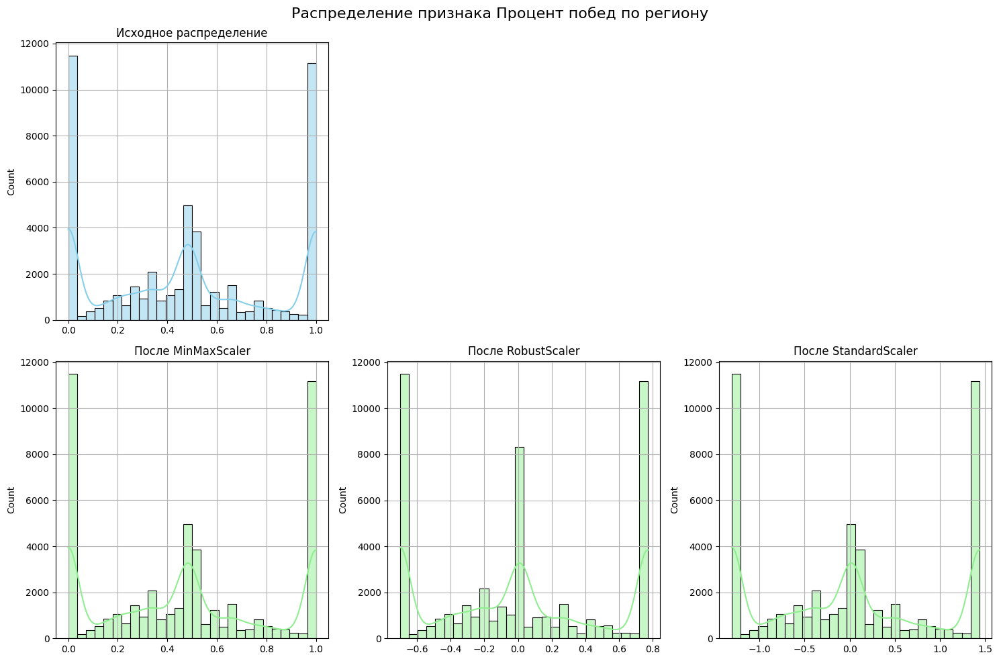


Статистики для Снижение на торгах,%:
Среднее: 0.12
Медиана: 0.08
Стд. отклонение: 1.48

Статистики после MinMaxScaler:
Среднее: 0.99
Медиана: 0.99
Стд. отклонение: 0.01
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.19
Медиана: 0.00
Стд. отклонение: 6.66
Min: -444.64
Max: 4.13

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.03
Стд. отклонение: 1.00
Min: -66.81
Max: 0.59


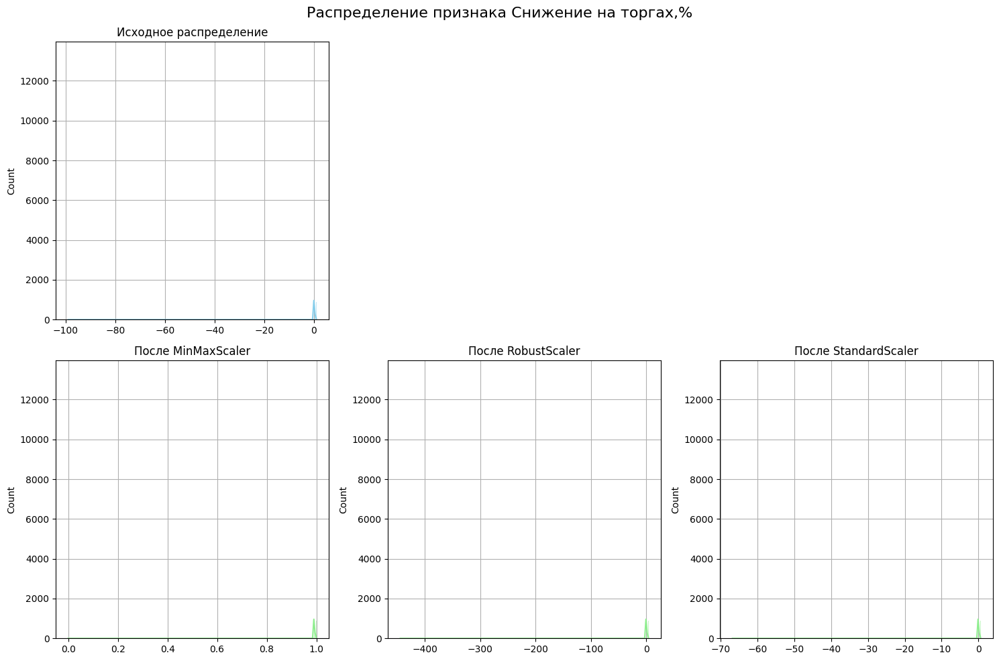


Статистики для Процент побед по заказчику:
Среднее: 0.47
Медиана: 0.46
Стд. отклонение: 0.42

Статистики после MinMaxScaler:
Среднее: 0.47
Медиана: 0.46
Стд. отклонение: 0.42
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.01
Медиана: 0.00
Стд. отклонение: 0.42
Min: -0.46
Max: 0.54

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.03
Стд. отклонение: 1.00
Min: -1.14
Max: 1.26


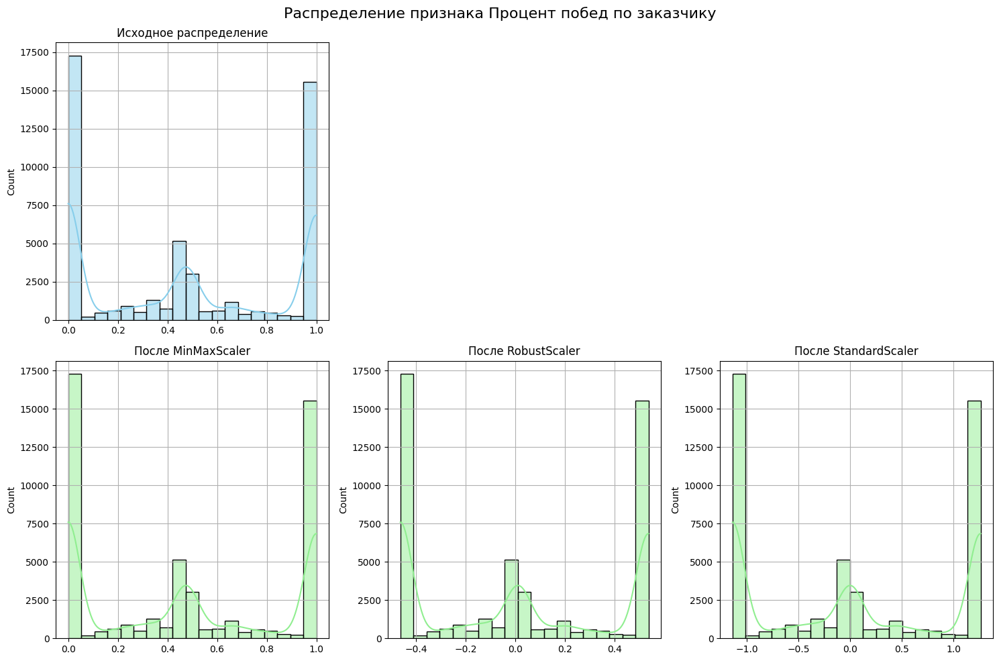


Статистики для Процент побед по сфере:
Среднее: 0.48
Медиана: 0.47
Стд. отклонение: 0.40

Статистики после MinMaxScaler:
Среднее: 0.48
Медиана: 0.47
Стд. отклонение: 0.40
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.00
Медиана: 0.00
Стд. отклонение: 0.40
Min: -0.47
Max: 0.53

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.01
Стд. отклонение: 1.00
Min: -1.20
Max: 1.31


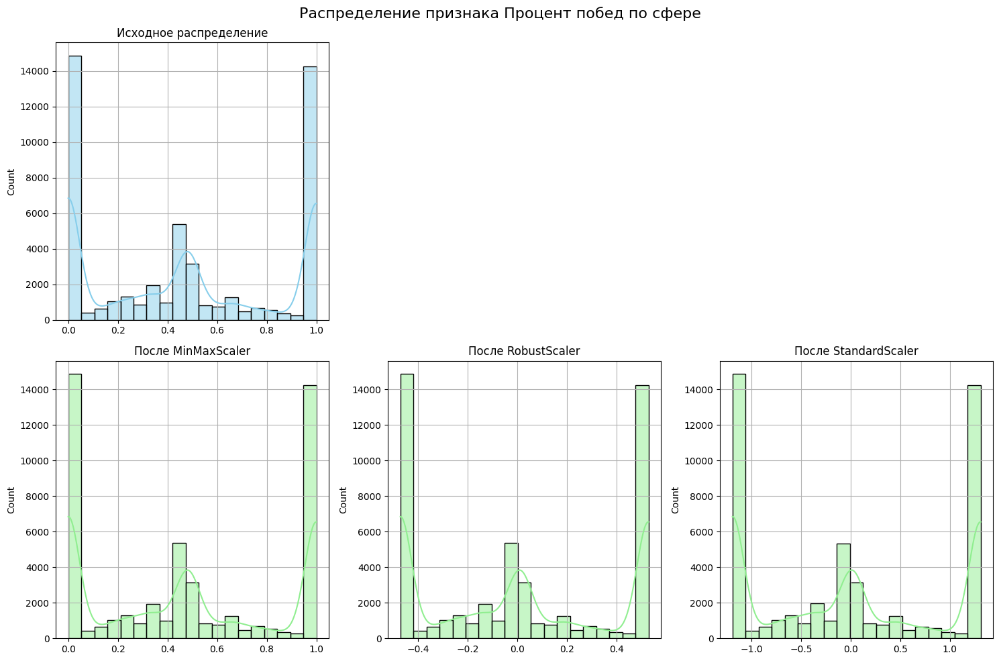


Анализ группы: Количественные признаки

Статистики для Кол-во побед по региону:
Среднее: 11.47
Медиана: 2.00
Стд. отклонение: 43.71

Статистики после MinMaxScaler:
Среднее: 0.02
Медиана: 0.00
Стд. отклонение: 0.08
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 2.37
Медиана: 0.00
Стд. отклонение: 10.93
Min: -0.50
Max: 138.50

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.22
Стд. отклонение: 1.00
Min: -0.26
Max: 12.46


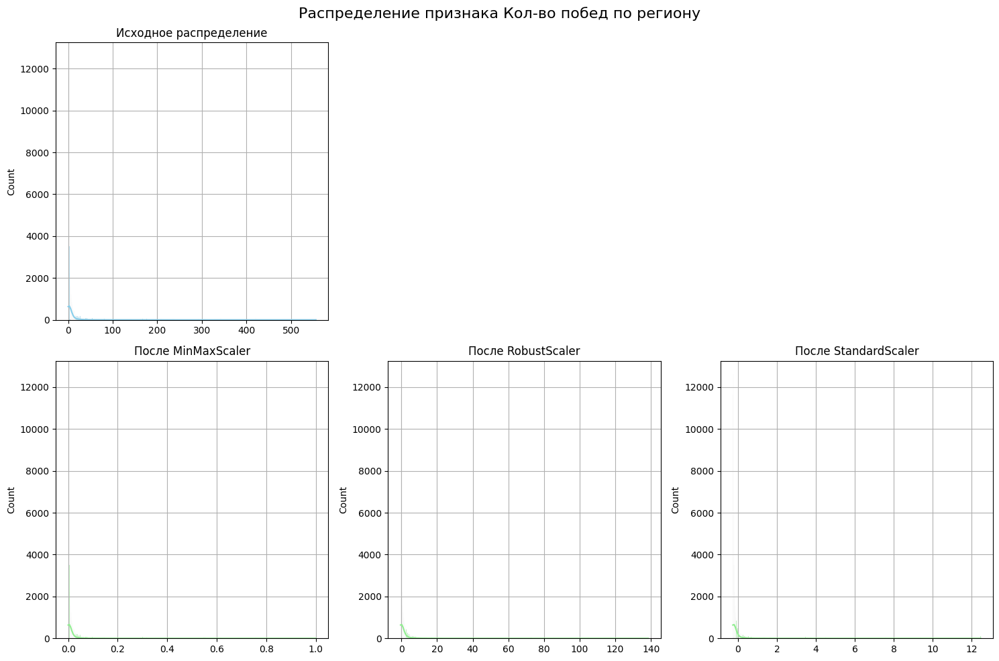


Статистики для Кол-во побед по заказчику:
Среднее: 7.93
Медиана: 1.00
Стд. отклонение: 38.34

Статистики после MinMaxScaler:
Среднее: 0.01
Медиана: 0.00
Стд. отклонение: 0.07
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 3.47
Медиана: 0.00
Стд. отклонение: 19.17
Min: -0.50
Max: 280.50

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.18
Стд. отклонение: 1.00
Min: -0.21
Max: 14.45


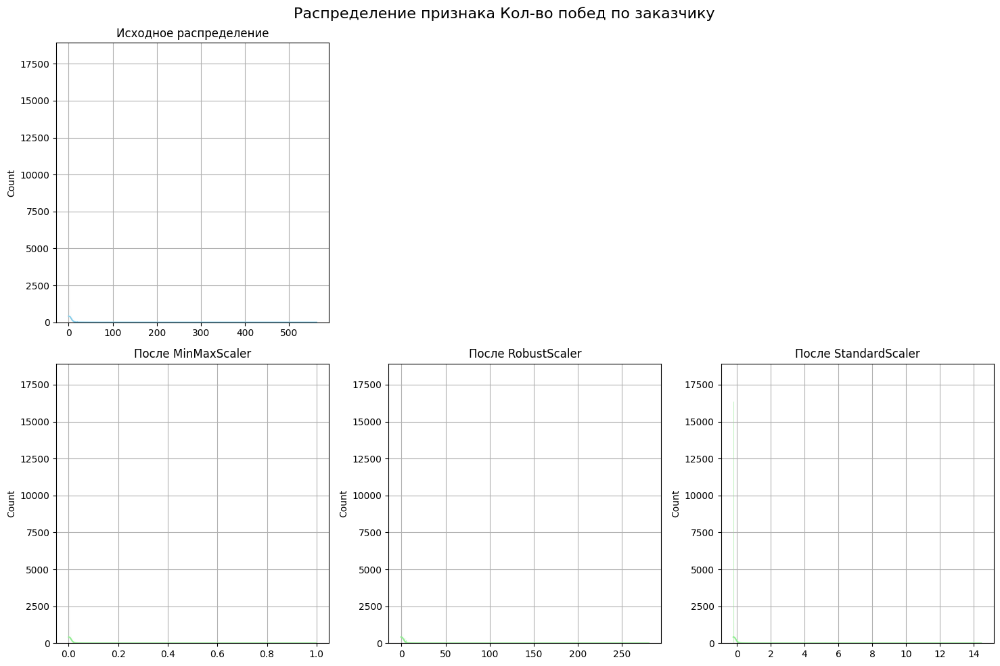


Статистики для Кол-во побед по сфере:
Среднее: 8.88
Медиана: 1.00
Стд. отклонение: 38.39

Статистики после MinMaxScaler:
Среднее: 0.02
Медиана: 0.00
Стд. отклонение: 0.07
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 2.63
Медиана: 0.00
Стд. отклонение: 12.80
Min: -0.33
Max: 187.00

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.21
Стд. отклонение: 1.00
Min: -0.23
Max: 14.41


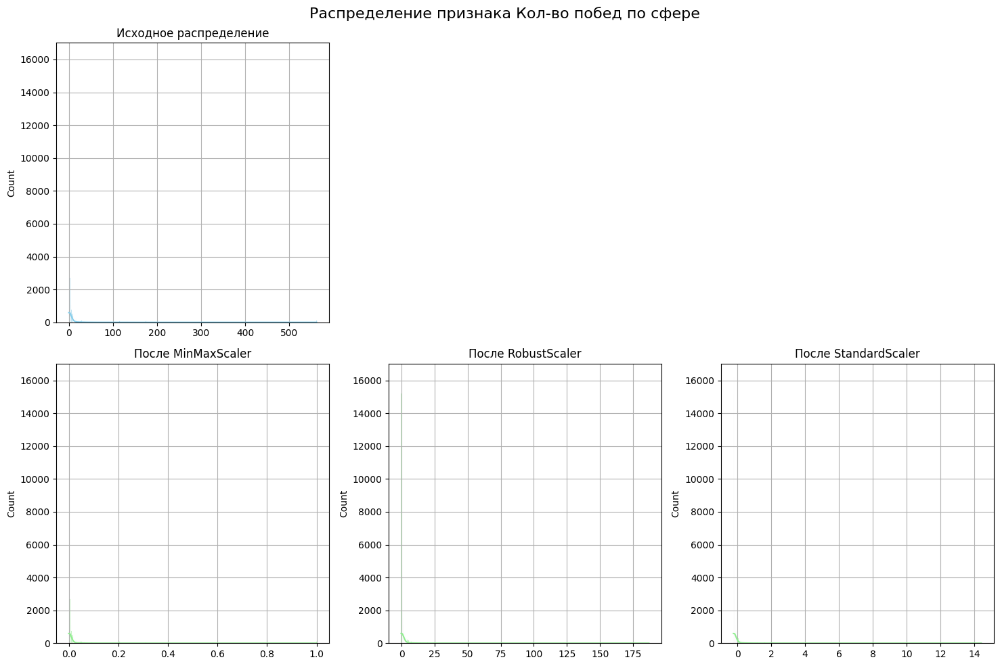


Статистики для Общее кол-во побед:
Среднее: 42.04
Медиана: 4.00
Стд. отклонение: 202.34

Статистики после MinMaxScaler:
Среднее: 0.02
Медиана: 0.00
Стд. отклонение: 0.10
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 3.17
Медиана: 0.00
Стд. отклонение: 16.86
Min: -0.33
Max: 164.08

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.19
Стд. отклонение: 1.00
Min: -0.21
Max: 9.54


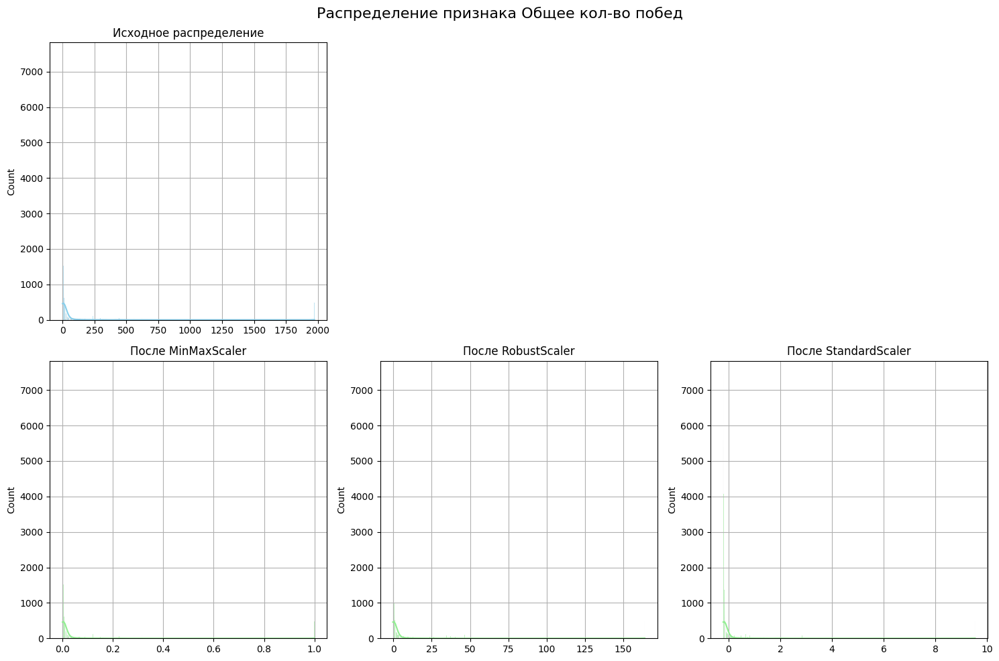


Статистики для Кол-во конкурентов в тендере:
Среднее: 5.31
Медиана: 2.00
Стд. отклонение: 15.57

Статистики после MinMaxScaler:
Среднее: 0.02
Медиана: 0.01
Стд. отклонение: 0.05
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 1.10
Медиана: 0.00
Стд. отклонение: 5.19
Min: -0.67
Max: 97.00

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.21
Стд. отклонение: 1.00
Min: -0.34
Max: 18.47


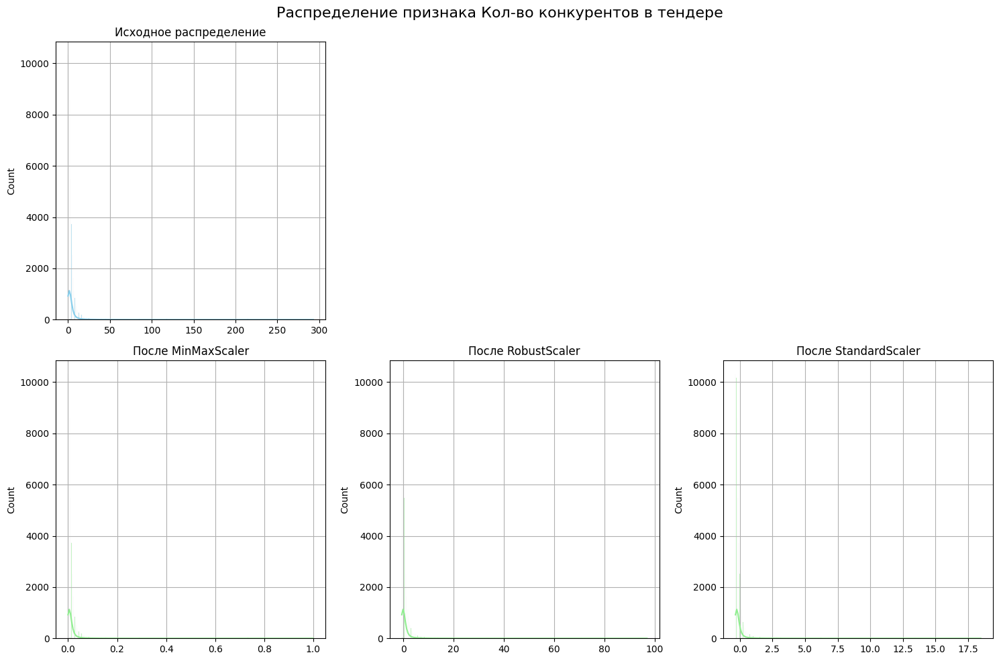


Статистики для Среднее кол-во конкурентов в регионе:
Среднее: 5.61
Медиана: 5.73
Стд. отклонение: 2.28

Статистики после MinMaxScaler:
Среднее: 0.30
Медиана: 0.31
Стд. отклонение: 0.17
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: -0.04
Медиана: 0.00
Стд. отклонение: 0.80
Min: -1.45
Max: 3.22

Статистики после StandardScaler:
Среднее: 0.00
Медиана: 0.05
Стд. отклонение: 1.00
Min: -1.76
Max: 4.07


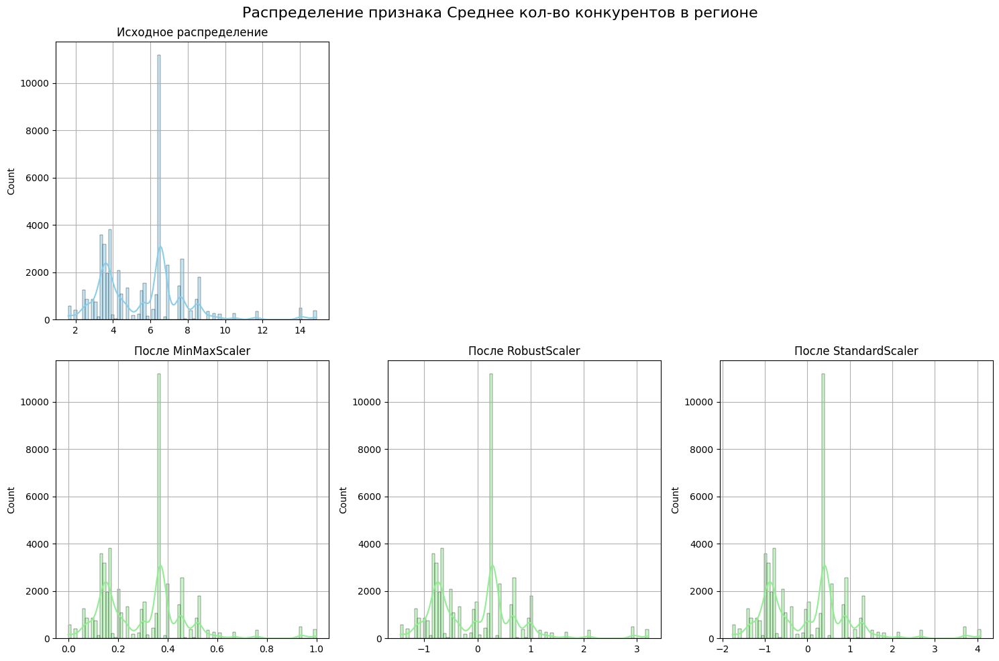


Статистики для Среднее кол-во конкурентов в сфере:
Среднее: 5.34
Медиана: 2.92
Стд. отклонение: 11.08

Статистики после MinMaxScaler:
Среднее: 0.02
Медиана: 0.01
Стд. отклонение: 0.04
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 1.19
Медиана: 0.00
Стд. отклонение: 5.43
Min: -1.43
Max: 142.28

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.22
Стд. отклонение: 1.00
Min: -0.48
Max: 25.97


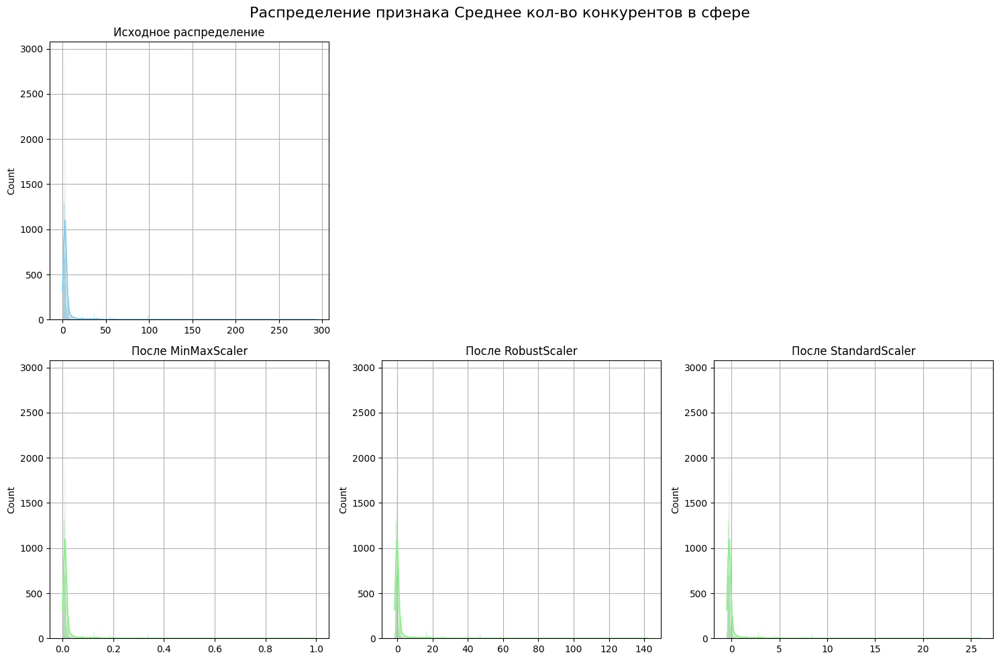


Статистики для Кол-во уникальных поставщиков в регионе:
Среднее: 7 259.34
Медиана: 3 770.00
Стд. отклонение: 8 027.82

Статистики после MinMaxScaler:
Среднее: 0.30
Медиана: 0.15
Стд. отклонение: 0.33
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.49
Медиана: 0.00
Стд. отклонение: 1.13
Min: -0.52
Max: 2.88

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.43
Стд. отклонение: 1.00
Min: -0.90
Max: 2.11


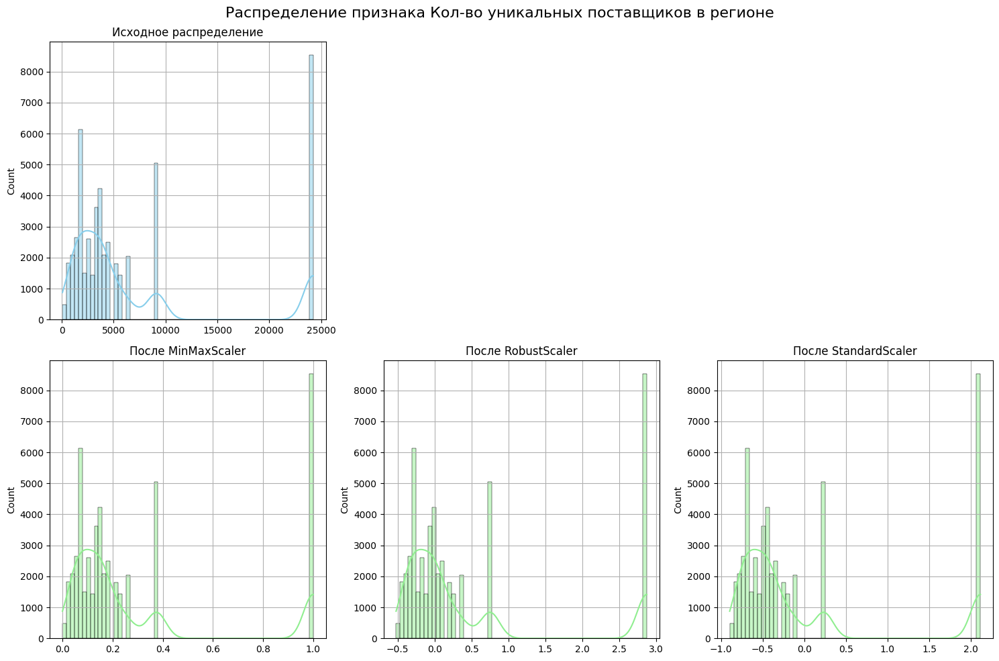


Статистики для Кол-во уникальных поставщиков в сфере:
Среднее: 769.90
Медиана: 444.00
Стд. отклонение: 907.36

Статистики после MinMaxScaler:
Среднее: 0.19
Медиана: 0.11
Стд. отклонение: 0.22
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.34
Медиана: 0.00
Стд. отклонение: 0.94
Min: -0.46
Max: 3.73

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.36
Стд. отклонение: 1.00
Min: -0.85
Max: 3.62


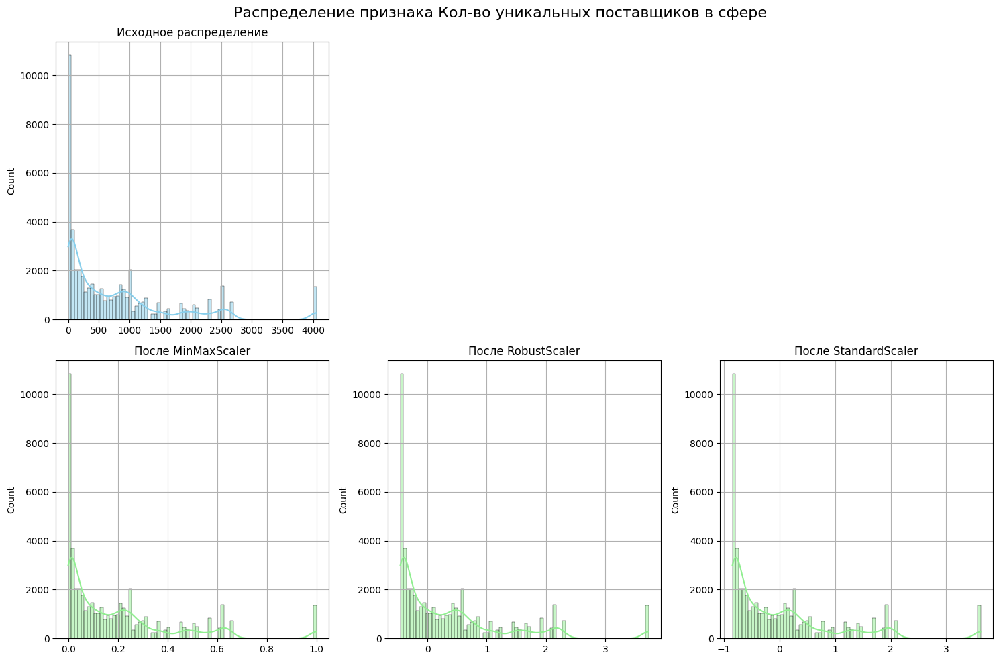


Статистики для Обеспечение заявки (руб.):
Среднее: 133 983.78
Медиана: 9 269.25
Стд. отклонение: 2 035 791.07

Статистики после MinMaxScaler:
Среднее: 0.00
Медиана: 0.00
Стд. отклонение: 0.01
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 5.40
Медиана: 0.00
Стд. отклонение: 88.20
Min: -0.40
Max: 16 949.63

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.06
Стд. отклонение: 1.00
Min: -0.07
Max: 192.11


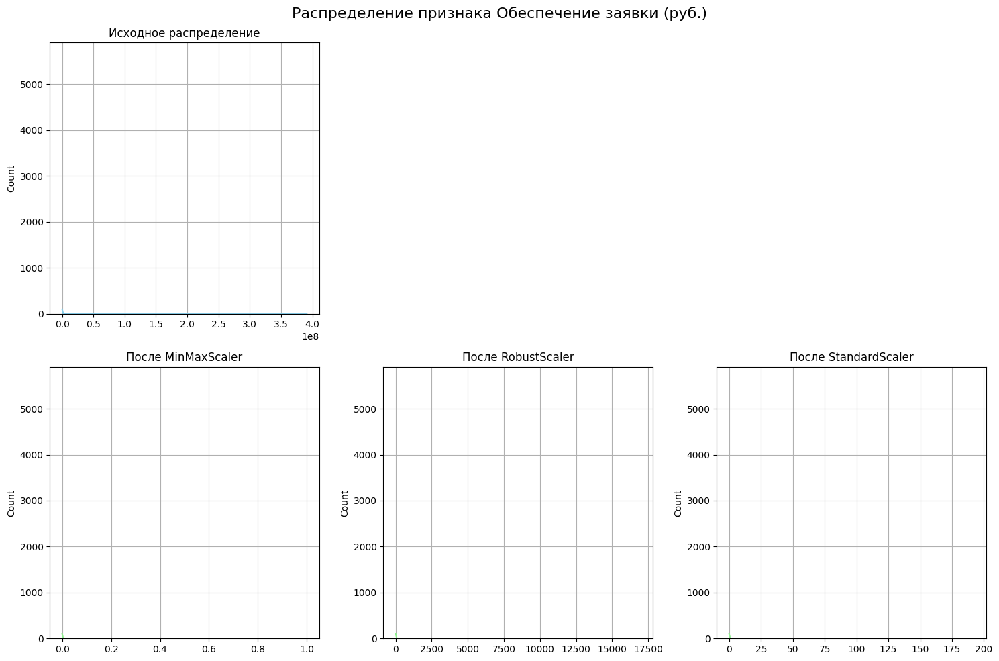


Статистики для Обеспечение контракта, %:
Среднее: 0.06
Медиана: 0.05
Стд. отклонение: 0.02

Статистики после MinMaxScaler:
Среднее: 0.06
Медиана: 0.05
Стд. отклонение: 0.02
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.01
Медиана: 0.00
Стд. отклонение: 0.02
Min: -0.05
Max: 0.95

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.37
Стд. отклонение: 1.00
Min: -2.39
Max: 38.00


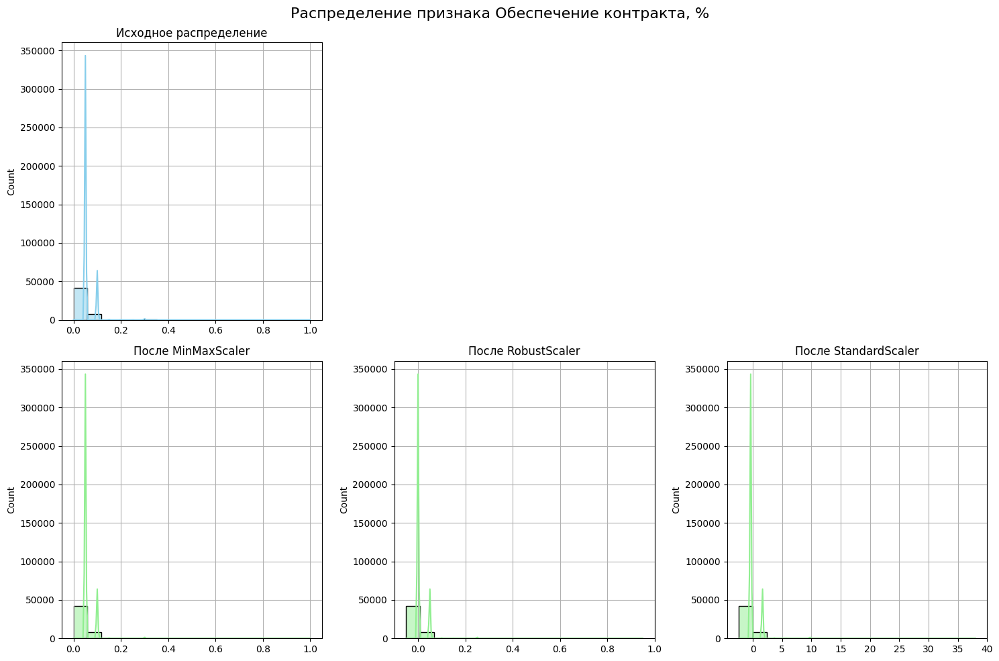


Статистики для Выручка_log:
Среднее: 18.92
Медиана: 18.86
Стд. отклонение: 1.92

Статистики после MinMaxScaler:
Среднее: 0.55
Медиана: 0.55
Стд. отклонение: 0.09
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.05
Медиана: 0.00
Стд. отклонение: 1.80
Min: -11.19
Max: 9.14

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.03
Стд. отклонение: 1.00
Min: -6.26
Max: 5.06


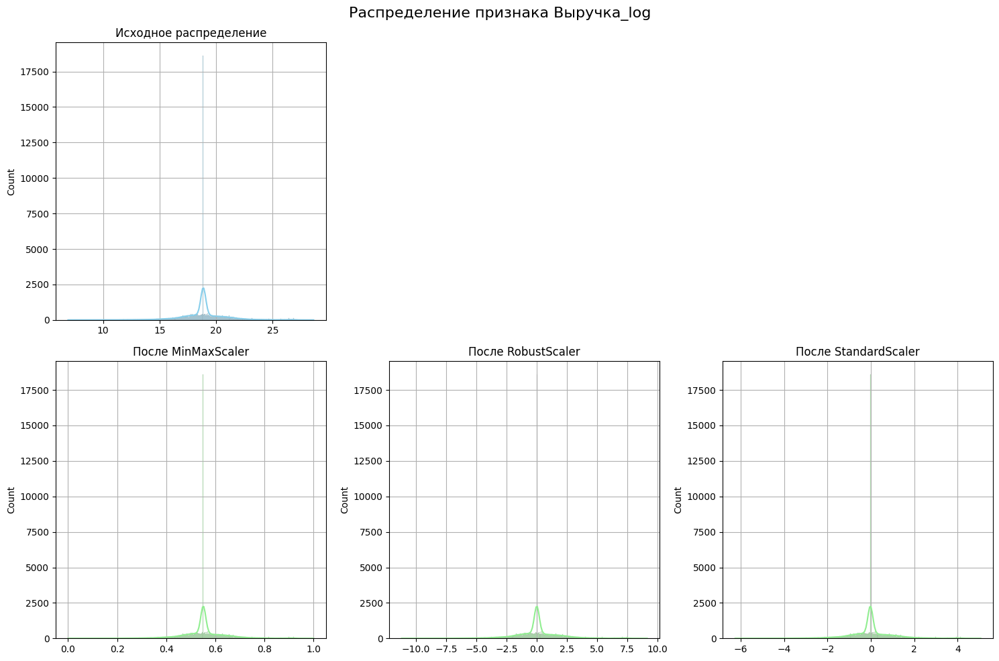


Статистики для Стоимость_log:
Среднее: 13.66
Медиана: 13.66
Стд. отклонение: 1.65

Статистики после MinMaxScaler:
Среднее: 0.58
Медиана: 0.58
Стд. отклонение: 0.07
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: -0.00
Медиана: 0.00
Стд. отклонение: 0.86
Min: -7.11
Max: 5.09

Статистики после StandardScaler:
Среднее: -0.00
Медиана: 0.00
Стд. отклонение: 1.00
Min: -8.27
Max: 5.93


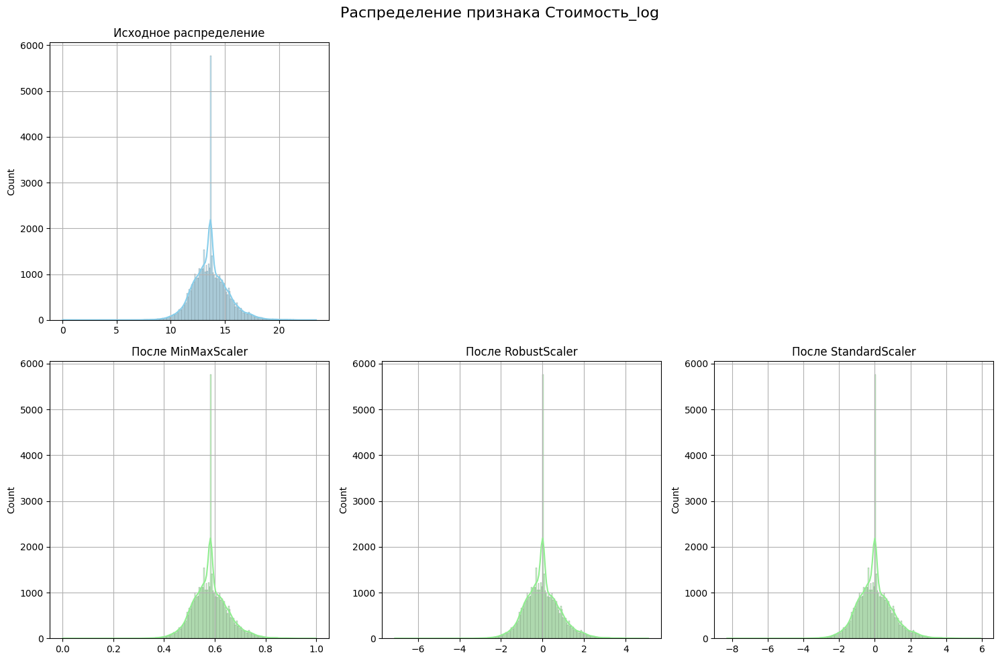


Анализ группы: Временные признаки

Статистики для Длительность приема заявок:
Среднее: 10.41
Медиана: 9.00
Стд. отклонение: 11.88

Статистики после MinMaxScaler:
Среднее: 0.01
Медиана: 0.01
Стд. отклонение: 0.01
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.24
Медиана: 0.00
Стд. отклонение: 1.98
Min: -1.50
Max: 245.67

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.12
Стд. отклонение: 1.00
Min: -0.88
Max: 123.92


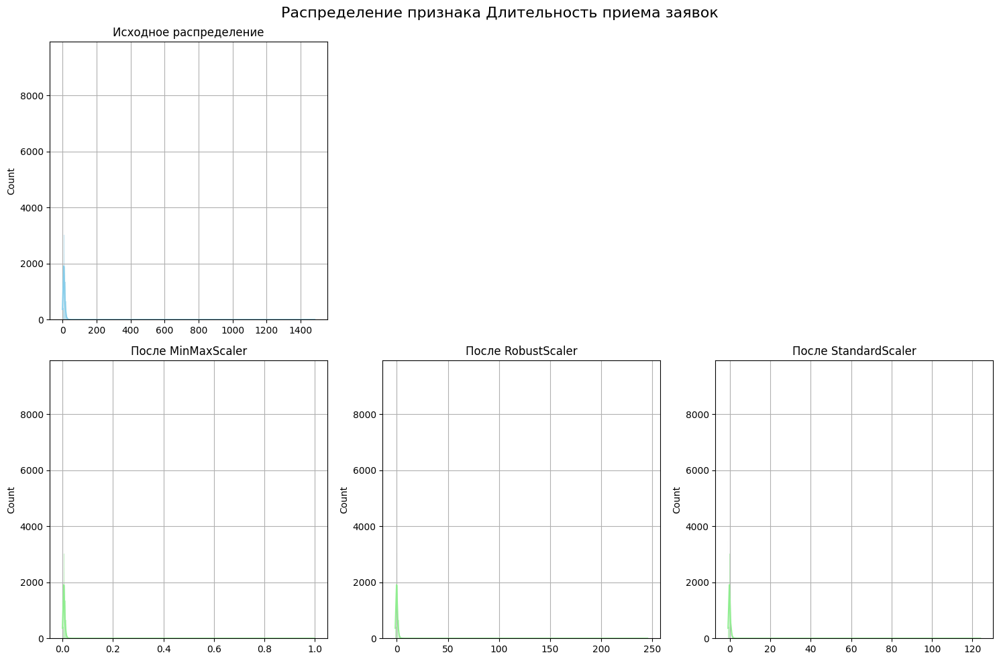


Статистики для Время до торгов:
Среднее: 17.63
Медиана: 13.00
Стд. отклонение: 16.62

Статистики после MinMaxScaler:
Среднее: 0.02
Медиана: 0.01
Стд. отклонение: 0.02
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.33
Медиана: 0.00
Стд. отклонение: 1.19
Min: -0.93
Max: 76.21

Статистики после StandardScaler:
Среднее: -0.00
Медиана: -0.28
Стд. отклонение: 1.00
Min: -1.06
Max: 63.91


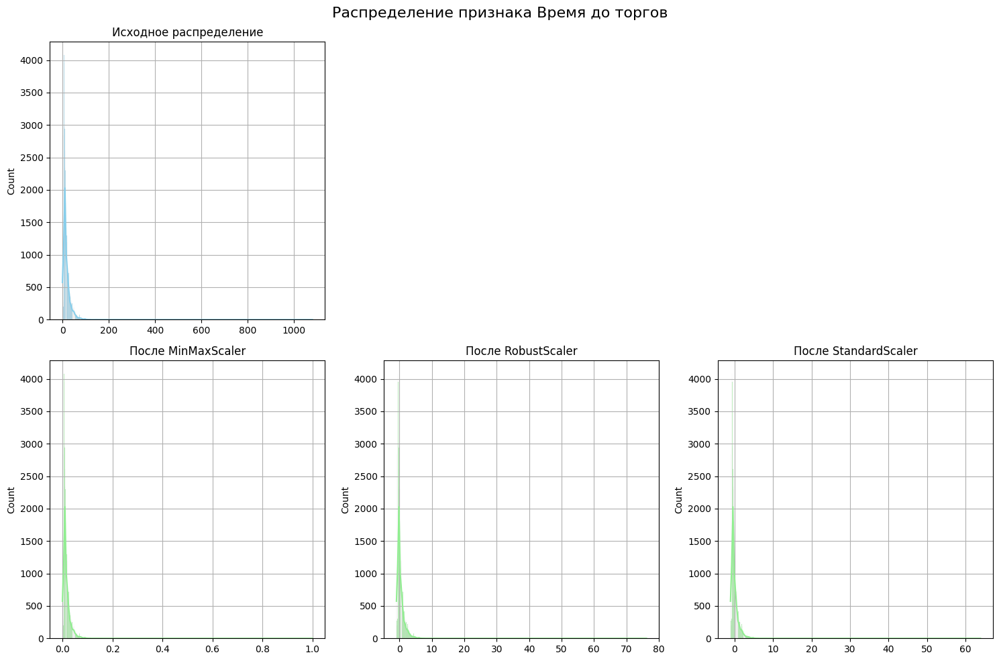


Статистики для Длительность тендера (дни):
Среднее: 9.71
Медиана: 8.00
Стд. отклонение: 7.46

Статистики после MinMaxScaler:
Среднее: 0.47
Медиана: 0.47
Стд. отклонение: 0.01
Min: 0.00
Max: 1.00

Статистики после RobustScaler:
Среднее: 0.34
Медиана: 0.00
Стд. отклонение: 1.49
Min: -60.00
Max: 68.40

Статистики после StandardScaler:
Среднее: 0.00
Медиана: -0.23
Стд. отклонение: 1.00
Min: -40.42
Max: 45.59


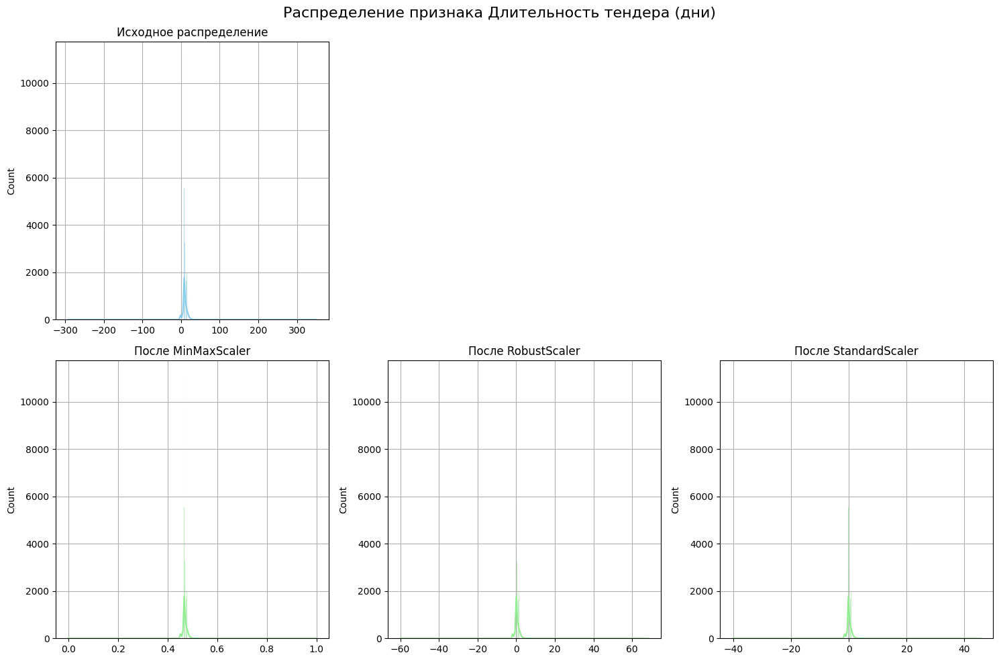

In [28]:
def analyze_feature_distribution(df, feature, scalers, sample_size=5000):
    data = df[feature].copy()
    data = data.sample(n=sample_size, random_state=42)
    
    data_array = data.values
    
    print(f"\nСтатистики для {feature}:")
    print(f"Среднее: {format_number(np.mean(data_array))}")
    print(f"Медиана: {format_number(np.median(data_array))}")
    print(f"Стд. отклонение: {format_number(np.std(data_array))}")
    
    fig, axes = plt.subplots(nrows=2, ncols=len(scalers), figsize=(15, 10))
    plt.suptitle(f'Распределение признака {feature}', fontsize=16)
    
    sns.histplot(data=data_array, kde=True, ax=axes[0, 0], color='skyblue', stat='count')
    axes[0, 0].set_title('Исходное распределение')
    axes[0, 0].grid(True)
    
    for idx in range(1, len(scalers)):
        axes[0, idx].axis('off')
    
    data_reshaped = data_array.reshape(-1, 1)
    for idx, (name, scaler) in enumerate(scalers.items()):
        scaled_data = scaler.fit_transform(data_reshaped).ravel()
        
        sns.histplot(data=scaled_data, kde=True, ax=axes[1, idx], color='lightgreen', stat='count')
        axes[1, idx].set_title(f'После {name}')
        axes[1, idx].grid(True)
        
        print(f"\nСтатистики после {name}:")
        print(f"Среднее: {format_number(np.mean(scaled_data))}")
        print(f"Медиана: {format_number(np.median(scaled_data))}")
        print(f"Стд. отклонение: {format_number(np.std(scaled_data))}")
        print(f"Min: {format_number(np.min(scaled_data))}")
        print(f"Max: {format_number(np.max(scaled_data))}")
    
    plt.tight_layout()
    plt.show()
    plt.close()


features_groups = {
    "Процентные признаки": [
        'Процент побед', 'Процент побед по региону', 'Снижение на торгах,%',
        'Процент побед по заказчику', 'Процент побед по сфере'
    ],
    "Количественные признаки": [
        'Кол-во побед по региону', 'Кол-во побед по заказчику',
        'Кол-во побед по сфере', 'Общее кол-во побед', 'Кол-во конкурентов в тендере',
        'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
        'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере',
        'Обеспечение заявки (руб.)', 'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log'
    ],
    "Временные признаки": [
        'Длительность приема заявок', 'Время до торгов',
        'Длительность тендера (дни)'
    ]
}

numerical_features = ['Снижение на торгах,%', 'Обеспечение заявки (руб.)', 'Обеспечение контракта (руб.)',
       'Обеспечение контракта, %', 'Выручка_log', 'Стоимость_log',
       'Процент побед', 'Кол-во побед по региону', 'Процент побед по региону', 
       'Кол-во побед по заказчику', 'Процент побед по заказчику',
       'Кол-во побед по сфере', 'Процент побед по сфере', 'Общее кол-во побед',
       'Среднее снижение цены', 'Кол-во конкурентов в тендере',
       'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
       'Длительность тендера (дни)', 'Кол-во уникальных поставщиков в регионе', 
       'Кол-во уникальных поставщиков в сфере', 'Длительность приема заявок',
       'Время до торгов'
]

scalers = {
    'MinMaxScaler': MinMaxScaler(),
    'RobustScaler': RobustScaler(),
    'StandardScaler': StandardScaler()
}

for group_name, features in features_groups.items():
    print(f"\nАнализ группы: {group_name}")
    for feature in features:
        analyze_feature_distribution(df, feature, scalers, sample_size=50000)

Все процентные признаки уже имеют значение от 0 до 1, их можно оставить без шкалирования, данные уже нормализованы 

Для различных количеств побед и участий наблюдаются сильно скошенные распрделения, много выбросов, поэтому лучше всего использовать RobustScaler - он как раз устойчив к ним, для борьбы с асимметрией лучше всего подойдет медианное центрирование и масштабирование по квартилям. Количество конкурентов тоже везде скошено, а именно вправо, есть пики, длинные хвосты - тоже применяем RobustScaler

Для всех временных признаков тоже подойдет RobustScaler лучше всего: у всех длинный правый хвост, несколько пиков в распределении, не похоже на нормальное, чтобы можно было использовать StandartScaler

___


Посмотрим, что происходит с выбросами, а также как меняется распределение значений признаков при обработке выбросов, будем использовать IQR, он более устойчив к эстремальным выбросам, не предполагает нормальность распределения (наш случай), использует более робастные оценки


Распределения в целом получились не сильно сбалансированными. Так, процент побед имеет сильные пики около 0 и 1, как и в целом другие проценты, но выбросов здесь нет, что логично для процентных значений

По количествам видно много выбросов, поэтому после их обработки диапазон значений сильно уменьшается (например, с 500 до 14 для количества побед по региону). Теперь лучше видно структуру распределения

Для стоимости видны очень сильные выбросы. Медиана смещена к нижней границе - очень много небольших значений и немного очень больших, после обработки выбросов структура прослеживается намного четче


Обработка признака: Снижение на торгах,%

До обработки:
Среднее: 0.12
Медиана: 0.10
Стд. отклонение: 1.75
Min: -99.56
Max: 2.01

После обработки:
Среднее: 0.16
Медиана: 0.10
Стд. отклонение: 0.23
Min: -0.93
Max: 1.55

Процент выбросов: 0.22%


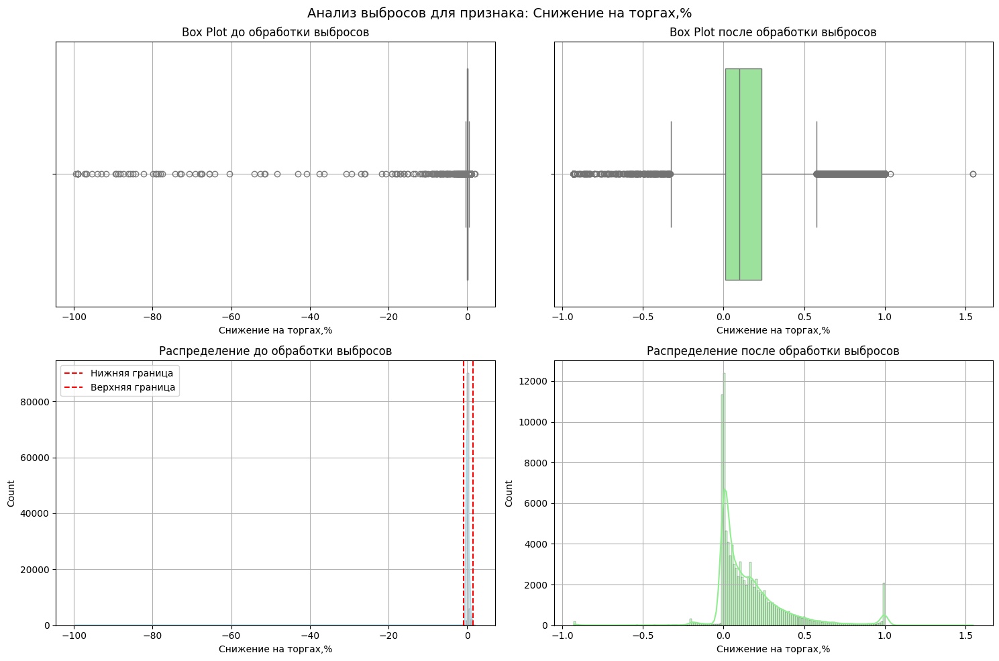


Обработка признака: Обеспечение заявки (руб.)

До обработки:
Среднее: 115276.49
Медиана: 10152.21
Стд. отклонение: 880829.63
Min: 0.00
Max: 111059815.90

После обработки:
Среднее: 67372.47
Медиана: 10152.21
Стд. отклонение: 191597.92
Min: 0.00
Max: 1041110.34

Процент выбросов: 2.32%


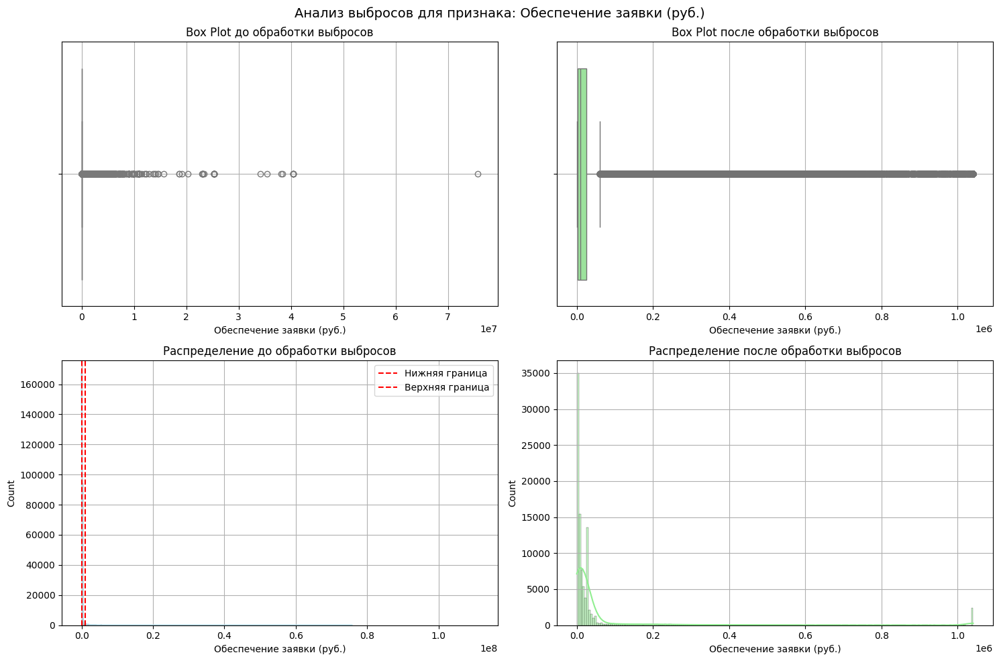


Обработка признака: Обеспечение контракта (руб.)

До обработки:
Среднее: 661098.25
Медиана: 44479.34
Стд. отклонение: 5500827.60
Min: 0.01
Max: 171359095.23

После обработки:
Среднее: 283297.37
Медиана: 44479.34
Стд. отклонение: 734200.46
Min: 0.01
Max: 3852704.94

Процент выбросов: 2.62%


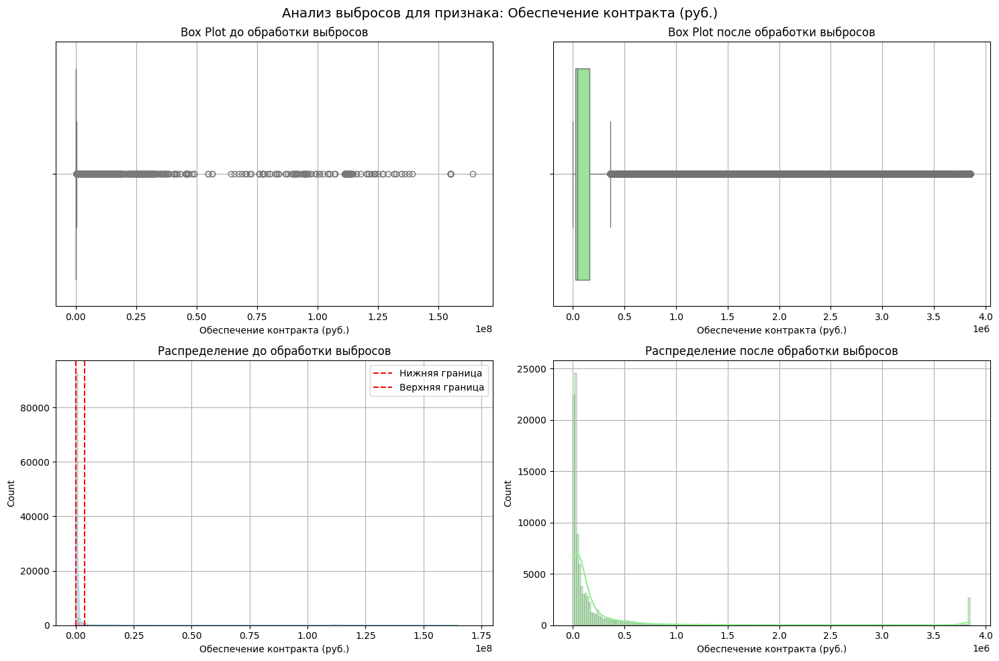


Обработка признака: Обеспечение контракта, %

До обработки:
Среднее: 0.06
Медиана: 0.05
Стд. отклонение: 0.02
Min: 0.05
Max: 0.10

После обработки:
Среднее: 0.06
Медиана: 0.05
Стд. отклонение: 0.02
Min: 0.05
Max: 0.10

Процент выбросов: 0.00%


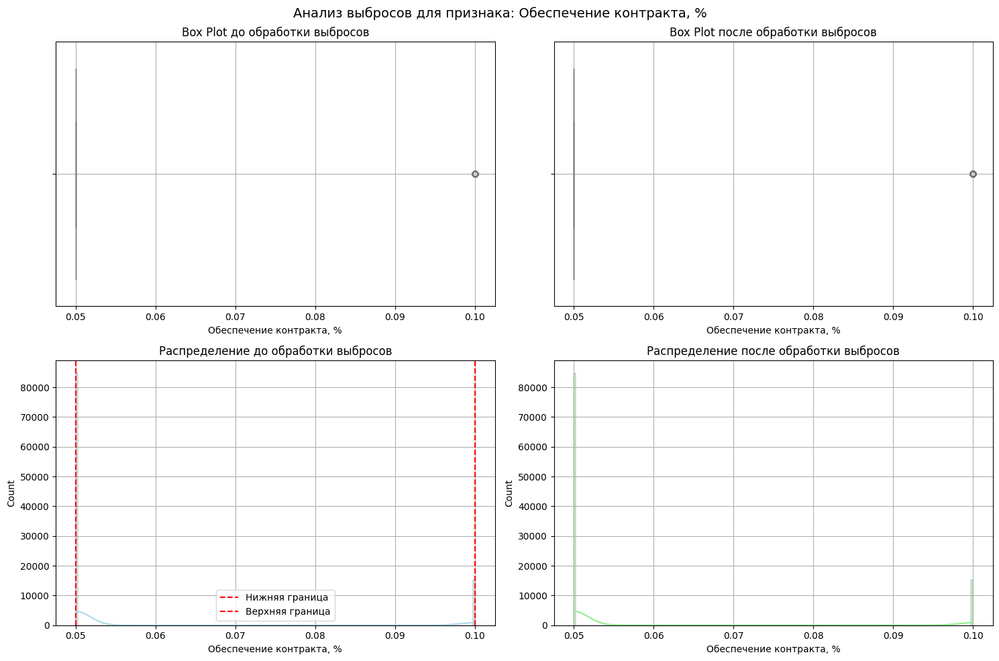


Обработка признака: Выручка_log

До обработки:
Среднее: 18.89
Медиана: 18.86
Стд. отклонение: 1.88
Min: 6.91
Max: 28.62

После обработки:
Среднее: 18.89
Медиана: 18.86
Стд. отклонение: 1.88
Min: 6.91
Max: 28.62

Процент выбросов: 0.00%


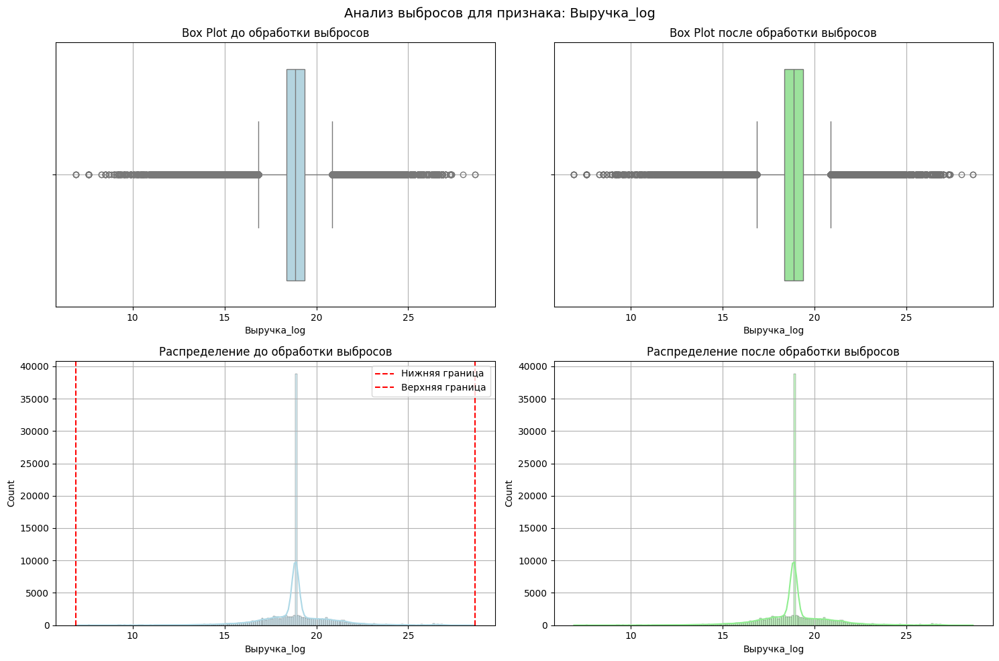


Обработка признака: Стоимость_log

До обработки:
Среднее: 13.71
Медиана: 13.66
Стд. отклонение: 1.60
Min: 0.28
Max: 26.09

После обработки:
Среднее: 13.71
Медиана: 13.66
Стд. отклонение: 1.60
Min: 3.31
Max: 24.38

Процент выбросов: 0.01%


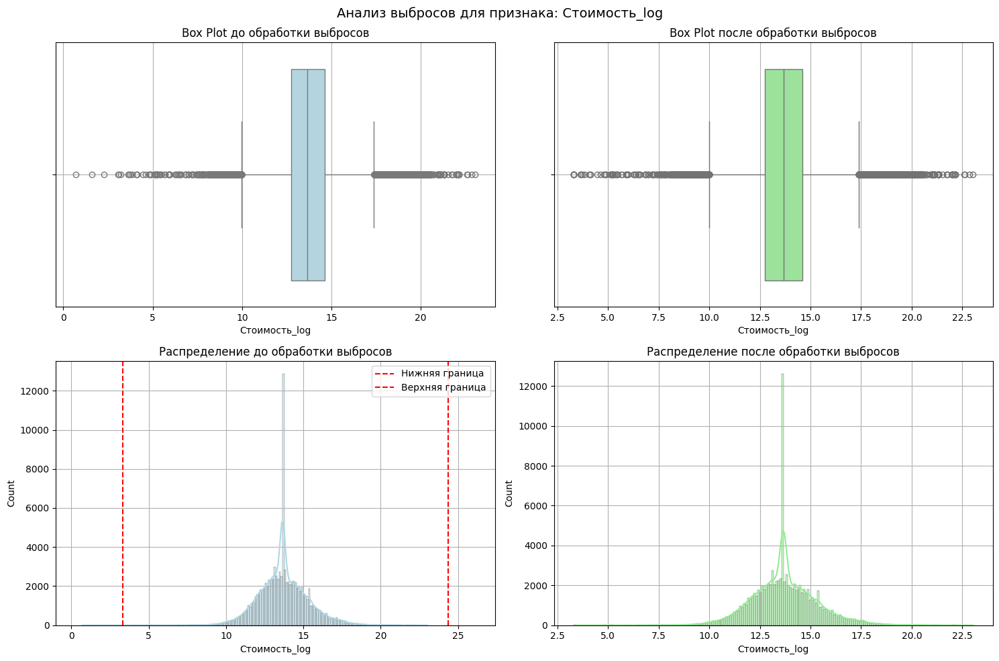


Обработка признака: Процент побед

До обработки:
Среднее: 0.45
Медиана: 0.41
Стд. отклонение: 0.30
Min: 0.00
Max: 1.00

После обработки:
Среднее: 0.45
Медиана: 0.41
Стд. отклонение: 0.30
Min: 0.00
Max: 1.00

Процент выбросов: 0.00%


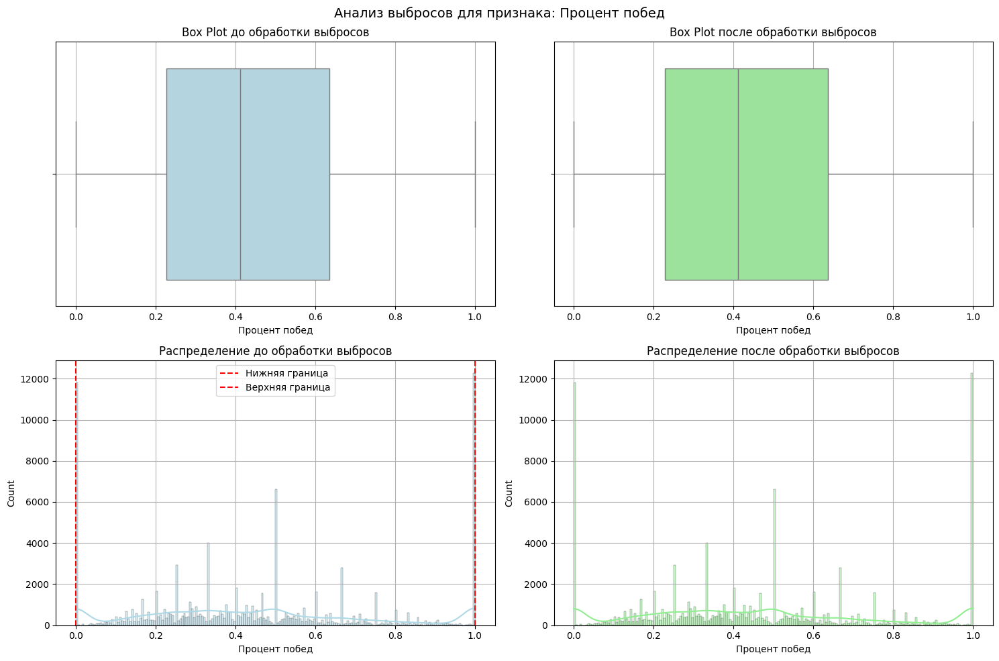


Обработка признака: Кол-во побед по региону

До обработки:
Среднее: 8.74
Медиана: 1.00
Стд. отклонение: 36.53
Min: 0.00
Max: 559.00

После обработки:
Среднее: 6.35
Медиана: 1.00
Стд. отклонение: 13.89
Min: 0.00
Max: 77.50

Процент выбросов: 1.96%


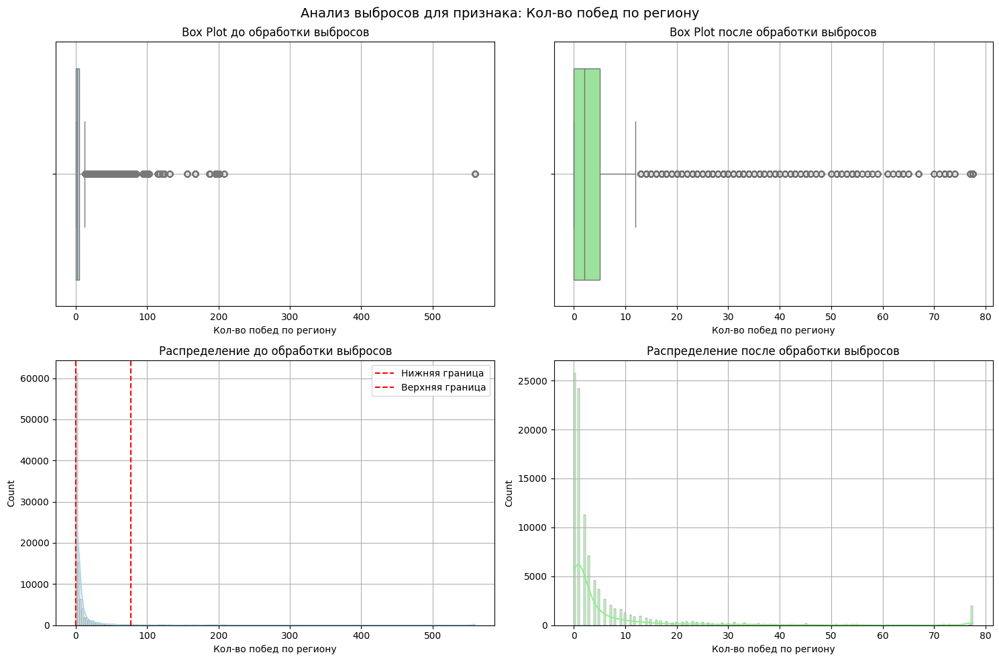


Обработка признака: Процент побед по региону

До обработки:
Среднее: 0.45
Медиана: 0.42
Стд. отклонение: 0.37
Min: 0.00
Max: 1.00

После обработки:
Среднее: 0.45
Медиана: 0.42
Стд. отклонение: 0.37
Min: 0.00
Max: 1.00

Процент выбросов: 0.00%


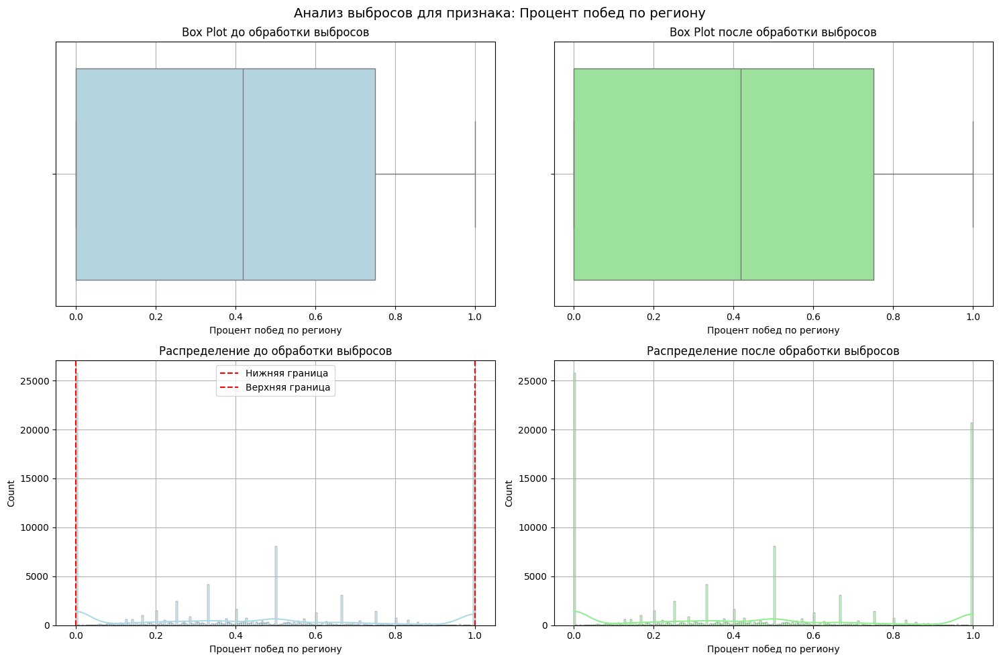


Обработка признака: Кол-во побед по заказчику

До обработки:
Среднее: 4.17
Медиана: 1.00
Стд. отклонение: 16.39
Min: 0.00
Max: 208.00

После обработки:
Среднее: 2.77
Медиана: 1.00
Стд. отклонение: 6.44
Min: 0.00
Max: 35.00

Процент выбросов: 2.38%


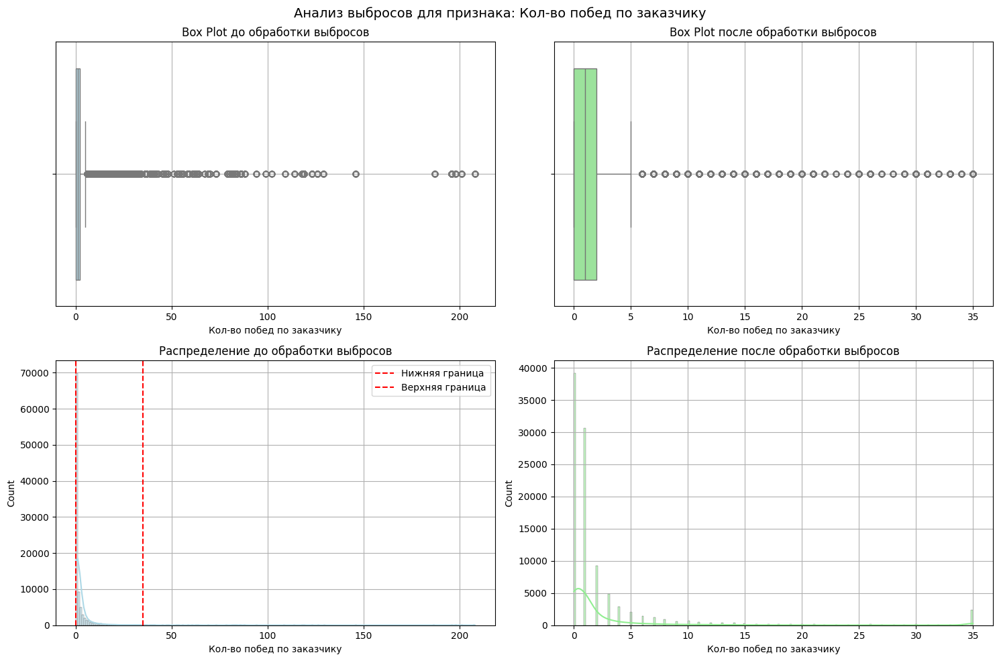


Обработка признака: Кол-во участий по заказчику

До обработки:
Среднее: 8.98
Медиана: 2.00
Стд. отклонение: 38.13
Min: 1.00
Max: 657.00

После обработки:
Среднее: 5.84
Медиана: 2.00
Стд. отклонение: 12.25
Min: 1.00
Max: 66.00

Процент выбросов: 2.50%


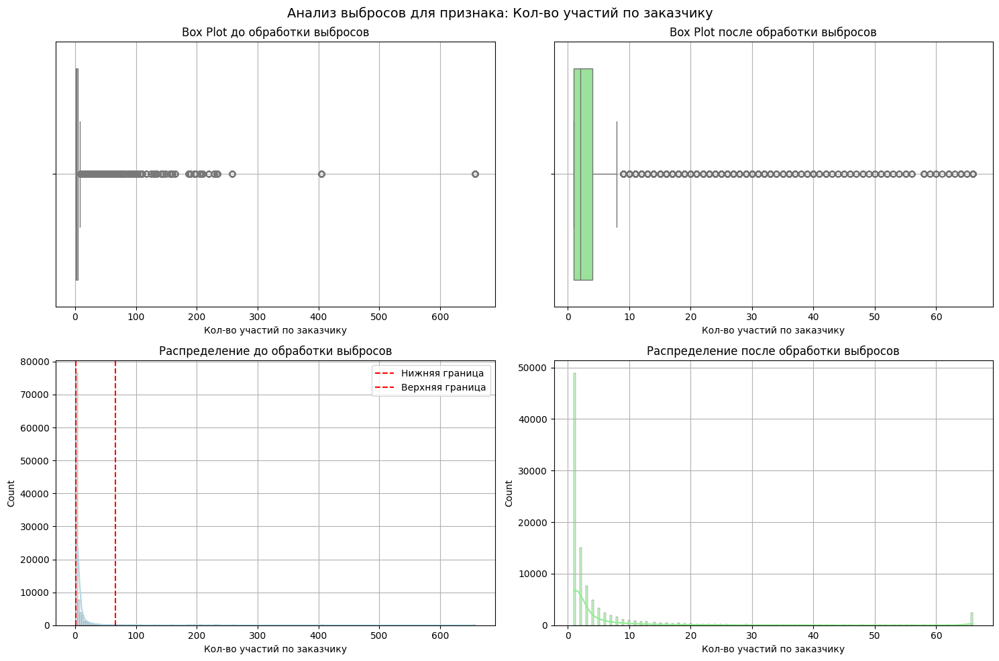


Обработка признака: Процент побед по заказчику

До обработки:
Среднее: 0.45
Медиана: 0.39
Стд. отклонение: 0.43
Min: 0.00
Max: 1.00

После обработки:
Среднее: 0.45
Медиана: 0.39
Стд. отклонение: 0.43
Min: 0.00
Max: 1.00

Процент выбросов: 0.00%


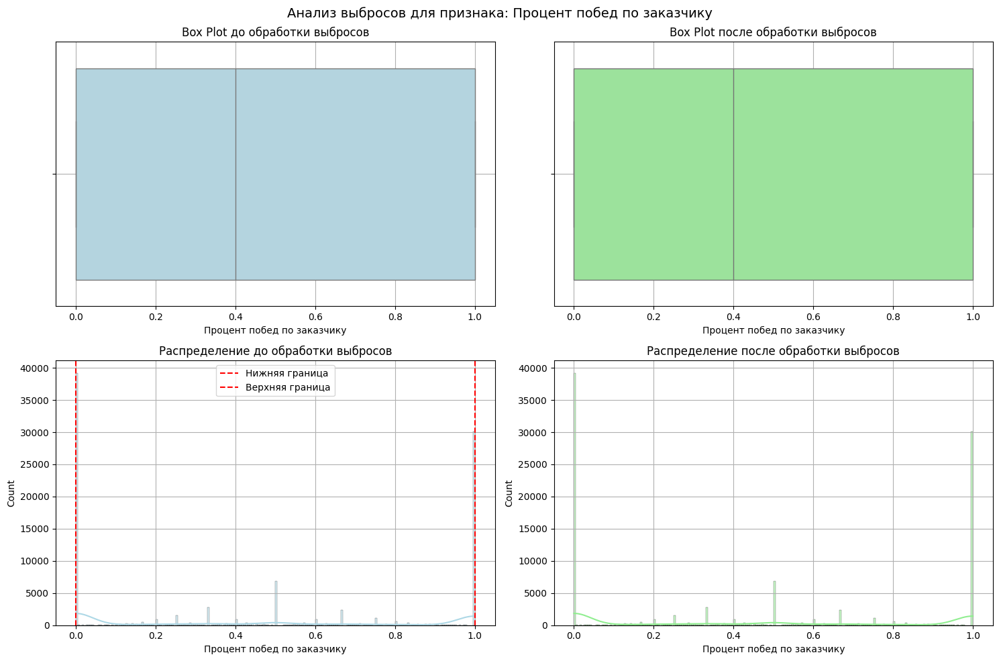


Обработка признака: Кол-во побед по сфере

До обработки:
Среднее: 5.65
Медиана: 1.00
Стд. отклонение: 20.65
Min: 0.00
Max: 273.00

После обработки:
Среднее: 4.29
Медиана: 1.00
Стд. отклонение: 10.32
Min: 0.00
Max: 57.50

Процент выбросов: 2.04%


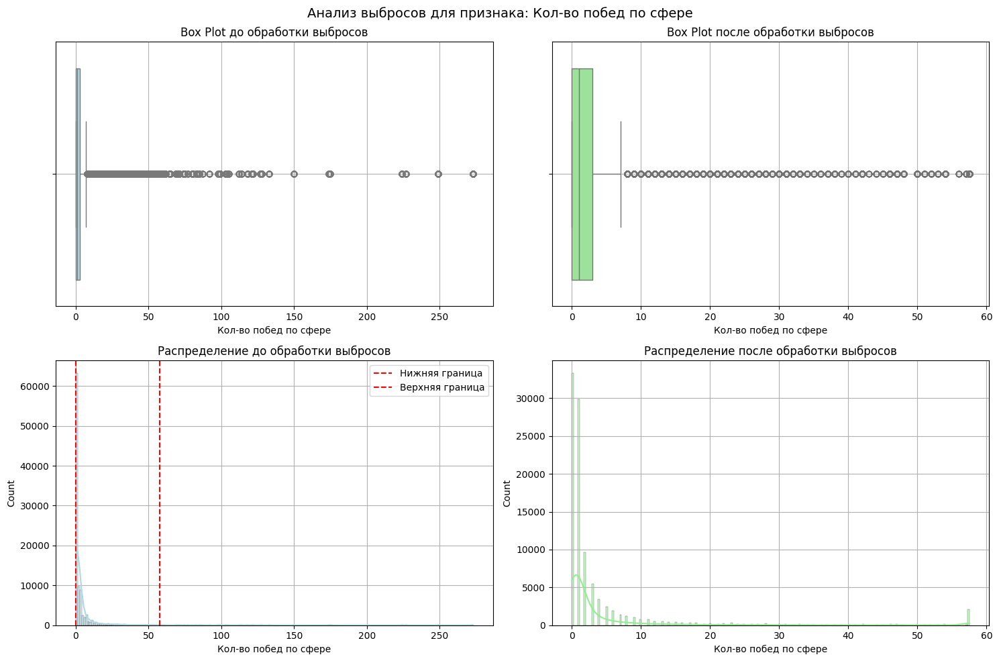


Обработка признака: Процент побед по сфере

До обработки:
Среднее: 0.45
Медиана: 0.39
Стд. отклонение: 0.41
Min: 0.00
Max: 1.00

После обработки:
Среднее: 0.45
Медиана: 0.39
Стд. отклонение: 0.41
Min: 0.00
Max: 1.00

Процент выбросов: 0.00%


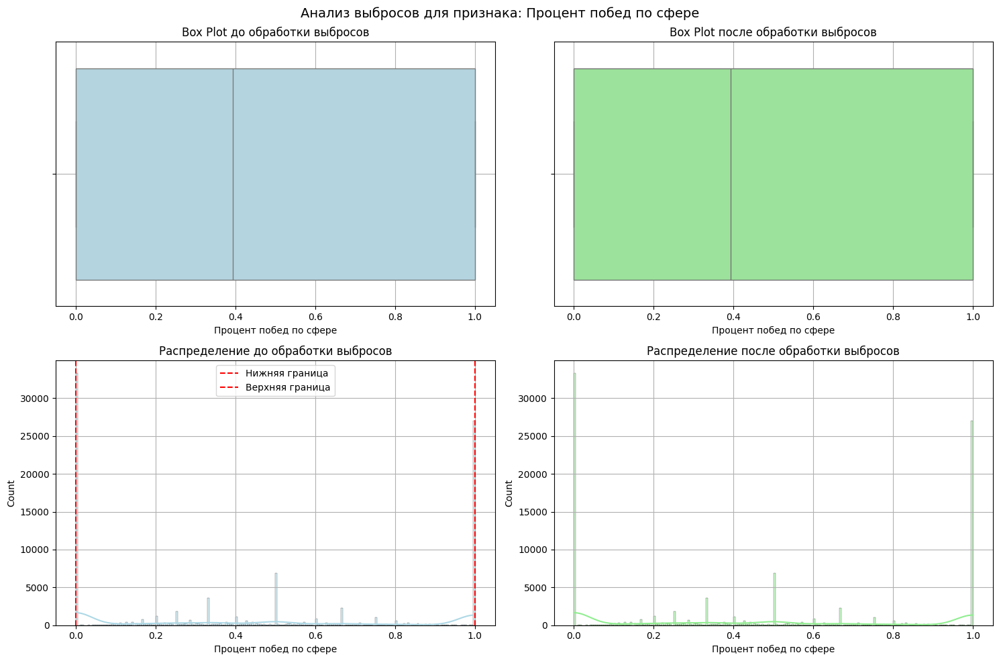


Обработка признака: Общее кол-во побед

До обработки:
Среднее: 46.30
Медиана: 4.00
Стд. отклонение: 244.41
Min: 0.00
Max: 2182.00

После обработки:
Среднее: 19.52
Медиана: 4.00
Стд. отклонение: 44.89
Min: 0.00
Max: 235.00

Процент выбросов: 2.82%


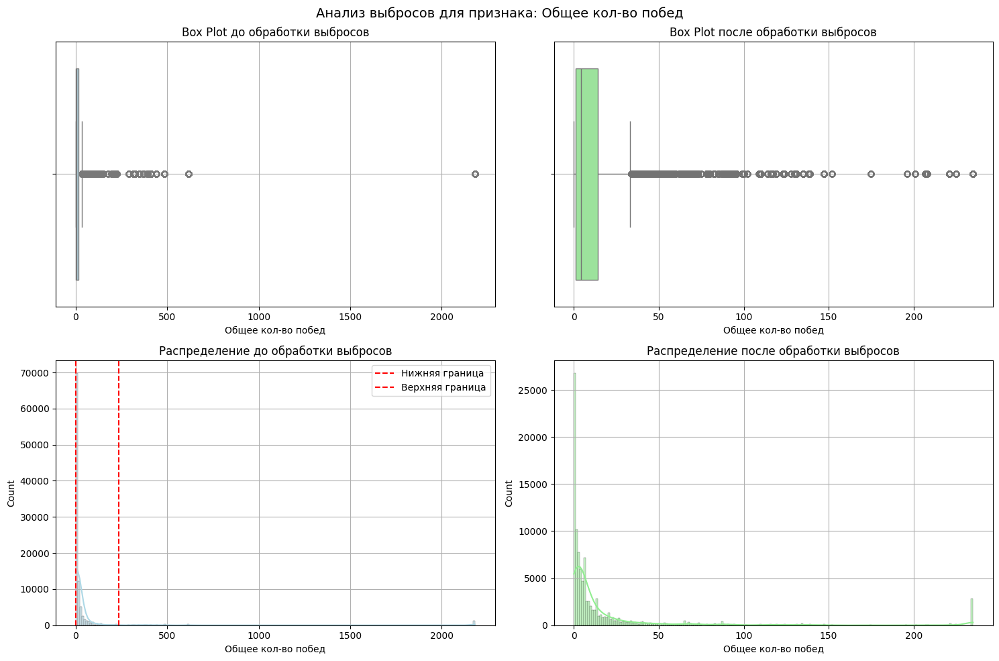


Обработка признака: Кол-во конкурентов в тендере

До обработки:
Среднее: 3.81
Медиана: 2.00
Стд. отклонение: 10.62
Min: 0.00
Max: 266.00

После обработки:
Среднее: 3.24
Медиана: 2.00
Стд. отклонение: 4.11
Min: 0.00
Max: 25.00

Процент выбросов: 1.20%


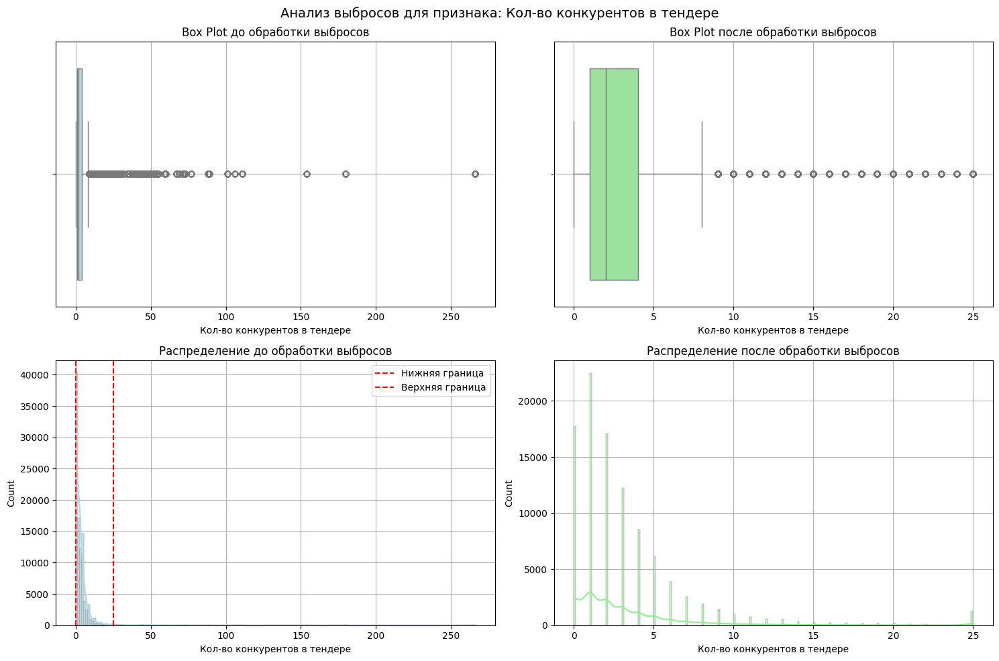


Обработка признака: Среднее кол-во конкурентов в регионе

До обработки:
Среднее: 3.81
Медиана: 3.40
Стд. отклонение: 1.34
Min: 1.49
Max: 8.54

После обработки:
Среднее: 3.81
Медиана: 3.40
Стд. отклонение: 1.34
Min: 1.49
Max: 8.54

Процент выбросов: 0.00%


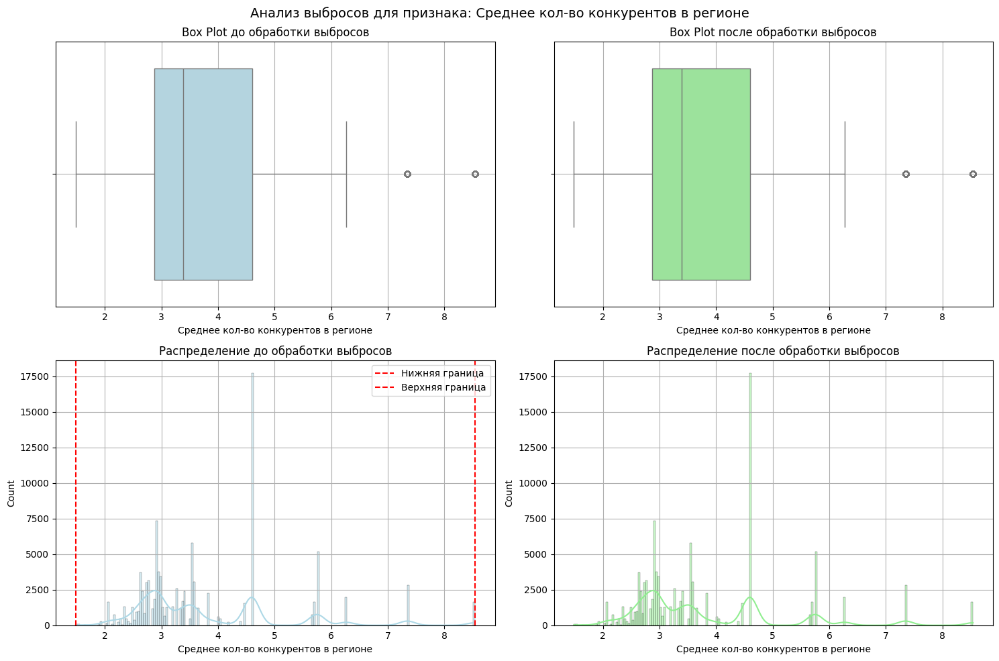


Обработка признака: Среднее кол-во конкурентов в сфере

До обработки:
Среднее: 3.81
Медиана: 3.01
Стд. отклонение: 5.93
Min: 0.00
Max: 122.38

После обработки:
Среднее: 3.50
Медиана: 3.01
Стд. отклонение: 2.43
Min: 0.00
Max: 18.18

Процент выбросов: 0.79%


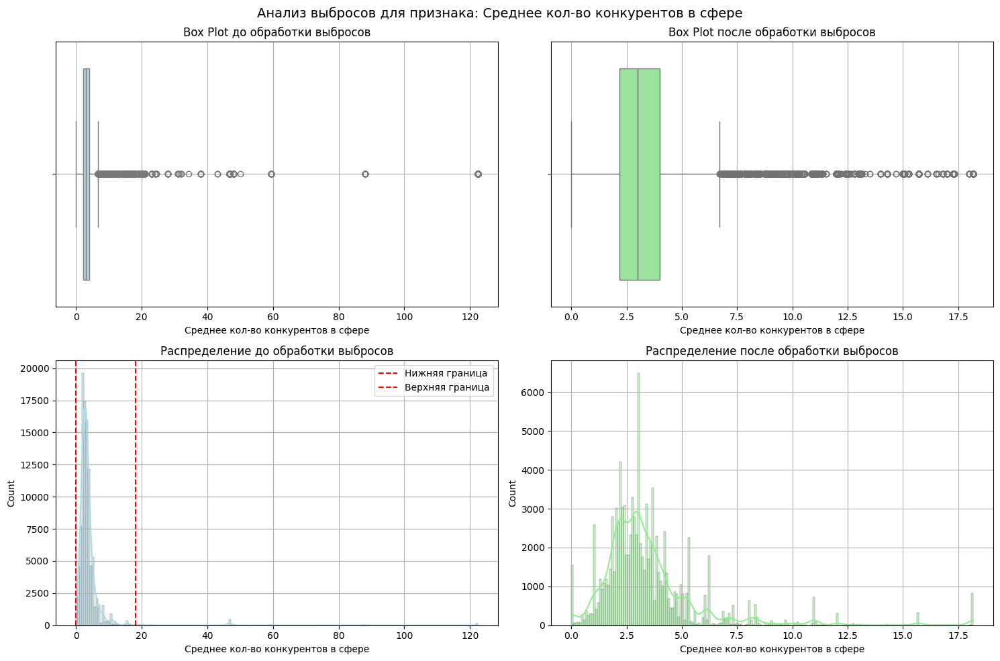


Обработка признака: Среднее кол-во конкурентов у заказчика

До обработки:
Среднее: 3.81
Медиана: 2.74
Стд. отклонение: 5.65
Min: 0.00
Max: 69.88

После обработки:
Среднее: 3.37
Медиана: 2.74
Стд. отклонение: 2.95
Min: 0.00
Max: 18.08

Процент выбросов: 2.31%


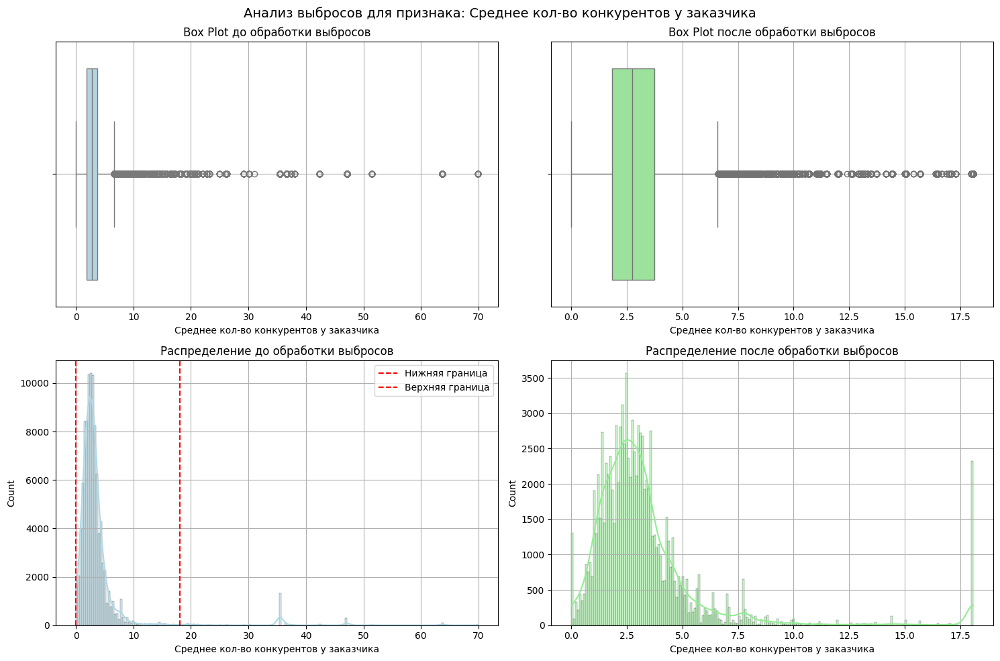


Обработка признака: Длительность тендера (дни)

До обработки:
Среднее: 10.75
Медиана: 9.00
Стд. отклонение: 7.65
Min: -350.00
Max: 350.00

После обработки:
Среднее: 10.68
Медиана: 9.00
Стд. отклонение: 5.95
Min: -16.50
Max: 43.50

Процент выбросов: 0.50%


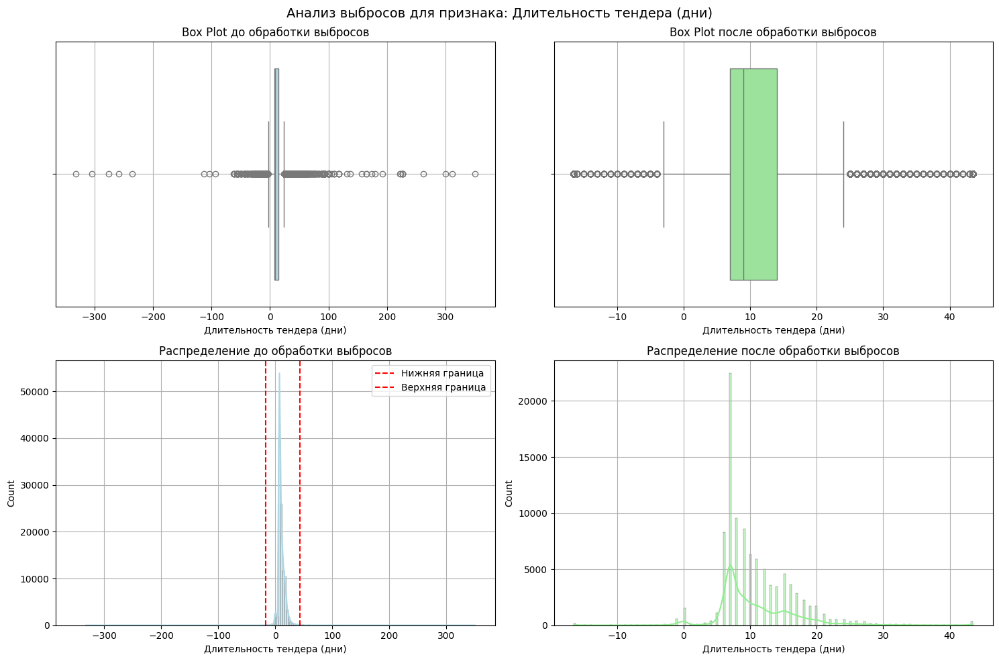


Обработка признака: Кол-во уникальных поставщиков в регионе

До обработки:
Среднее: 6600.82
Медиана: 3212.00
Стд. отклонение: 7378.41
Min: 47.00
Max: 21976.00

После обработки:
Среднее: 6600.82
Медиана: 3212.00
Стд. отклонение: 7378.41
Min: 47.00
Max: 21976.00

Процент выбросов: 0.00%


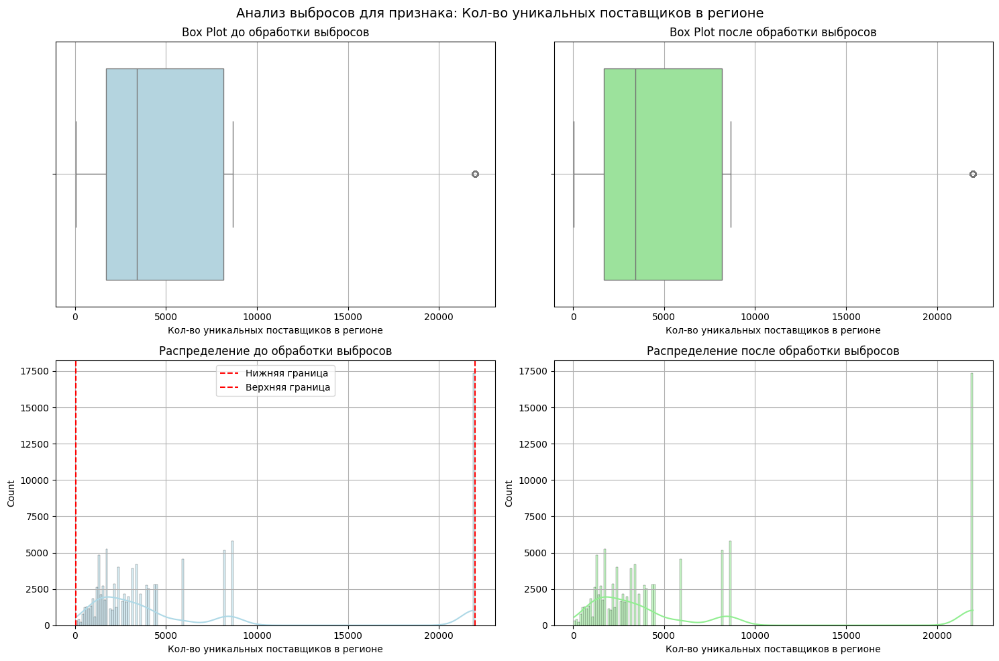


Обработка признака: Кол-во уникальных поставщиков в сфере

До обработки:
Среднее: 720.10
Медиана: 470.00
Стд. отклонение: 792.80
Min: 1.00
Max: 3330.00

После обработки:
Среднее: 720.10
Медиана: 470.00
Стд. отклонение: 792.80
Min: 1.00
Max: 3330.00

Процент выбросов: 0.00%


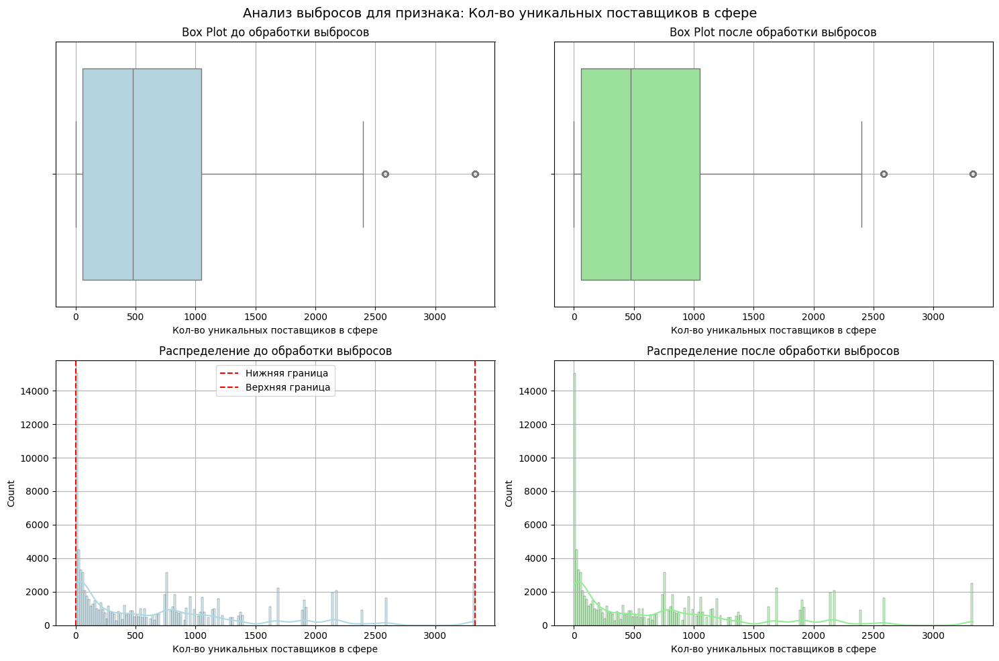


Обработка признака: Длительность приема заявок

До обработки:
Среднее: 11.32
Медиана: 10.00
Стд. отклонение: 10.25
Min: 0.00
Max: 1483.00

После обработки:
Среднее: 11.19
Медиана: 10.00
Стд. отклонение: 5.69
Min: 0.00
Max: 43.50

Процент выбросов: 0.32%


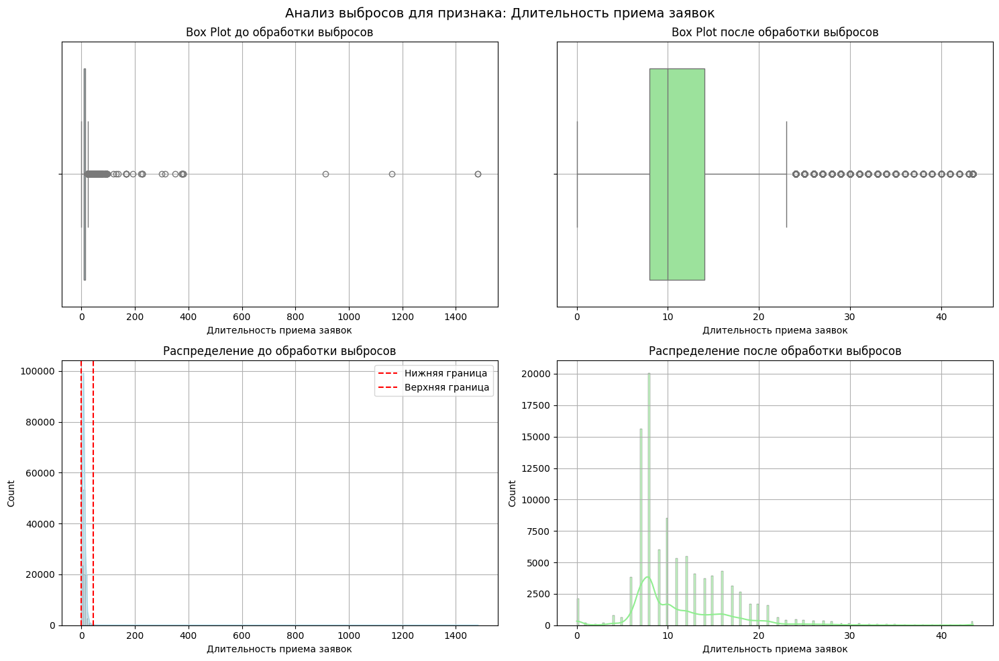


Обработка признака: Время до торгов

До обработки:
Среднее: 19.50
Медиана: 14.00
Стд. отклонение: 16.78
Min: 0.00
Max: 1080.00

После обработки:
Среднее: 19.40
Медиана: 14.00
Стд. отклонение: 15.52
Min: 0.00
Max: 116.00

Процент выбросов: 0.16%


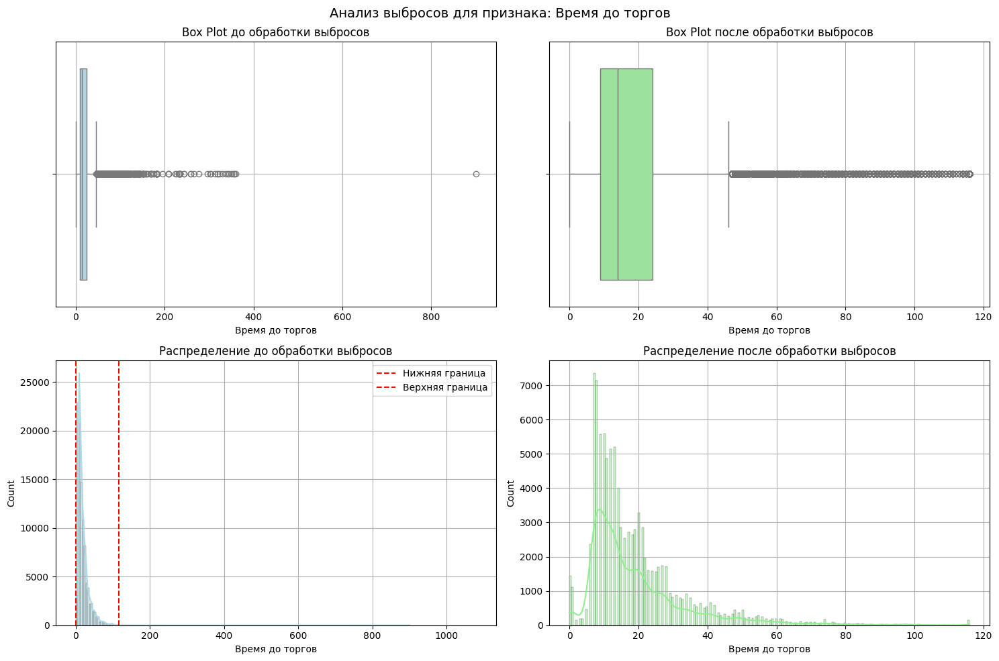

In [28]:
def visualize_outliers(df, feature, results, sample_size=10000):
    """
    Визуализация на выборке данных
    """
    if len(df) > sample_size:
        df_sample = df.sample(n=sample_size, random_state=42)
    else:
        df_sample = df.copy()
    
    lower_bound, upper_bound = results['bounds']
    data_min = df[feature].min()
    data_max = df[feature].max()
    
    plot_lower = lower_bound if lower_bound > data_min else data_min
    plot_upper = upper_bound if upper_bound < data_max else data_max
    
    df_sample_clean = df_sample.copy()
    df_sample_clean[feature] = df_sample_clean[feature].clip(lower_bound, upper_bound)
    
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'Анализ выбросов для признака: {feature}', fontsize=14)
    
    sns.boxplot(x=df_sample[feature], ax=axes[0, 0], color='lightblue', orient='horizontal')
    axes[0, 0].set_title('Box Plot до обработки выбросов')
    axes[0, 0].grid(True)
    
    sns.boxplot(x=df_sample_clean[feature], ax=axes[0, 1], color='lightgreen', orient='horizontal')
    axes[0, 1].set_title('Box Plot после обработки выбросов')
    axes[0, 1].grid(True)
    
    sns.histplot(data=df_sample, x=feature, kde=True, ax=axes[1, 0], 
                color='lightblue', stat='count', bins=200)
    
    axes[1, 0].axvline(plot_lower, color='red', linestyle='--', label='Нижняя граница')
    axes[1, 0].axvline(plot_upper, color='red', linestyle='--', label='Верхняя граница')
    axes[1, 0].set_title('Распределение до обработки выбросов')
    
    margin = (data_max - data_min) * 0.05
    axes[1, 0].set_xlim(data_min - margin, data_max + margin)
    axes[1, 0].legend()
    axes[1, 0].grid(True)
    
    sns.histplot(data=df_sample_clean, x=feature, kde=True, ax=axes[1, 1],
                color='lightgreen', stat='count', bins=200)
    axes[1, 1].set_title('Распределение после обработки выбросов')
    
    clean_min = df_sample_clean[feature].min()
    clean_max = df_sample_clean[feature].max()
    clean_margin = (clean_max - clean_min) * 0.05
    lower_lim = clean_min - clean_margin if clean_margin > 0 else clean_min
    upper_lim = clean_max + clean_margin if clean_margin > 0 else clean_max
    axes[1, 1].set_xlim(lower_lim, upper_lim)
    axes[1, 1].grid(True)
    
    plt.tight_layout()
    plt.show()
    plt.close()

df_clean = train_data.copy()
for feature in numerical_features:
    print(f"\nОбработка признака: {feature}")
    
    Q1 = train_data[feature].quantile(0.05)
    Q3 = train_data[feature].quantile(0.95)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    cleaned_values = train_data[feature].clip(lower_bound, upper_bound)
    
    # Статистики
    orig_stats = {
        'mean': train_data[feature].mean(),
        'median': train_data[feature].median(),
        'std': train_data[feature].std(),
        'min': train_data[feature].min(),
        'max': train_data[feature].max()
    }
    
    clean_stats = {
        'mean': cleaned_values.mean(),
        'median': cleaned_values.median(),
        'std': cleaned_values.std(),
        'min': cleaned_values.min(),
        'max': cleaned_values.max()
    }
    
    outlier_percentage = ((train_data[feature] != cleaned_values).sum() / len(train_data) * 100)

    results = {'cleaned_values': cleaned_values,
        'bounds': (lower_bound, upper_bound),
        'orig_stats': orig_stats,
        'clean_stats': clean_stats,
        'outlier_percentage': outlier_percentage
    }
    
    df_clean[feature] = results['cleaned_values']
    
    print("\nДо обработки:")
    print(f"Среднее: {results['orig_stats']['mean']:.2f}")
    print(f"Медиана: {results['orig_stats']['median']:.2f}")
    print(f"Стд. отклонение: {results['orig_stats']['std']:.2f}")
    print(f"Min: {results['orig_stats']['min']:.2f}")
    print(f"Max: {results['orig_stats']['max']:.2f}")
    
    print("\nПосле обработки:")
    print(f"Среднее: {results['clean_stats']['mean']:.2f}")
    print(f"Медиана: {results['clean_stats']['median']:.2f}")
    print(f"Стд. отклонение: {results['clean_stats']['std']:.2f}")
    print(f"Min: {results['clean_stats']['min']:.2f}")
    print(f"Max: {results['clean_stats']['max']:.2f}")
    
    print(f"\nПроцент выбросов: {results['outlier_percentage']:.2f}%")
    
    visualize_outliers(train_data, feature, results, sample_size=100000)

Займемся проблемой дисбаланса классов. Делаем это только после обработки редких категорий и выбросов, так как иначе можем случайно размножить редкие категории при балансировке, таким образом алгоритм получится более стабильным

In [29]:
all_data = pd.concat([df_clean, val_data, test_data], axis=0)

train_data_processed = all_data[all_data['Год'].isin(range(2015, 2020))].copy()
val_data_processed = all_data[all_data['Год'].isin(range(2020, 2021))].copy()
test_data_processed = all_data[all_data['Год'].isin(range(2021, 2026))].copy()

X = train_data_processed[numerical_features + categorical_features].copy()
y = train_data_processed['Target'].values

In [233]:
train_processed = train_data_processed
val_processed = val_data_processed
test_processed = test_data_processed

In [222]:
print(train_data_processed.shape)
print(val_data_processed.shape)
print(test_data_processed.shape)

(382227, 50)
(57839, 50)
(51991, 50)


In [110]:
def analyze_class_distribution(data, name):
    total = len(data)
    winners = (data['Target'] == 1).sum()
    losers = (data['Target'] == 0).sum()
    print(f"{name}:")
    print(f"Победители (класс 1): {winners:,} ({winners/total:.2%})")
    print(f"Проигравшие (класс 0): {losers:,} ({losers/total:.2%})")
    print(f"Всего записей: {total:,}\n")

analyze_class_distribution(train_data_processed, "Тренировочные данные (2015-2019)")
analyze_class_distribution(val_data_processed, "Валидационные данные (2020)")
analyze_class_distribution(test_data_processed, "Тестовые данные (2021-2025)")
analyze_class_distribution(pd.concat([train_data_processed, val_data_processed, test_data_processed]), "Все данные")

yearly_distribution = pd.concat([train_data_processed, val_data_processed, test_data_processed]).groupby('Год')['Target'].value_counts(normalize=True).unstack()
print("Распределение классов по годам:")
print(yearly_distribution)

Тренировочные данные (2015-2019):
Победители (класс 1): 170,752 (44.67%)
Проигравшие (класс 0): 211,475 (55.33%)
Всего записей: 382,227

Валидационные данные (2020):
Победители (класс 1): 29,039 (50.21%)
Проигравшие (класс 0): 28,800 (49.79%)
Всего записей: 57,839

Тестовые данные (2021-2025):
Победители (класс 1): 36,502 (70.21%)
Проигравшие (класс 0): 15,489 (29.79%)
Всего записей: 51,991

Все данные:
Победители (класс 1): 236,293 (48.02%)
Проигравшие (класс 0): 255,764 (51.98%)
Всего записей: 492,057

Распределение классов по годам:
Target         0         1
Год                       
2015    0.684814  0.315186
2016    0.641509  0.358491
2017    0.650693  0.349307
2018    0.500192  0.499808
2019    0.555807  0.444193
2020    0.497934  0.502066
2021    0.321739  0.678261
2022    0.261199  0.738801
2023    0.295703  0.704297
2024    0.308117  0.691883
2025    0.318493  0.681507


Проблема: есть сильный временной сдвиг в данных, распределение в тестовой части сильно отличать от тренировочного, распределение меняется во времени, поэтому балансировка на данном этапе может усугубить проблему, скрыв реальные паттерны в даннх

Попробуем решить проблему дисбаланса классов с учетом временной структуры данных: будем придавать больший вес более поздним наблюдениям, так как с 2020 года распределение начало сильно меняться. Будем использовать следующие параметры: decay_factor - фактор временного затухания (чем больше, тем больше вес поздних наблюдений), target_ratio - целевое соотношение классов (если None, используется среднее по всем данным)

In [8]:
def create_adaptive_temporal_weights(df, decay_factor=0.1, target_ratio=None):
    weights = np.ones(len(df))
    years = sorted(df['Год'].unique())
    min_year = min(years)
    max_year = max(years)
    year_range = max_year - min_year
    
    if target_ratio is None:
        target_ratio = df['Target'].mean()
    
    print(f"Целевое соотношение классов (доля положительного класса): {target_ratio:.3f}")
    print("\nРаспределение по годам до взвешивания:")

    for year in years:
        year_data = df[df['Год'] == year]
        pos_ratio = year_data['Target'].mean()
        print(f"{year}: {pos_ratio:.3f} (n={len(year_data)})")
    
    for year in years:
        year_mask = df['Год'] == year
        year_data = df[year_mask]
        
        time_weight = np.exp(decay_factor * (year - min_year) / year_range)
        
        pos_mask = year_data['Target'] == 1
        current_pos_ratio = pos_mask.mean()
        
        class_weights = np.where(pos_mask,
                               target_ratio / current_pos_ratio if current_pos_ratio > 0 else 1,
                               (1 - target_ratio) / (1 - current_pos_ratio) if current_pos_ratio < 1 else 1)
        
        sample_size_correction = 1 + 0.3 * np.log(1 + len(df) / len(year_data))
        
        weights[year_mask] = class_weights * time_weight * sample_size_correction
    
    weights = weights / weights.mean()
    
    print("\nЭффективное распределение после взвешивания:")
    for year in years:
        year_mask = df['Год'] == year
        weighted_pos_ratio = np.average(df[year_mask]['Target'], 
                                         weights=weights[year_mask])
        print(f"{year}: {weighted_pos_ratio:.3f}")
    
    return weights

train_weights = create_adaptive_temporal_weights(
    train_data_processed,
    decay_factor=0.15,
    target_ratio=0.502 # как на валидации
)

Целевое соотношение классов (доля положительного класса): 0.502

Распределение по годам до взвешивания:
2015: 0.315 (n=1745)
2016: 0.358 (n=2703)
2017: 0.349 (n=1732)
2018: 0.500 (n=28597)
2019: 0.444 (n=347450)

Эффективное распределение после взвешивания:
2015: 0.502
2016: 0.502
2017: 0.502
2018: 0.502
2019: 0.502


Распределения числовых признаков:


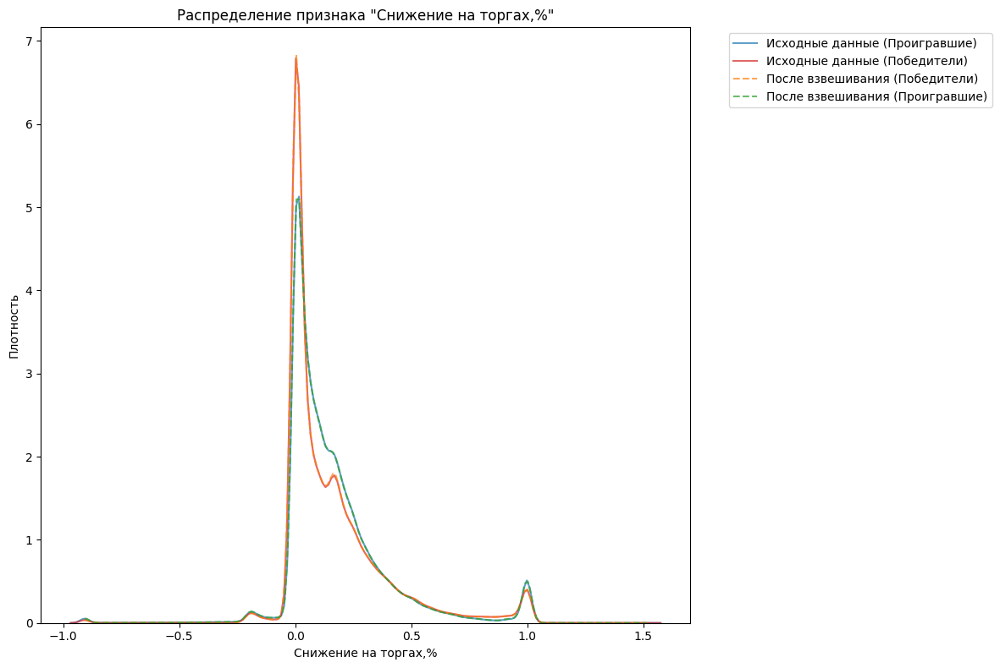

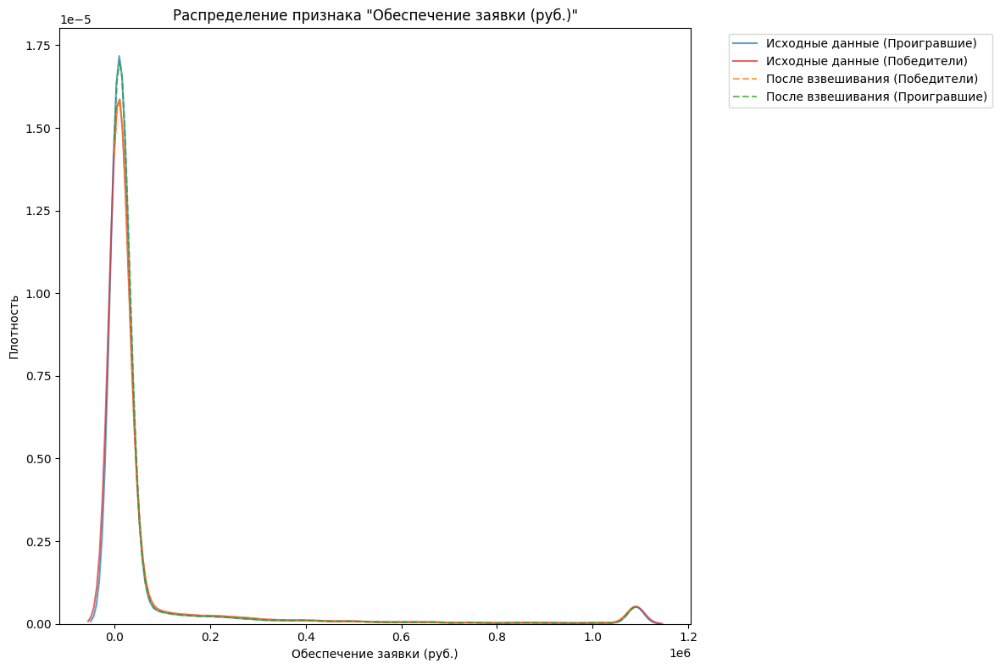

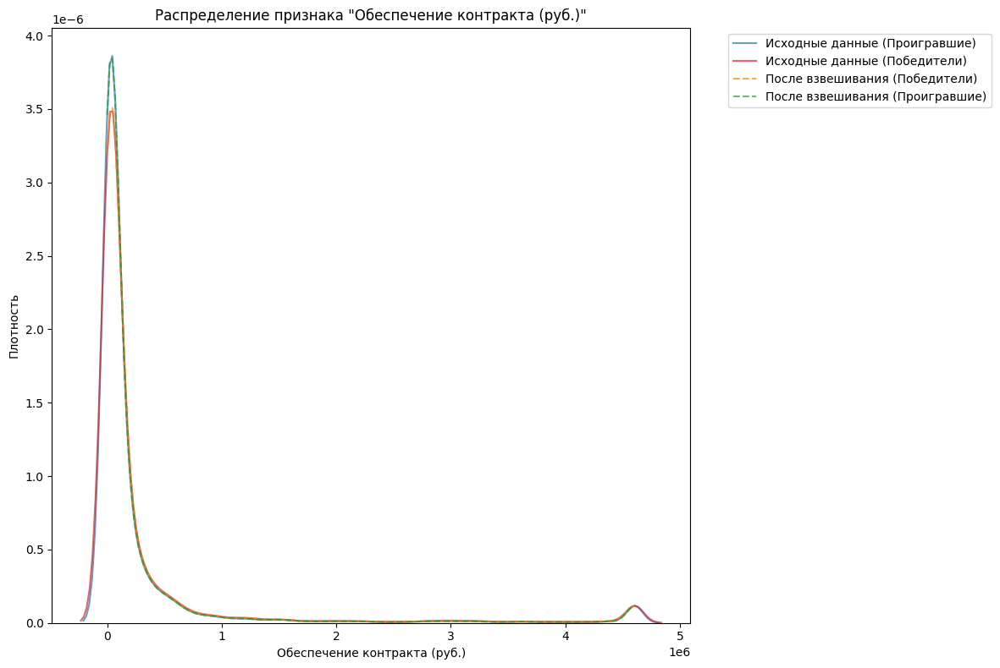

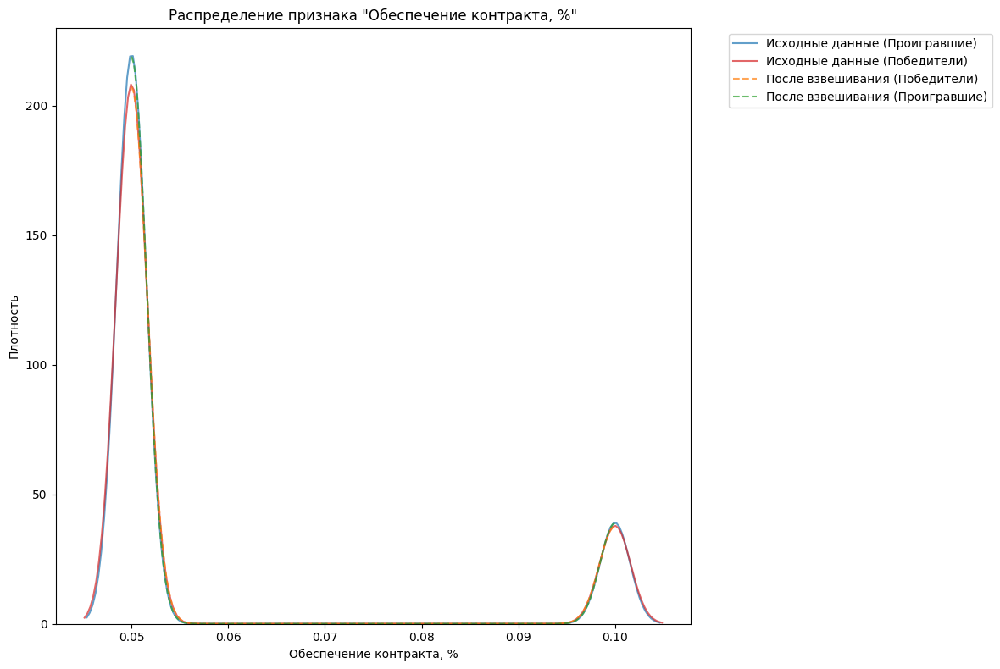

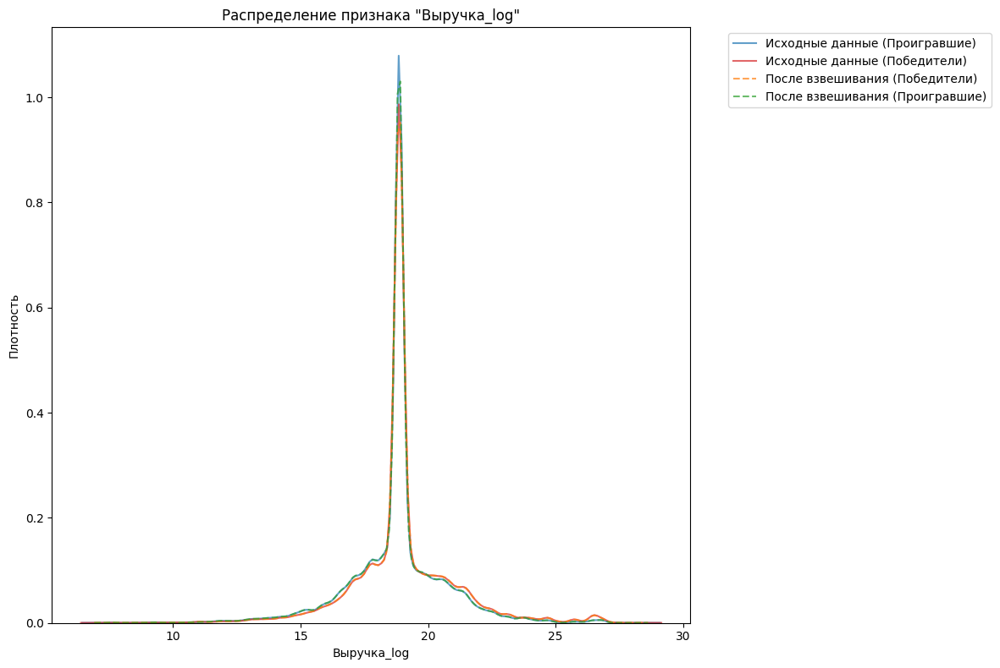

...

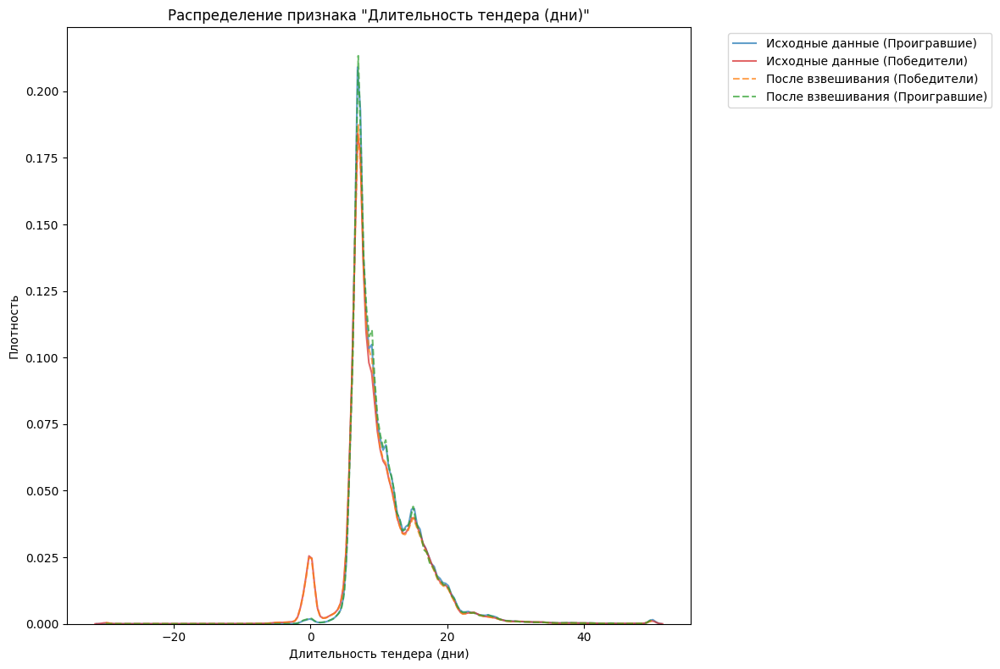

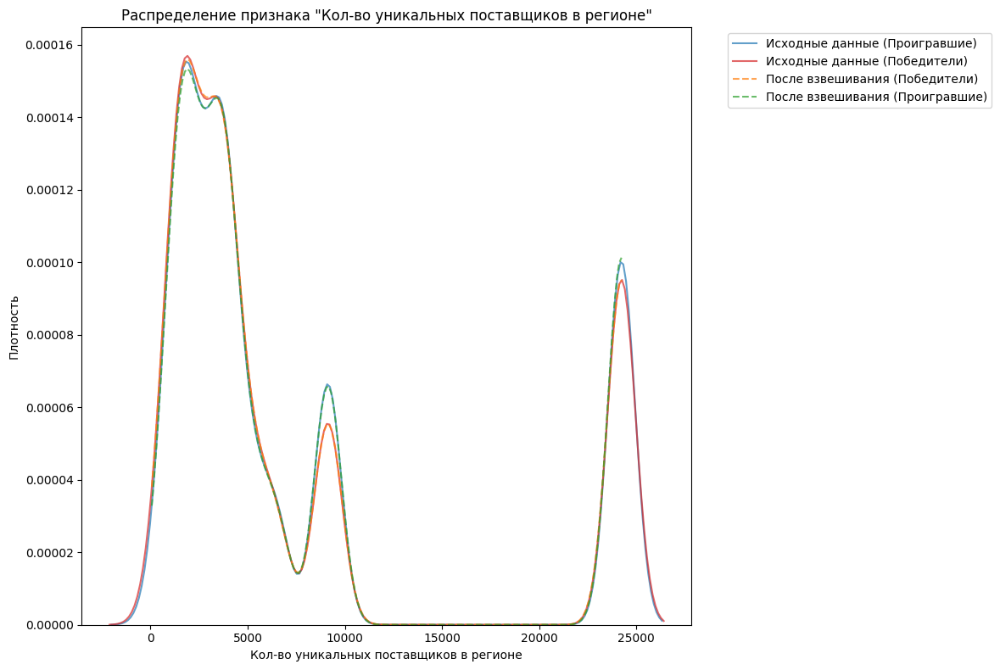

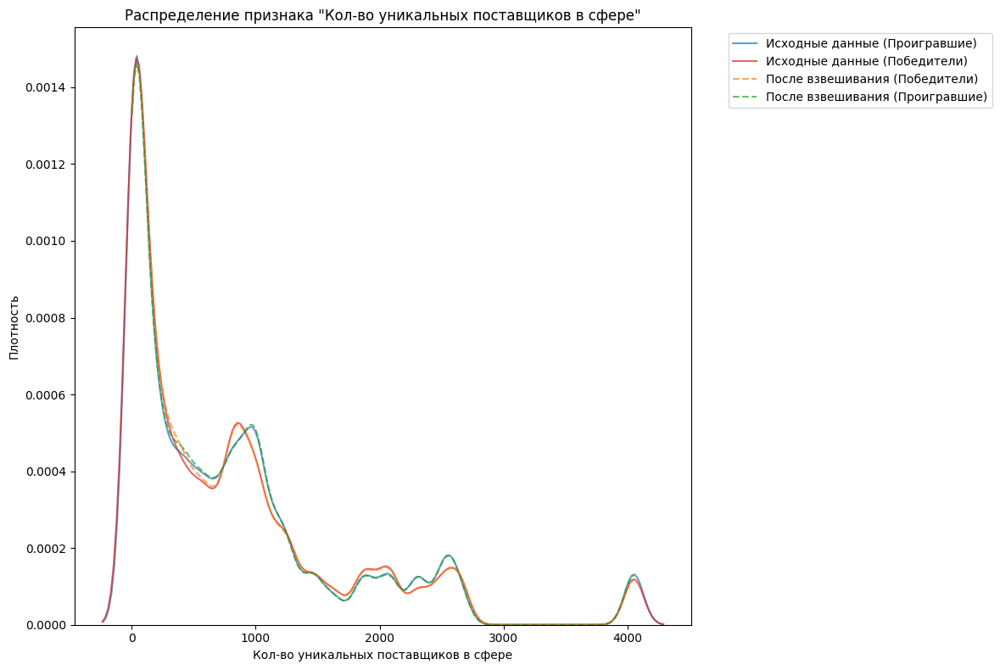

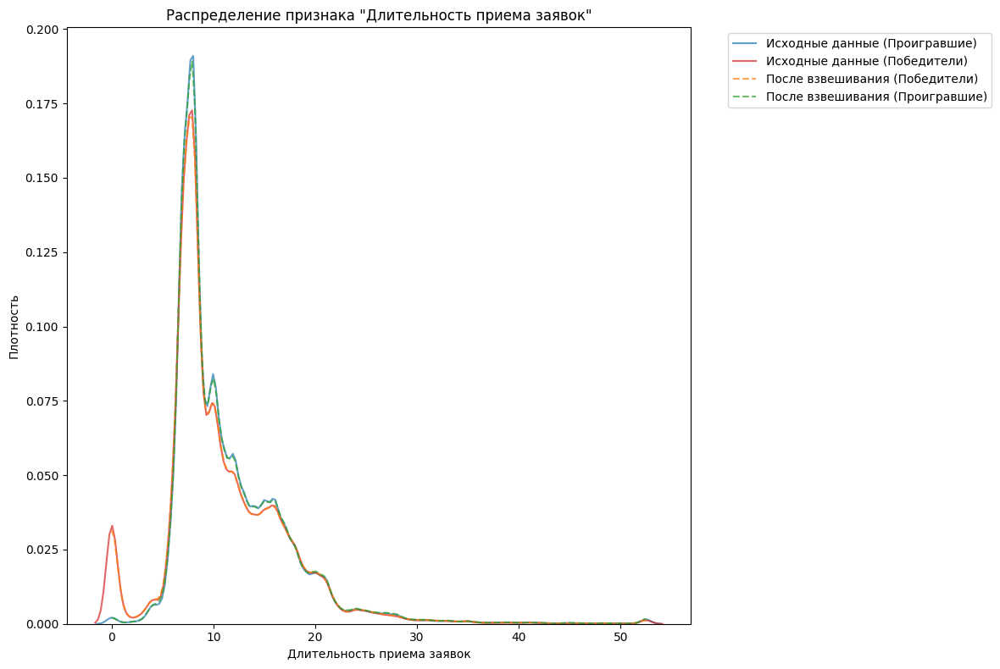

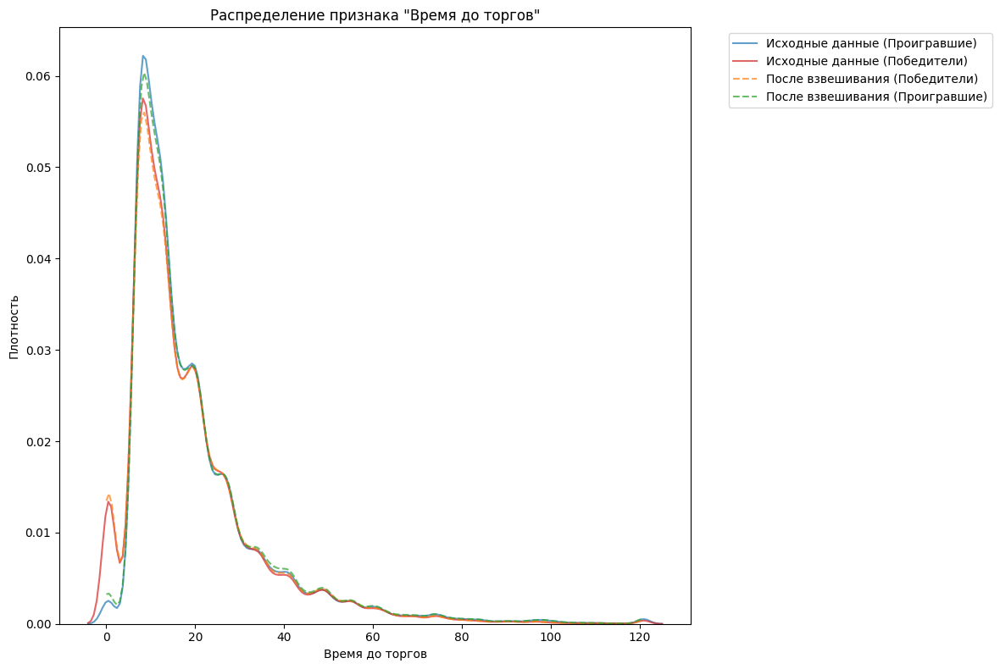

In [117]:
def analyze_weighted_distributions(df, weights, features):
    print("Распределения числовых признаков:")
    for feature in features:
        plt.figure(figsize=(12, 8))
        feature_min = df[feature].min()
        feature_max = df[feature].max()
        x_range = np.linspace(feature_min, feature_max, 200)
        
        sns.kdeplot(data=df[df['Target'] == 0], x=feature,
                        color='#1f77b4',
                        label='Исходные данные (Проигравшие)', 
                        alpha=0.7)
        sns.kdeplot(data=df[df['Target'] == 1], x=feature,
                        color='#d62728',
                        label='Исходные данные (Победители)', 
                        alpha=0.7)
        
        winners_mask = df['Target'] == 1
        winners_data = df[winners_mask][feature]
        winners_weights = weights[winners_mask]
                
        kde = gaussian_kde(winners_data, weights=winners_weights/winners_weights.sum(), bw_method='scott')
        plt.plot(x_range, kde(x_range), 
                color='#ff7f0e',
                label='После взвешивания (Победители)',
                alpha=0.7,
                linestyle='--')
                
        losers_mask = df['Target'] == 0
        losers_data = df[losers_mask][feature]
        losers_weights = weights[losers_mask]
                
        kde = gaussian_kde(losers_data, weights=losers_weights/losers_weights.sum(), bw_method='scott')
        plt.plot(x_range, kde(x_range), 
                color='#2ca02c',
                label='После взвешивания (Проигравшие)',
                alpha=0.7,
                linestyle='--')
        
        plt.title(f'Распределение признака "{feature}"')
        plt.xlabel(feature)
        plt.ylabel('Плотность')
        plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.tight_layout()
        plt.show()
        plt.close()

analyze_weighted_distributions(
    train_data_processed,
    train_weights,
    numerical_features
)

Ранние годы (2015-2017) получат больший вес из-за малого количества наблюдений
Более поздние наблюдения получат больший вес из-за временного фактора
Классы будут более сбалансированы в каждом году

In [9]:
percent_features = [
        'Процент побед', 'Процент побед по региону', 'Снижение на торгах,%',
        'Процент побед по заказчику', 'Обеспечение контракта, %', 'Процент побед по сфере'
    ]

numerical_features = ['Обеспечение заявки (руб.)', 'Обеспечение контракта (руб.)',
       'Выручка_log', 'Стоимость_log', 'Кол-во участий по заказчику', 'Среднее кол-во конкурентов у заказчика',
       'Кол-во побед по региону', 'Кол-во побед по заказчику', 'Кол-во побед по сфере', 
       'Общее кол-во побед', 'Кол-во конкурентов в тендере',
       'Среднее кол-во конкурентов в регионе', 'Среднее кол-во конкурентов в сфере',
       'Длительность тендера (дни)', 'Кол-во уникальных поставщиков в регионе', 
       'Кол-во уникальных поставщиков в сфере', 'Длительность приема заявок',
       'Время до торгов'
    ]

categorical_features = [
    'Уровень', 'Регион поставки', 'Сфера деятельности', 'Допущен',
    'Тип торгов', 'РНП ранее', 'Заказчик', 'Город поставки', 'Поставщик',
    'Субъект поставщика', 'Город поставщика', 'Публикация январь',
    'Окончание приема суббота', 'Дата окончания проведения торгов октябрь','Сводный риск'
]

time_features = ['Год', 'Месяц']

In [44]:
def preprocess_categorical_features(data, categorical_features, min_frequency=0.005):
    data_processed = data.copy()
    
    for feature in categorical_features:
        data_processed[feature] = data_processed[feature].astype(str)
        value_counts = data_processed[feature].value_counts(normalize=True)
        
        rare_categories = value_counts[value_counts < min_frequency].index
        data_processed.loc[data_processed[feature].isin(rare_categories), feature] = 'Other'
        data_processed[feature] = data_processed[feature].fillna('Unknown')
    
    return data_processed

all_data_processed = preprocess_categorical_features(all_data, categorical_features)

train_mask = (all_data_processed['Год'] >= 2015) & (all_data_processed['Год'] <= 2019)
val_mask = all_data_processed['Год'] == 2020
test_mask = all_data_processed['Год'] >= 2021

X = all_data_processed.drop('Target', axis=1)
y = all_data_processed['Target']

X_train = X[train_mask]
y_train = y[train_mask]

X_val = X[val_mask]
y_val = y[val_mask]

X_test = X[test_mask]
y_test = y[test_mask]

In [45]:
features_to_use = percent_features + numerical_features + categorical_features + time_features
X_train = X_train[features_to_use].copy()
X_val = X_val[features_to_use].copy()
X_test = X_test[features_to_use].copy()

In [34]:
X_train.columns

Index(['Процент побед', 'Процент побед по региону', 'Снижение на торгах,%',
       'Процент побед по заказчику', 'Обеспечение контракта, %',
       'Процент побед по сфере', 'Обеспечение заявки (руб.)',
       'Обеспечение контракта (руб.)', 'Выручка_log', 'Стоимость_log',
       'Кол-во участий по заказчику', 'Среднее кол-во конкурентов у заказчика',
       'Кол-во побед по региону', 'Кол-во побед по заказчику',
       'Кол-во побед по сфере', 'Общее кол-во побед',
       'Кол-во конкурентов в тендере', 'Среднее кол-во конкурентов в регионе',
       'Среднее кол-во конкурентов в сфере', 'Длительность тендера (дни)',
       'Кол-во уникальных поставщиков в регионе',
       'Кол-во уникальных поставщиков в сфере', 'Длительность приема заявок',
       'Время до торгов', 'Уровень', 'Регион поставки', 'Сфера деятельности',
       'Допущен', 'Тип торгов', 'РНП ранее', 'Заказчик', 'Город поставки',
       'Поставщик', 'Субъект поставщика', 'Город поставщика',
       'Публикация январь', 'Око

In [ ]:
cols_to_drop = ['Длительность тендера (дни)', 'Длительность приема заявок', 'Город поставщика', 'Субъект поставщика',
                'Кол-во побед по заказчику', 'Среднее кол-во конкурентов в сфере', 'Кол-во побед по региону',
                'Кол-во побед по сфере', 'Сфера деятельности', 'Заказчик', 'Город поставки', 'Город поставки',
                'Публикация январь', 'Сводный риск', 'Год', 'Месяц', 'Снижение на торгах,%', "Обеспечение контракта, %",
                "Обеспечение заявки (руб.)", "Обеспечение контракта (руб.)", 'Выручка_log', 'Стоимость_log',
                'Кол-во участий по заказчику', 'Общее кол-во побед', 'Среднее кол-во конкурентов в регионе',
                'Кол-во уникальных поставщиков в регионе', 'Кол-во уникальных поставщиков в сфере', 'Время до торгов',
                'Регион поставки', 'РНП ранее', 'Поставщик', 'Окончание приема суббота',
                'Дата окончания проведения торгов октябрь', 'Процент побед по заказчику', 'Процент побед по сфере',
                'Тип торгов']

numerical_features = [
    'Кол-во конкурентов в тендере',
    'Среднее кол-во конкурентов у заказчика',
    'Процент побед',
    'Процент побед по региону',
    'Допущен'
]

ordinal_features = ['Уровень']

## Logistic Regression

In [228]:
preprocessor_log_reg = ColumnTransformer(
    transformers=[
        ('percent_features', 'passthrough', percent_features),
        ('count_features', RobustScaler(), numerical_features),
        ('categorical', OneHotEncoder(
            drop='first',
            sparse_output=True,
            handle_unknown='ignore'
        ), categorical_features)
    ])

In [ ]:
pipeline_log_reg = Pipeline([
    ('preprocessor', preprocessor_log_reg),
    ('classifier', LogisticRegression(random_state=42))
])

param_grid_log_reg = {
    'classifier__C': [0.01, 0.1, 0.5],
    'classifier__solver': ['saga'],
    'classifier__max_iter': [2000],
    'classifier__penalty': ['l1', 'l2'],
}

log_reg_rs = RandomizedSearchCV(
    pipeline_log_reg,
    param_grid_log_reg,
    scoring='recall',
    n_iter=6,
    cv=None,
    n_jobs=1
)

log_reg_rs.fit(X_train, y_train, classifier__sample_weight=train_weights)

print("Логистическая регрессия:")
print("\nЛучшие параметры:")
print(log_reg_rs.best_params_)

y_val_pred = log_reg_rs.predict(X_val)
y_val_pred_proba = log_reg_rs.predict_proba(X_val)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

y_test_pred = log_reg_rs.predict(X_test)
y_test_pred_proba = log_reg_rs.predict_proba(X_test)[:, 1]

test_recall = recall_score(y_test, y_test_pred)

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

Логистическая регрессия:

Лучшие параметры:
{'classifier__solver': 'saga', 'classifier__penalty': 'l1', 'classifier__max_iter': 2000, 'classifier__C': 0.1}

Результаты на валидационной выборке:
Recall: 0.5651

Результаты на тестовой выборке:
Recall: 0.7373


In [ ]:
def plot_feature_importance(importance_df, title="Feature Importance", top_n=20):
    importance_df = importance_df.sort_values(by='importance', ascending=True).tail(top_n)
    def shorten_feature_name(name, max_length=50):
        if len(name) > max_length:
            return name[:max_length//2] + "..." + name[-max_length//2:]
        return name
    
    importance_df['feature'] = importance_df['feature'].apply(shorten_feature_name)
    plt.figure(figsize=(12, 10))
    
    colors = plt.cm.viridis_r(np.linspace(0.4, 1, len(importance_df)))
    
    plt.subplots_adjust(left=0.4)
    
    bars = plt.barh(importance_df['feature'], importance_df['importance'], 
                   color=colors, edgecolor='black')
    
    for bar in bars:
        width = bar.get_width()
        plt.text(width * 1.005, bar.get_y() + bar.get_height()/2,
                 f'{width:.3f}',
                 va='center', ha='left', fontsize=9)
    
    plt.title(title, fontsize=14, pad=20)
    plt.xlabel('Importance Score', fontsize=12)
    plt.ylabel('')
    plt.xlim(right=importance_df['importance'].max() * 1.15)
    plt.grid(axis='x', linestyle='--', alpha=0.7)
    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    
    plt.yticks(fontsize=10)
    
    plt.tight_layout()
    plt.show()

    print("\nТоп важных признаков:")
    print(importance_df.sort_values(by='importance', ascending=False))

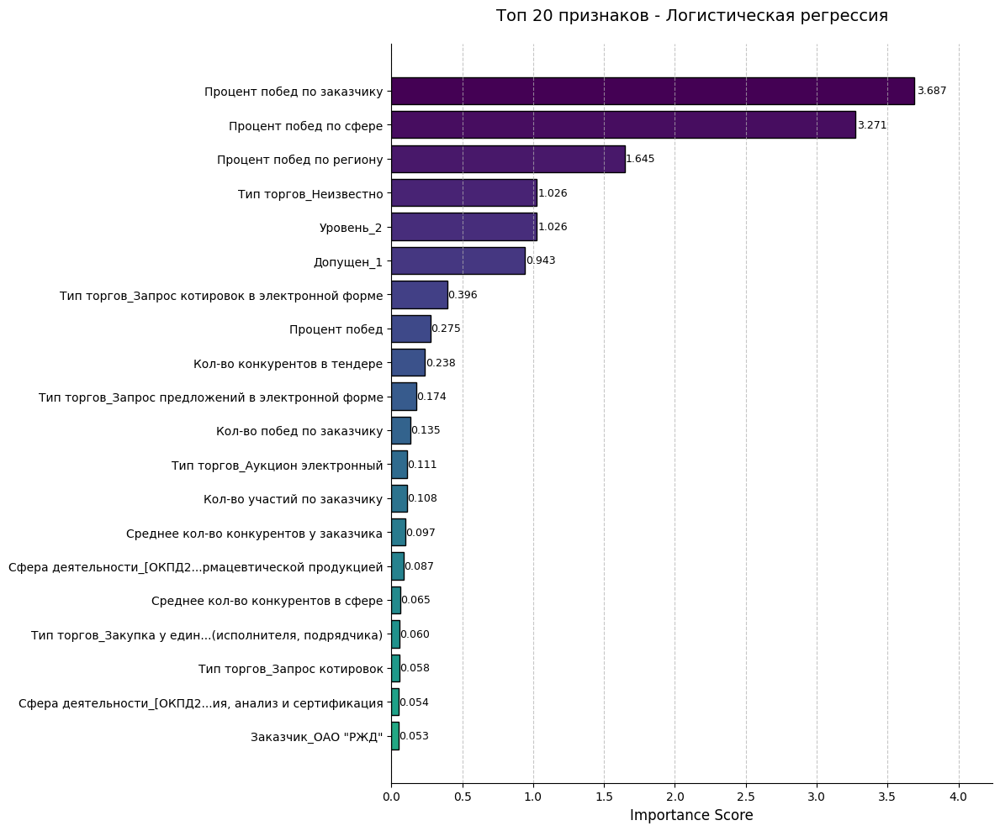


Топ важных признаков:
                                               feature  importance
2                           Процент побед по заказчику    3.686653
3                               Процент побед по сфере    3.271021
1                             Процент побед по региону    1.645235
18                                           Уровень_2    1.026408
108                              Тип торгов_Неизвестно    1.026408
99                                           Допущен_1    0.943425
103    Тип торгов_Запрос котировок в электронной форме    0.396130
0                                        Процент побед    0.275122
12                        Кол-во конкурентов в тендере    0.237891
105  Тип торгов_Запрос предложений в электронной форме    0.173616
9                            Кол-во побед по заказчику    0.134577
100                     Тип торгов_Аукцион электронный    0.110836
6                          Кол-во участий по заказчику    0.107986
7               Среднее кол-во конкурен

In [ ]:
trained_preprocessor = log_reg_rs.best_estimator_.named_steps['preprocessor']

feature_names = []
feature_names.extend(percent_features)
feature_names.extend(numerical_features)
feature_names.extend(time_features)

for feature in categorical_features:
    encoder = trained_preprocessor.named_transformers_['categorical']
    categories = encoder.categories_[categorical_features.index(feature)][1:]
    feature_names.extend([f"{feature}_{cat}" for cat in categories])

trained_classifier = log_reg_rs.best_estimator_.named_steps['classifier']

importances = np.abs(trained_classifier.coef_[0])

importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
})

importance_df = importance_df.sort_values('importance', ascending=False)

plot_feature_importance(importance_df, "Топ 20 признаков - Логистическая регрессия")

Логистическая регрессия Metrics:
Accuracy: 0.8092
Precision: 0.9877
Recall: 0.7373
F1-Score: 0.8444
ROC-AUC: 0.8924
TPR: 0.7373
[[15155   334]
 [ 9588 26914]]

Confusion Matrix:


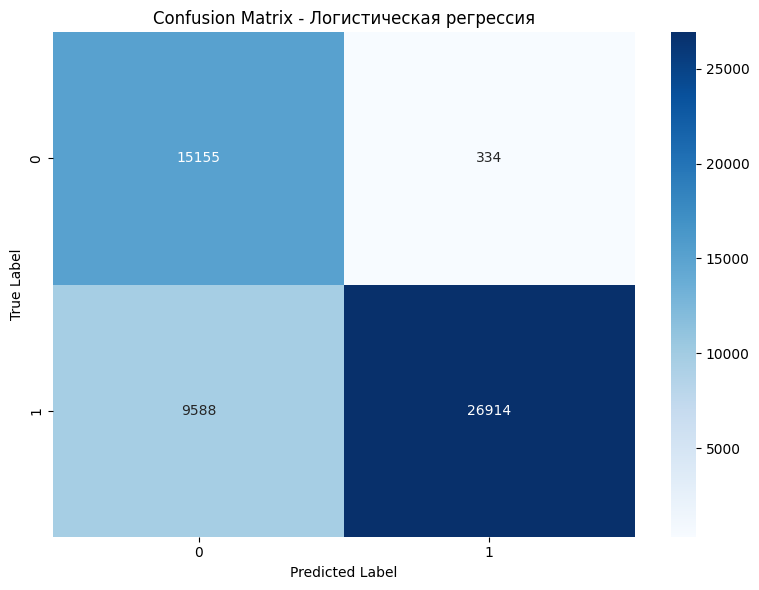

In [ ]:
evaluate_model("Логистическая регрессия", y_test, y_test_pred, y_test_pred_proba)

In [ ]:
model_info = {
    'model': log_reg_rs.best_estimator_,
    'best_params': log_reg_rs.best_params_,
    'cv_best_score': log_reg_rs.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns)
}

dump(model_info, 'log_reg_info.joblib')

['log_reg_info.joblib']

## Naive Bayes

In [59]:
preprocessor_gaussian = ColumnTransformer(
    transformers=[
        ('percent_features', 'passthrough', percent_features),
        ('count_features', RobustScaler(), numerical_features),
        ('categorical', OneHotEncoder(
            drop='first',
            sparse_output=False,
            handle_unknown='ignore'
        ), categorical_features)
    ])

pipeline_gaussian = Pipeline([
    ('preprocessor', preprocessor_gaussian),
    ('classifier', GaussianNB())
])

param_grid_gaussian = {
    'classifier__var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6],
    'classifier__priors': [None] 
}

grid_search_gaussian = GridSearchCV(
    pipeline_gaussian,
    param_grid_gaussian,
    scoring='recall',
    cv=None,
    n_jobs=1
)

grid_search_gaussian.fit(X_train, y_train, classifier__sample_weight=train_weights)

print("Наивный Байес (Гауссовский):")
print("\nЛучшие параметры:")
print(grid_search_gaussian.best_params_)

y_val_pred_gaussian = grid_search_gaussian.predict(X_val)
y_val_pred_proba_gaussian = grid_search_gaussian.predict_proba(X_val)[:, 1]

val_recall_gaussian = recall_score(y_val, y_val_pred_gaussian)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall_gaussian:.4f}")

Наивный Байес (Гауссовский):

Лучшие параметры:
{'classifier__priors': None, 'classifier__var_smoothing': 1e-06}

Результаты на валидационной выборке:
Recall: 0.6040


In [73]:
y_test_pred = grid_search_gaussian.predict(X_test)
y_test_pred_proba = grid_search_gaussian.predict_proba(X_test)[:, 1]

test_recall = recall_score(y_test, y_test_pred)

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")


Результаты на тестовой выборке:
Recall: 0.7854


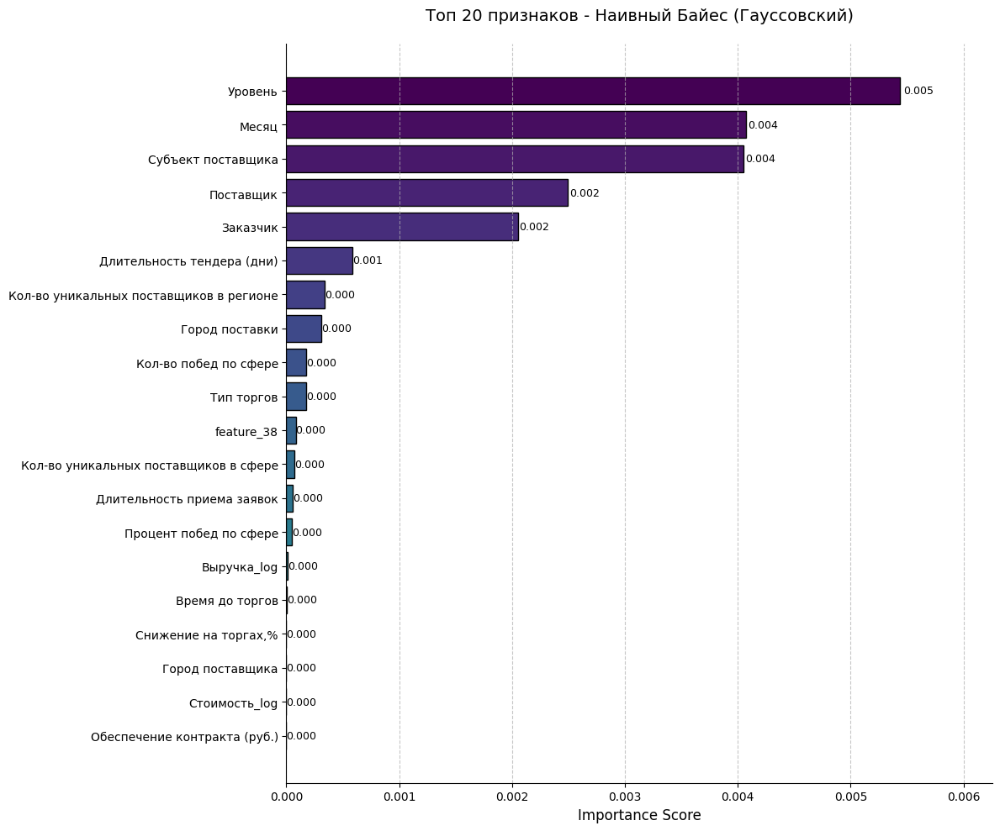


Топ важных признаков:
                                    feature  importance
26                                  Уровень    0.005441
25                                    Месяц    0.004070
34                       Субъект поставщика    0.004050
33                                Поставщик    0.002493
31                                 Заказчик    0.002052
13               Длительность тендера (дни)    0.000585
14  Кол-во уникальных поставщиков в регионе    0.000337
32                           Город поставки    0.000310
8                     Кол-во побед по сфере    0.000179
29                               Тип торгов    0.000172
38                               feature_38    0.000083
15    Кол-во уникальных поставщиков в сфере    0.000069
16               Длительность приема заявок    0.000055
23                   Процент побед по сфере    0.000048
2                               Выручка_log    0.000014
17                          Время до торгов    0.000007
20                     Сн

In [79]:
feature_names = get_feature_names_nb(
    grid_search_gaussian.best_estimator_.named_steps['preprocessor'],
    numerical_features, percent_features, time_features, categorical_features
)

result_gaussian = permutation_importance(
    grid_search_gaussian.best_estimator_, 
    X_val, y_val, 
    n_repeats=5,
    random_state=42,
    scoring='recall'
)

gaussian_feature_names = feature_names.copy()
if len(gaussian_feature_names) != len(result_gaussian.importances_mean):
    if len(gaussian_feature_names) > len(result_gaussian.importances_mean):
        gaussian_feature_names = gaussian_feature_names[:len(result_gaussian.importances_mean)]
    else:
        gaussian_feature_names = gaussian_feature_names + [f'feature_{i}' for i in range(
            len(gaussian_feature_names), len(result_gaussian.importances_mean))]

importance_df_gaussian = pd.DataFrame({
    'feature': gaussian_feature_names,
    'importance': result_gaussian.importances_mean
})
importance_df_gaussian = importance_df_gaussian.sort_values('importance', ascending=False)

plot_feature_importance(importance_df_gaussian, "Топ 20 признаков - Наивный Байес (Гауссовский)")

GaussianNB Metrics:
Accuracy: 0.6835
Precision: 0.7629
Recall: 0.7968
F1-Score: 0.7795
ROC-AUC: 0.875
TPR: 0.7968
[[ 6451  9038]
 [ 7419 29083]]

Confusion Matrix:


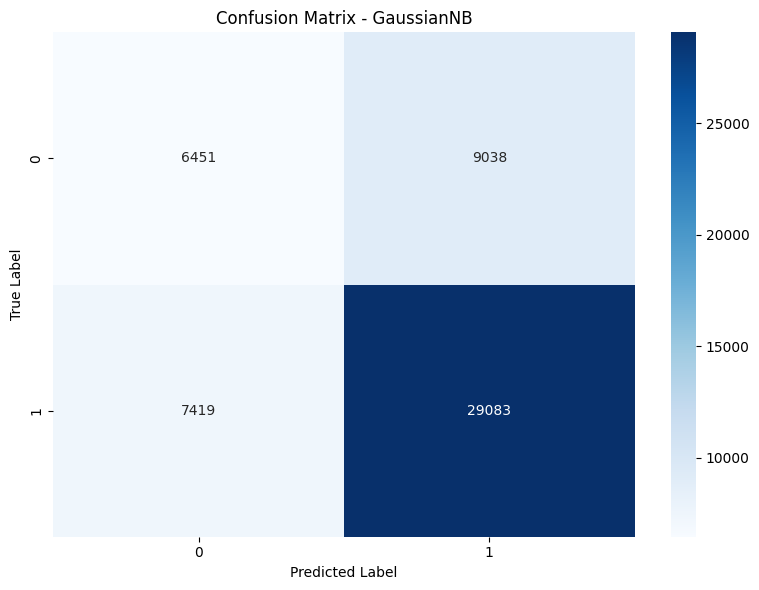

In [70]:
evaluate_model("GaussianNB", y_test, y_test_pred, y_test_pred_proba)

In [71]:
model_info = {
    'model': grid_search_gaussian.best_estimator_,
    'best_params': grid_search_gaussian.best_params_,
    'cv_best_score': grid_search_gaussian.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns)
}

dump(model_info, 'gnb_info.joblib')

['gnb_info.joblib']

## Random Forest

In [ ]:
# Удаляем ненужные столбцы
X_train = X_train.drop(cols_to_drop, axis=1)
X_val = X_val.drop(cols_to_drop, axis=1)
X_test = X_test.drop(cols_to_drop, axis=1)

In [ ]:
rf_preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', 'passthrough', numerical_features),

        ('ordinal', OrdinalEncoder(
            handle_unknown='use_encoded_value',
            unknown_value=-1
        ), ordinal_features)
    ],
    verbose_feature_names_out=False
)

pipeline_rf = Pipeline([
    ('preprocessor', rf_preprocessor),
    ('classifier', RandomForestClassifier(random_state=42, n_jobs=-1))
])

param_grid_rf = {
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [20, 30],
    'classifier__min_samples_split': [5, 10],
    'classifier__min_samples_leaf': [1, 2]
}

rf_rs = RandomizedSearchCV(
    pipeline_rf,
    param_grid_rf,
    scoring='recall',
    cv=None,
    n_jobs=1 
)

y_train = y_train.values.ravel()

rf_rs.fit(X_train, y_train, classifier__sample_weight=train_weights)

print("Random Forest:")
print("\nЛучшие параметры:")
print(rf_rs.best_params_)

y_val_pred = rf_rs.predict(X_val)
y_val_pred_proba = rf_rs.predict_proba(X_val)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

y_test_pred = rf_rs.predict(X_test)
y_test_pred_proba = rf_rs.predict_proba(X_test)[:, 1]

test_recall = recall_score(y_test, y_test_pred)

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

Random Forest:

Лучшие параметры:
{'classifier__n_estimators': 200, 'classifier__min_samples_split': 10, 'classifier__min_samples_leaf': 1, 'classifier__max_depth': 20}

Результаты на валидационной выборке:
Recall: 0.6983

Результаты на тестовой выборке:
Recall: 0.8308


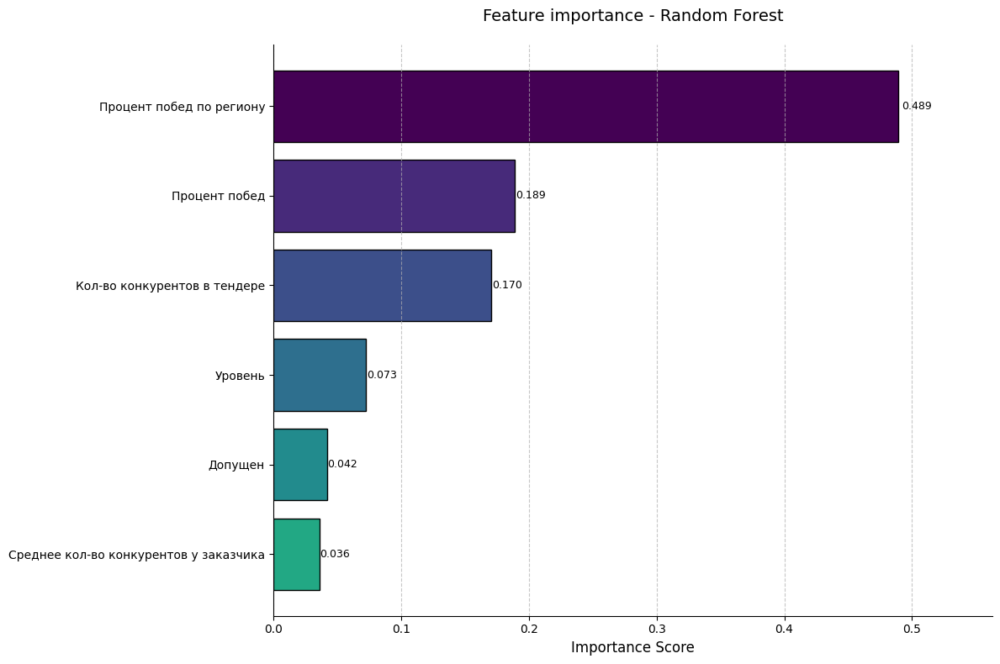


Топ важных признаков:
                                  feature  importance
3                Процент побед по региону    0.489495
2                           Процент побед    0.188916
0            Кол-во конкурентов в тендере    0.170461
5                                 Уровень    0.072713
4                                 Допущен    0.042010
1  Среднее кол-во конкурентов у заказчика    0.036405


In [ ]:
trained_preprocessor = rf_rs.best_estimator_.named_steps['preprocessor']
trained_rf = rf_rs.best_estimator_.named_steps['classifier']

feature_names = numerical_features + ordinal_features
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': trained_rf.feature_importances_
})

plot_feature_importance(importance_df, "Feature importance - Random Forest")

Random Forest Metrics:
Accuracy: 0.8059
Precision: 0.8856
Recall: 0.8308
F1-Score: 0.8573
ROC-AUC: 0.8748
TPR: 0.8308
[[11572  3917]
 [ 6175 30327]]

Confusion Matrix:


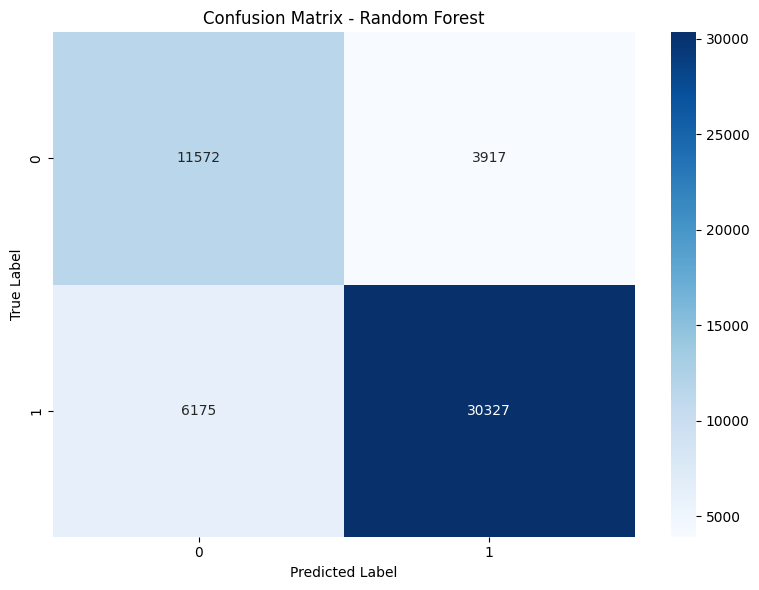

In [ ]:
evaluate_model("Random Forest", y_test, y_test_pred, y_test_pred_proba)

In [ ]:
model_info = {
    'model': rf_rs.best_estimator_,
    'best_params': rf_rs.best_params_,
    'cv_best_score': rf_rs.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns)
}

dump(model_info, 'random_forest_info.joblib')

['random_forest_info.joblib']

## Decision Tree

In [ ]:
dt_preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', 'passthrough', numerical_features),
        ('ordinal', OrdinalEncoder(
            handle_unknown='use_encoded_value',
            unknown_value=-1
        ), ordinal_features)
    ],
    verbose_feature_names_out=False
)

pipeline_dt = Pipeline([
    ('preprocessor', dt_preprocessor),
    ('classifier', DecisionTreeClassifier(random_state=42))
])

param_grid_dt = {
    'classifier__max_depth': [5, 10, 15],
    'classifier__min_samples_split': [2, 5],
    'classifier__min_samples_leaf': [2, 4]
}

dt_rs = RandomizedSearchCV(
    pipeline_dt,
    param_grid_dt,
    scoring='recall',
    cv=None,
    n_jobs=1
)

dt_rs.fit(X_train, y_train, classifier__sample_weight=train_weights)

print("Decision Tree:")
print("\nЛучшие параметры:")
print(dt_rs.best_params_)

y_val_pred = dt_rs.predict(X_val)
y_val_pred_proba = dt_rs.predict_proba(X_val)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

y_test_pred = dt_rs.predict(X_test)
y_test_pred_proba = dt_rs.predict_proba(X_test)[:, 1]

test_recall = recall_score(y_test, y_test_pred)

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

Decision Tree:

Лучшие параметры:
{'classifier__min_samples_split': 2, 'classifier__min_samples_leaf': 4, 'classifier__max_depth': 10}

Результаты на валидационной выборке:
Recall: 0.5674

Результаты на тестовой выборке:
Recall: 0.7540


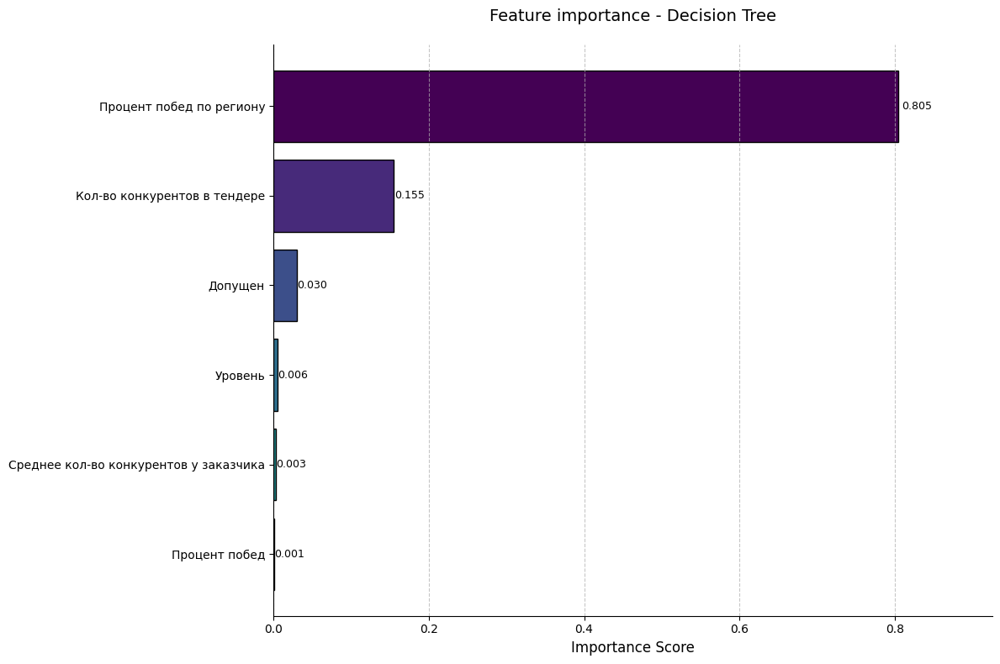


Топ важных признаков:
                                  feature  importance
3                Процент побед по региону    0.804635
0            Кол-во конкурентов в тендере    0.155323
4                                 Допущен    0.030221
5                                 Уровень    0.005618
1  Среднее кол-во конкурентов у заказчика    0.003003
2                           Процент побед    0.001200


In [ ]:
trained_preprocessor = dt_rs.best_estimator_.named_steps['preprocessor']
trained_dt = dt_rs.best_estimator_.named_steps['classifier']

feature_names = numerical_features + ordinal_features
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': trained_dt.feature_importances_
})

plot_feature_importance(importance_df, "Feature importance - Decision Tree")

Decision Tree Metrics:
Accuracy: 0.7555
Precision: 0.8806
Recall: 0.754
F1-Score: 0.8124
ROC-AUC: 0.8585
TPR: 0.754
[[11756  3733]
 [ 8981 27521]]

Confusion Matrix:


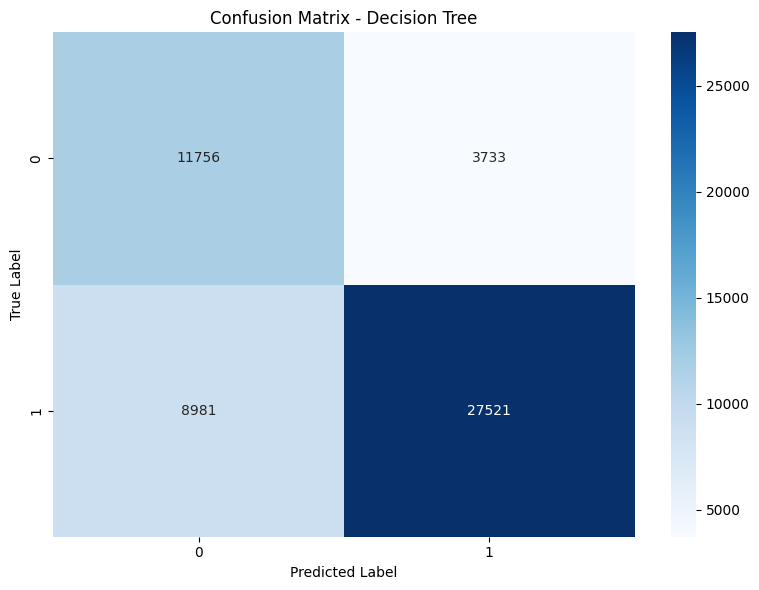

In [ ]:
evaluate_model("Decision Tree", y_test, y_test_pred, y_test_pred_proba)

In [ ]:
model_info = {
    'model': dt_rs.best_estimator_,
    'best_params': dt_rs.best_params_,
    'cv_best_score': dt_rs.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns)
}

dump(model_info, 'decision_tree_info.joblib')

['decision_tree_info.joblib']

## XGBoost

In [ ]:
xgboost_preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', 'passthrough', numerical_features),
        ('ordinal', OrdinalEncoder(
            handle_unknown='use_encoded_value',
            unknown_value=-1
        ), ordinal_features)
    ],
    verbose_feature_names_out=False
)

pipeline_xgb = Pipeline([
    ('preprocessor', xgboost_preprocessor),
    ('classifier', xgb.XGBClassifier(
        random_state=42,
        eval_metric='logloss',
        #use_label_encoder=False
    ))
])

param_grid_xgb = {
    'classifier__n_estimators': range(10, 1000, 50),
    'classifier__max_depth': [3, 4, 5],
    'classifier__learning_rate': [0.05, 0.1],
    'classifier__subsample': [0.7, 0.8],
    'classifier__colsample_bytree': [0.7, 0.8]
}

xgb_rs = RandomizedSearchCV(
    pipeline_xgb,
    param_grid_xgb,
    # n_iter=50,
    scoring='recall',
    cv=None,
    n_jobs=1
)

xgb_rs.fit(X_train, y_train, classifier__sample_weight=train_weights)

print("XGBoost:")
print("\nЛучшие параметры:")
print(xgb_rs.best_params_)

y_val_pred = xgb_rs.predict(X_val)
y_val_pred_proba = xgb_rs.predict_proba(X_val)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

y_test_pred = xgb_rs.predict(X_test)
y_test_pred_proba = xgb_rs.predict_proba(X_test)[:, 1]

test_recall = recall_score(y_test, y_test_pred)

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

XGBoost:

Лучшие параметры:
{'classifier__subsample': 0.7, 'classifier__n_estimators': 260, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.1, 'classifier__colsample_bytree': 0.8}

Результаты на валидационной выборке:
Recall: 0.6521

Результаты на тестовой выборке:
Recall: 0.8266


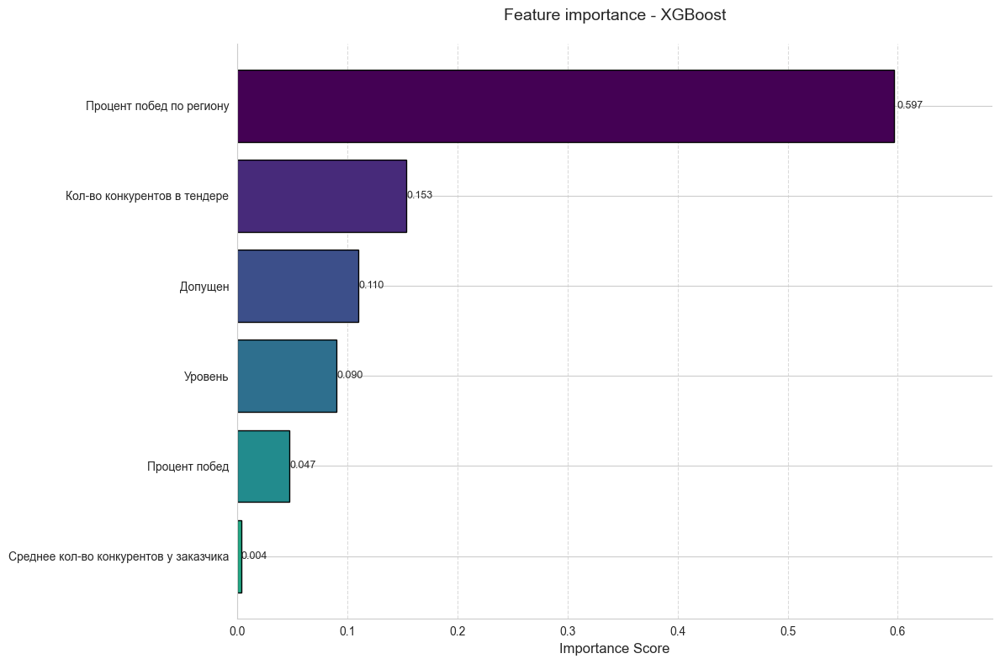

In [ ]:
trained_preprocessor = xgb_rs.best_estimator_.named_steps['preprocessor']
trained_xgb = xgb_rs.best_estimator_.named_steps['classifier']

feature_names = numerical_features + ordinal_features
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': trained_xgb.feature_importances_
})

plot_feature_importance(importance_df, "Feature importance - XGBoost")

XGBoost Metrics:
Accuracy: 0.8072
Precision: 0.891
Recall: 0.8266
F1-Score: 0.8576
ROC-AUC: 0.8759
TPR: 0.8266
[[11798  3691]
 [ 6331 30171]]

Confusion Matrix:


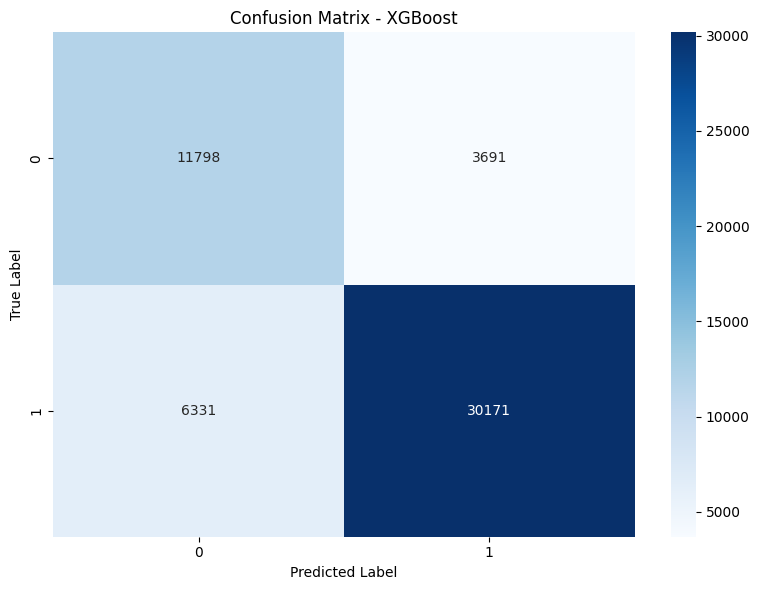

In [ ]:
evaluate_model("XGBoost", y_test, y_test_pred, y_test_pred_proba)

## AdaBoost

In [ ]:
adab_preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', 'passthrough', numerical_features),
        ('ordinal', OrdinalEncoder(
            handle_unknown='use_encoded_value',
            unknown_value=-1
        ), ordinal_features)
    ],
    verbose_feature_names_out=False
)

pipeline_ada = Pipeline([
    ('preprocessor', adab_preprocessor),
    ('classifier', AdaBoostClassifier(
        estimator=DecisionTreeClassifier(),
        random_state=42
    ))
])

param_grid_ada = {
    'classifier__n_estimators': randint(50, 500),
    'classifier__learning_rate': loguniform(0.01, 1.0),
    'classifier__estimator__max_depth': [1, 2, 3],
    'classifier__estimator__min_samples_split': randint(2, 15)
}

ada_rs = RandomizedSearchCV(
    pipeline_ada,
    param_grid_ada,
    # n_iter=50,
    scoring='recall',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)

ada_rs.fit(X_train, y_train, classifier__sample_weight=train_weights)

y_val_pred = ada_rs.predict(X_val)
y_val_pred_proba = ada_rs.predict_proba(X_val)[:, 1]

y_test_pred = ada_rs.predict(X_test)
y_test_pred_proba = ada_rs.predict_proba(X_test)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

test_recall = recall_score(y_test, y_test_pred)

print("AdaBoost:")
print("\nЛучшие параметры:")
print(ada_rs.best_params_)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
AdaBoost:

Лучшие параметры:
{'classifier__estimator__max_depth': 1, 'classifier__estimator__min_samples_split': 4, 'classifier__learning_rate': np.float64(0.5246634533625282), 'classifier__n_estimators': 184}

Результаты на валидационной выборке:
Recall: 0.4849

Результаты на тестовой выборке:
Recall: 0.5520


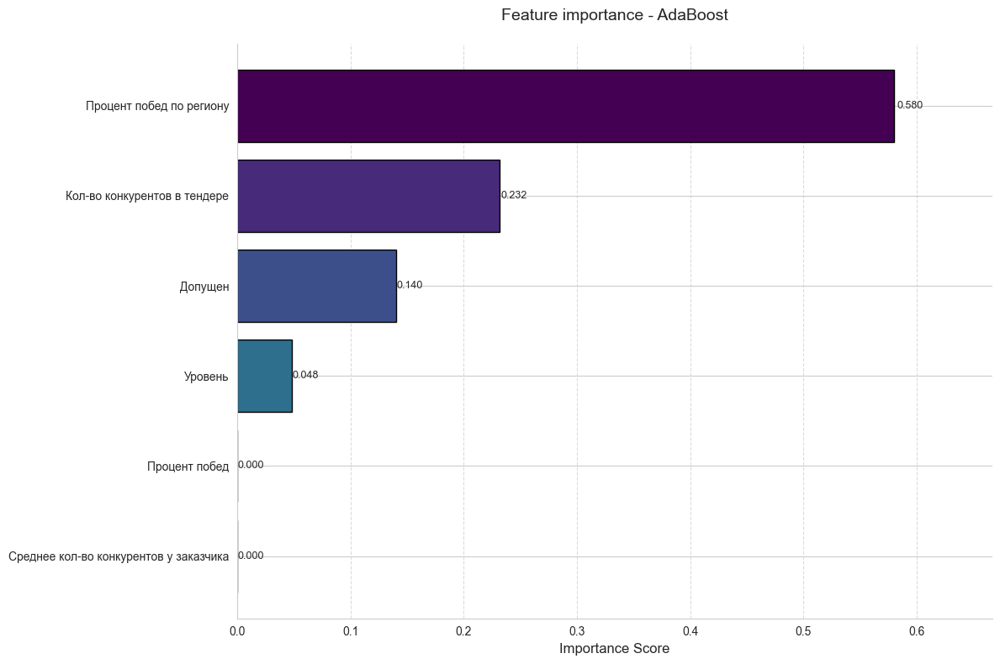

In [ ]:
trained_preprocessor = ada_rs.best_estimator_.named_steps['preprocessor']
trained_ada = ada_rs.best_estimator_.named_steps['classifier']

feature_names = numerical_features + ordinal_features
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': trained_ada.feature_importances_
})

plot_feature_importance(importance_df, "Feature importance - AdaBoost")

AdaBoost Metrics:
Accuracy: 0.6618
Precision: 0.9426
Recall: 0.552
F1-Score: 0.6962
ROC-AUC: 0.8598
TPR: 0.552
[[14261  1228]
 [16353 20149]]

Confusion Matrix:


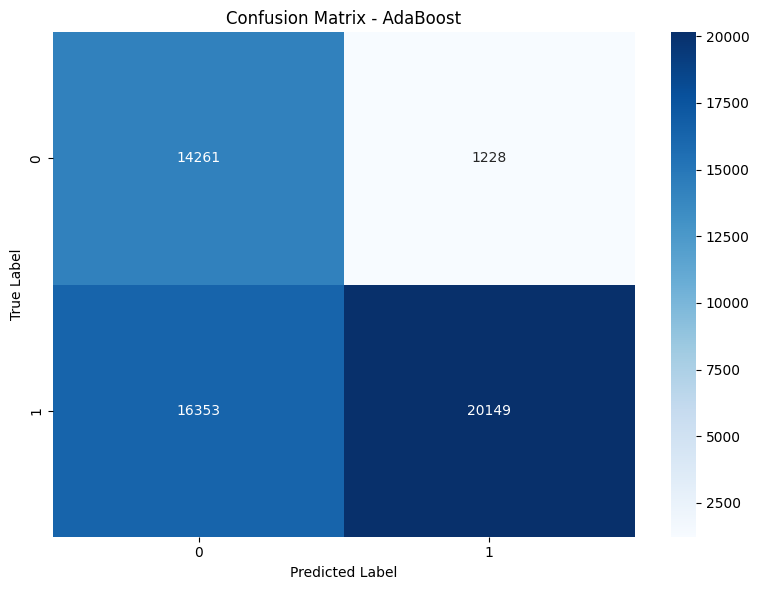

In [ ]:
evaluate_model("AdaBoost", y_test, y_test_pred, y_test_pred_proba)

In [ ]:
model_info = {
    'model': ada_rs.best_estimator_,
    'best_params': ada_rs.best_params_,
    'cv_best_score': ada_rs.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns),
}

dump(model_info, 'adaboost_info.joblib')

['adaboost_info.joblib']

In [ ]:
lightgbm_preprocessor = ColumnTransformer(
    transformers=[
        ('numerical', 'passthrough', numerical_features),
        ('ordinal', OrdinalEncoder(
            handle_unknown='use_encoded_value',
            unknown_value=-1
        ), ordinal_features)
    ],
    verbose_feature_names_out=False
)


pipeline_lgb = Pipeline([
    ('preprocessor', lightgbm_preprocessor),
    ('classifier', lgb.LGBMClassifier(
        random_state=42,
        objective='binary',
        metric='binary_logloss',
        verbose=-1,
        boosting_type='gbdt'
    ))
])

param_grid_lgb = {
    'classifier__n_estimators': [100, 200],
    'classifier__max_depth': [3, 4],
    'classifier__learning_rate': [0.05, 0.1],
    'classifier__num_leaves': [15, 31],
    'classifier__subsample': [0.7, 0.8],
    'classifier__reg_lambda': [0.0, 0.5]
}

lgbm_rs = RandomizedSearchCV(
    pipeline_lgb,
    param_grid_lgb,
    n_iter=50,
    scoring='recall',
    cv=None,
    n_jobs=1
)

lgbm_rs.fit(X_train, y_train, classifier__sample_weight=train_weights)

print("LightGBM:")
print("\nЛучшие параметры:")
print(lgbm_rs.best_params_)

y_val_pred = lgbm_rs.predict(X_val)
y_val_pred_proba = lgbm_rs.predict_proba(X_val)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

y_test_pred = lgbm_rs.predict(X_test)
y_test_pred_proba = lgbm_rs.predict_proba(X_test)[:, 1]

test_recall = recall_score(y_test, y_test_pred)

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

LightGBM:

Лучшие параметры:
{'classifier__subsample': 0.7, 'classifier__reg_lambda': 0.0, 'classifier__num_leaves': 15, 'classifier__n_estimators': 200, 'classifier__max_depth': 4, 'classifier__learning_rate': 0.05}

Результаты на валидационной выборке:
Recall: 0.6542

Результаты на тестовой выборке:
Recall: 0.8275


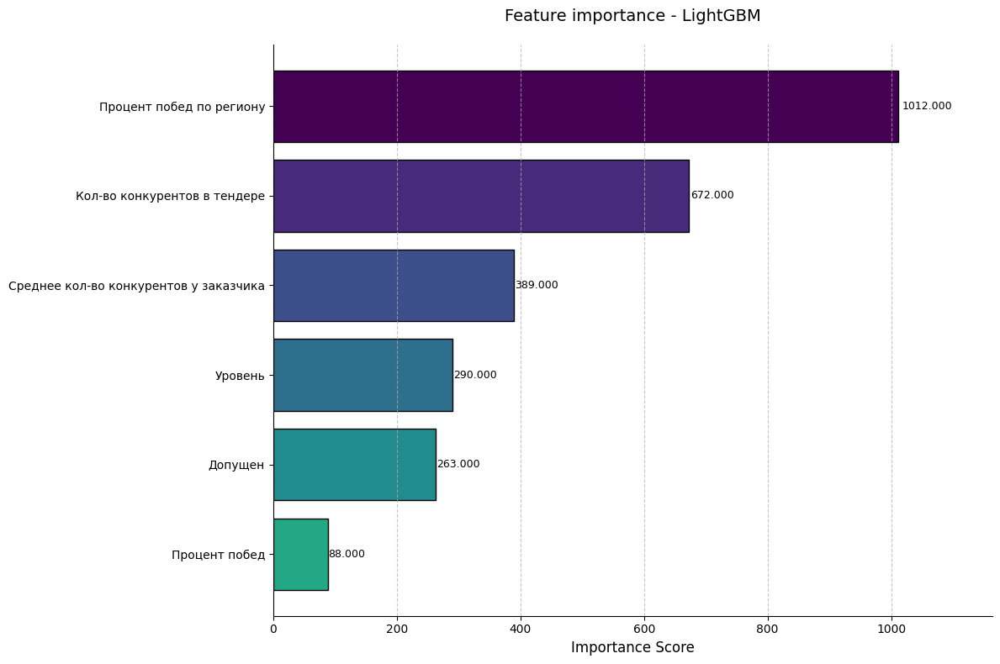


Топ важных признаков:
                                  feature  importance
3                Процент побед по региону        1012
0            Кол-во конкурентов в тендере         672
1  Среднее кол-во конкурентов у заказчика         389
5                                 Уровень         290
4                                 Допущен         263
2                           Процент побед          88


In [ ]:
trained_preprocessor = lgbm_rs.best_estimator_.named_steps['preprocessor']
trained_lgbm = lgbm_rs.best_estimator_.named_steps['classifier']

feature_names = numerical_features + ordinal_features
importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': trained_lgbm.feature_importances_
})

plot_feature_importance(importance_df, "Feature importance - LightGBM")

LightGBM Metrics:
Accuracy: 0.8079
Precision: 0.891
Recall: 0.8275
F1-Score: 0.8581
ROC-AUC: 0.8628
TPR: 0.8275
[[11795  3694]
 [ 6296 30206]]

Confusion Matrix:


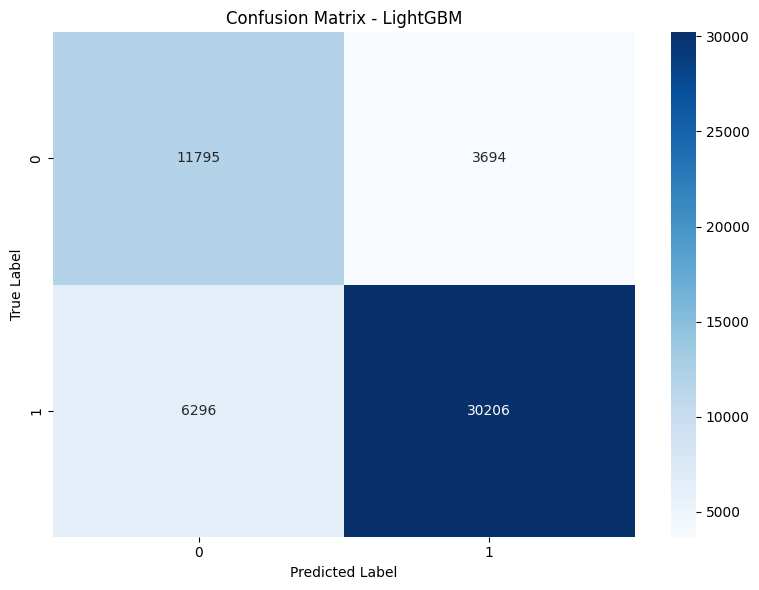

In [ ]:
evaluate_model("LightGBM", y_test, y_test_pred, y_test_pred_proba)

In [ ]:
model_info = {
    'model': lgbm_rs.best_estimator_,
    'best_params': lgbm_rs.best_params_,
    'cv_best_score': lgbm_rs.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns)
}

dump(model_info, 'lgbm_info.joblib')

['lgbm_info.joblib']

## Catboost

In [ ]:
catboost_params = {
    'iterations': randint(100, 1000),
    'learning_rate': loguniform(0.01, 0.3),
    'depth': randint(4, 10),
    'l2_leaf_reg': loguniform(1e-8, 100),
    'bagging_temperature': uniform(0.0, 1.0),
    'random_strength': loguniform(1e-8, 10),
    'border_count': randint(32, 255),
    'grow_policy': ['SymmetricTree', 'Depthwise', 'Lossguide'],
    'auto_class_weights': ['None', 'Balanced', 'SqrtBalanced']
}

catboost_rs = RandomizedSearchCV(
    estimator=CatBoostClassifier(
        random_state=42,
        verbose=False,
        thread_count=-1
    ),
    param_distributions=catboost_params,
    n_iter=5,
    scoring='recall',
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)

catboost_rs.fit(
    X_train,
    y_train,
    cat_features=None 
)

y_val_pred = catboost_rs.predict(X_val)
y_val_pred_proba = catboost_rs.predict_proba(X_val)[:, 1]

y_test_pred = catboost_rs.predict(X_test)
y_test_pred_proba = catboost_rs.predict_proba(X_test)[:, 1]

val_recall = recall_score(y_val, y_val_pred)

test_recall = recall_score(y_test, y_test_pred)

print("CatBoost:")
print("\nЛучшие параметры:")
print(catboost_rs.best_params_)

print("\nРезультаты на валидационной выборке:")
print(f"Recall: {val_recall:.4f}")

print("\nРезультаты на тестовой выборке:")
print(f"Recall: {test_recall:.4f}")

Fitting 5 folds for each of 5 candidates, totalling 25 fits
CatBoost:

Лучшие параметры:
{'auto_class_weights': 'SqrtBalanced', 'bagging_temperature': np.float64(0.6803075385877797), 'border_count': 104, 'depth': 5, 'grow_policy': 'SymmetricTree', 'iterations': 415, 'l2_leaf_reg': np.float64(0.004294199118583401), 'learning_rate': np.float64(0.037094276752507684), 'random_strength': np.float64(1.3921828195600071e-08)}

Результаты на валидационной выборке:
Recall: 0.6371

Результаты на тестовой выборке:
Recall: 0.8162


/var/folders/d5/3r484lmx4rx7jdlt6zl0_bkc0000gn/T/ipykernel_1887/962619106.py:31: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


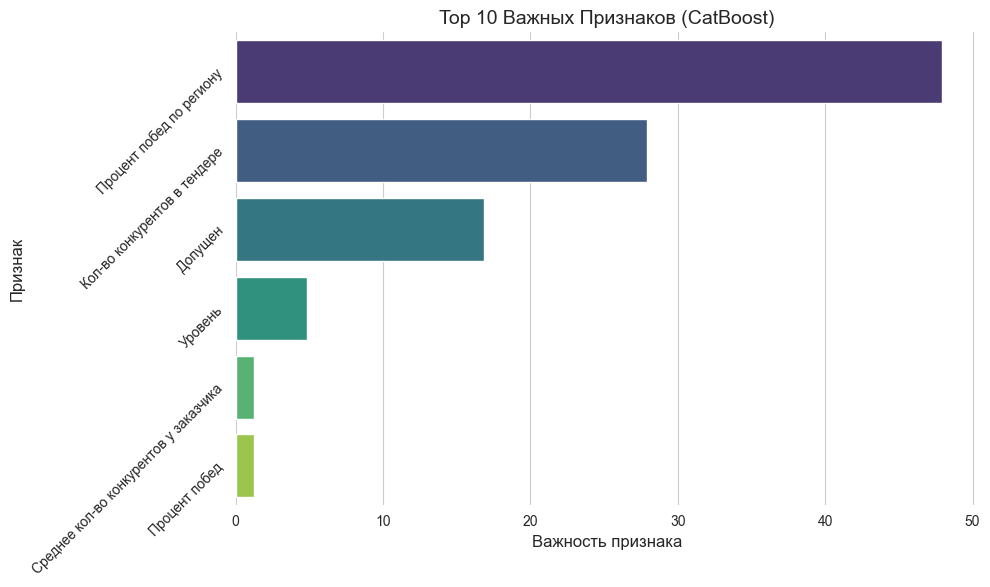

In [ ]:
best_model = catboost_rs.best_estimator_
importances = best_model.feature_importances_

eature_names = X_train.columns if hasattr(X_train, 'columns') else [f"feature_{i}" for i in range(X_train.shape[1])]

feature_importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': importances
})

feature_importance_df = feature_importance_df.sort_values(by='importance', ascending=False)

top_n = 10
top_features = feature_importance_df.head(top_n)

plt.figure(figsize=(10, 6))
sns.barplot(
    x='importance',
    y='feature',
    data=top_features,
    palette='viridis'
)

plt.title('Top {} Важных Признаков (CatBoost)'.format(top_n), fontsize=14)
plt.xlabel('Важность признака', fontsize=12)
plt.ylabel('Признак', fontsize=12)

plt.yticks(rotation=45)
sns.despine(left=True, bottom=True)

plt.tight_layout()
plt.show()

CatBoost Metrics:
Accuracy: 0.8065
Precision: 0.8989
Recall: 0.8162
F1-Score: 0.8555
ROC-AUC: 0.8734
TPR: 0.8162
[[12138  3351]
 [ 6710 29792]]

Confusion Matrix:


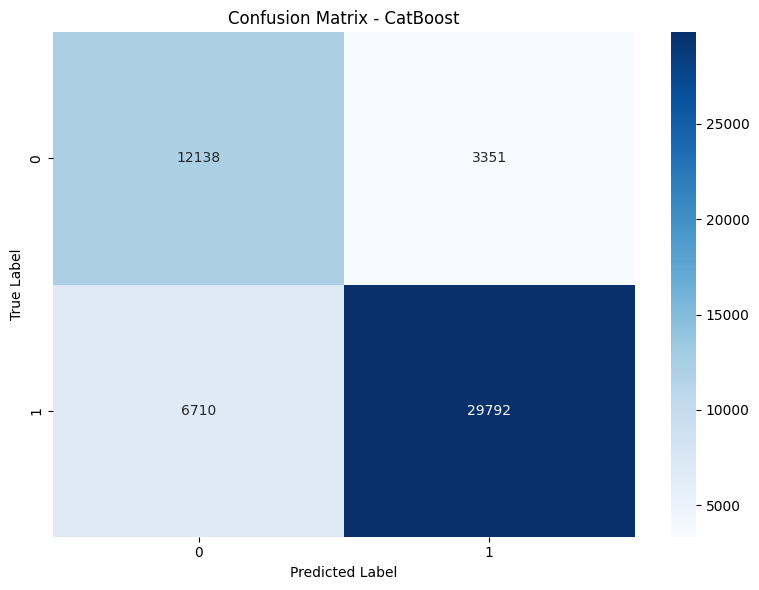

In [ ]:
evaluate_model("CatBoost", y_test, y_test_pred, y_test_pred_proba)

In [ ]:
model_info = {
    'model': catboost_rs.best_estimator_,
    'best_params': catboost_rs.best_params_,
    'cv_best_score': catboost_rs.best_score_,
    'validation_metrics': {'recall': val_recall},
    'test_metrics': {'recall': test_recall},
    'features': list(X_train.columns),
}

dump(model_info, 'catboost_info.joblib')

['catboost_info.joblib']